# ECE 209AS Lab 3: Kalman Filtering

## Imports

In [1]:
import math
import numpy as np
from numpy import linalg as LA
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from shapely.geometry import Polygon, Point, LineString
from shapely.ops import cascaded_union, unary_union
from tqdm import tqdm_notebook
import os, os.path
import imageio
import time
from copy import copy, deepcopy
from filterpy.stats import plot_covariance_ellipse
import statistics
from sklearn.metrics import mean_squared_error 

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

# Setting seed for reproduceable results
seed = 42
np.random.seed(seed)

## Classes

In [2]:
# Global schemes: use the following different color schemes to suit different purposes
# - format: {name: [edge color, line with, face color, optional: radius for points]}
#                                          ^ if not None, then we fill the object

# generic block-style drawings
flat_land = {
    'background': ['w', 0, 'w'],
    'bounds': ['black', 2, None],
    'robot_init': ['blue', 3, 'lightblue'],
    'robot_moved': ['orangered', 3, 'lightsalmon'],
    'goal': ['chocolate', 2, 'gold'],
    'point_init': ['blue', 2, None, 3],
    'point_moved': ['orangered', 2, None, 3],
    'point_goal': ['chocolate', 2, None, 3],
    'edge': ['lightsalmon', 2, None],
    'edge_goal': ['gold', 2, None],
    'sensor_bearing': ['darkred', 2, None],
    'sensor_range': ['lightsalmon', 2, None]
}

class Plotter:
    # Color Scheme format: {name: [color, [edge color, line width (only used if fill)]], ...}
    color_scheme = None
    environment = None
    high_def = None
    
    def __init__(self, environment, color_scheme=None, obstacles=None, high_def=False, obstacle_lim=4):
        self.environment = environment
        self.high_def = high_def
        if color_scheme is not None:
            self.color_scheme = color_scheme
        else:
            self.color_scheme = flat_land
            
    @staticmethod
    def plot_object(point_set, scheme, scalex=True, scaley=True):
        if type(point_set) is not list:
            point_set = [point_set]
        for points in point_set:
            if scheme[2] is not None: # if filled
                plt.fill(*points, edgecolor=scheme[0], linewidth=scheme[1], facecolor=scheme[2])
            else:
                plt.plot(*points, color=scheme[0], linewidth=scheme[1], scalex=scalex, scaley=scaley)
                
    @staticmethod
    def plot_lines(lines, scheme):
        for line in lines:
            p1 = line[0]
            p2 = line[1]
            self.plot_object(LineString([(p1[0], p2[0]), (p1[1], p2[1])]).coords, self.color_scheme['edge'])
            
    def initialize_figure(self, xi, title=None):
        # get ratio of x:y
        fig_x = 10
        xy_rat = self.environment.getW() / self.environment.getL()
        fig_y = fig_x / xy_rat
        plt.figure(figsize=(fig_x, fig_y), dpi=80)
        
        if title is not None:
            plt.title(title)
            
        # Plot background
        self.plot_object(self.environment.toShapely(border=50).exterior.xy, self.color_scheme['background'],
                         scalex=False, scaley=False)
            
        # Plot robot
        if xi is not None:
            self.plot_object(xi.toPlot(high_def=self.high_def, scheme=self.color_scheme['robot_init']), 
                             self.color_scheme['robot_init'])

        # Plot state space
        self.plot_object(self.environment.toShapely(border=self.color_scheme['bounds'][1]).exterior.xy, 
                         self.color_scheme['bounds'])
            
    def plot_event(self, event, title=None, save_to=None):
        '''
        Plot the robot in it's environment along with sensor readings
        '''
        x_t = event.getX_t()
        u_t = event.getU_t()
        v_t = event.getV_t()
        
        # initialize figure/env
        self.initialize_figure(xi=None, title=title)
        
        # plot the original robot
        self.plot_object(x_t.toPlot(high_def=self.high_def, scheme=self.color_scheme['robot_moved']), 
                         self.color_scheme['robot_moved'])
        
        # plot sensor readings
        if v_t is not None:
            sensor_objs = v_t.toPlot()
            for sensor_obj in sensor_objs:
                self.plot_object(sensor_obj[0], self.color_scheme[sensor_obj[1]], scalex=False, scaley=False)
        
        # draw/save plot
        if save_to is not None:
            plt.savefig(save_to + ".jpg")
            plt.close()
        else:
            plt.show()

In [3]:
class Animator:
    events = []
    output_path = None
    
    def __init__(self, events=None):
        if events is not None:
            self.events = events
        
    def eventGif(self, gif_name, environment, color_scheme, high_def, show_gif=False):
        self.output_path = gif_name + '_output_{}-frames'.format(len(self.events))
        
        # create the output folder if it doesn't exist:
        if not os.path.exists(self.output_path):
            os.mkdir(self.output_path)
        
        plotter = Plotter(environment=environment, color_scheme=color_scheme, high_def=high_def)
        
        for i, ev in enumerate(tqdm_notebook(self.events)):
            title = 'Frame {}'.format(i)
            plotter.plot_event(ev, save_to=os.path.join(self.output_path, '{}_{}'.format(gif_name, title)))
            
        # create a gif out of the images we saved:
        images = []
        for i in range(len(self.events)):
            images.append(imageio.imread(os.path.join(self.output_path, '{}_Frame {}.jpg'.format(gif_name, i))))
        imageio.mimsave(os.path.join(self.output_path, '{}.gif'.format(gif_name)), images, duration=1/(len(self.events)))
        
        # Load the created gif
        if show_gif:
            with open(os.path.join(self.output_path, '{}.gif'.format(gif_name)),'rb') as f:
                return display.Image(data=f.read(), format='gif')
        
    def trajectoryGif(self, gif_name, state_space, goal_space, color_scheme, obstacle_space, high_def):
        assert len(self.states_per_frame) > 0
        
        self.output_path = gif_name + '_output_{}-frames'.format(len(self.events))
        
        # create the output folder if it doesn't exist:
        if not os.path.exists(self.output_path):
            os.mkdir(self.output_path)
        
        if (self.obstacle_lim is not None):
            plotter = Plotter(state_space=state_space, goal_space=goal_space, color_scheme=color_scheme, 
                          obstacle_space=obstacle_space, high_def=high_def, obstacle_lim=self.obstacle_lim)
        else:
            plotter = Plotter(state_space=state_space, goal_space=goal_space, color_scheme=color_scheme, 
                          obstacle_space=obstacle_space, high_def=high_def)
        
        for i, state in enumerate(tqdm_notebook(self.states_per_frame)):
            title = 'Frame {}'.format(i)
            plotter.plot_state(x_next=state, title=title, saveto=os.path.join(self.output_path, 
                                                                              '{}_{}'.format(gif_name, title)))
            
        # create a gif out of the images we saved:
        images = []
        for i in range(len(self.states_per_frame)):
            images.append(imageio.imread(os.path.join(self.output_path, '{}_Frame {}.jpg'.format(gif_name, i))))
        imageio.mimsave(os.path.join(self.output_path, '{}.gif'.format(gif_name)), images, 
                        duration=1/(len(self.states_per_frame)))
        
        # Load the created gif (NOT DISPLAYING)
        #with open(os.path.join(self.output_path, '{}.gif'.format(gif_name)),'rb') as f:
        #    return display.Image(data=f.read(), format='gif')
        
    def connectionsGif(self, e_intermediate, gif_name, state_space, goal_space, color_scheme, obstacle_space, high_def,
                       goal_vert=None, render_last=True):
        self.output_path = gif_name + '_output_{}-frames'.format(len(self.states_per_frame))
        
        # create the output folder if it doesn't exist:
        if not os.path.exists(self.output_path):
            os.mkdir(self.output_path)
            
        for idx, edge_group in enumerate(tqdm_notebook(e_intermediate)):
            if (self.obstacle_lim is not None):
                plotter = Plotter(state_space=state_space, goal_space=goal_space, color_scheme=color_scheme, 
                              obstacle_space=obstacle_space, high_def=high_def, obstacle_lim=self.obstacle_lim)
            else:
                plotter = Plotter(state_space=state_space, goal_space=goal_space, color_scheme=color_scheme, 
                              obstacle_space=obstacle_space, high_def=high_def)


            title = 'Iteration {}'.format(edge_group+1)
            is_last = (idx == len(e_intermediate) - 1)
            plotter.plot_edges(edges=e_intermediate[edge_group], title=title, is_last=is_last, goal_vert=goal_vert,
                               saveto=os.path.join(self.output_path, '{}_{}'.format(gif_name, title)))
            if is_last and render_last:
                plotter.plot_edges(edges=e_intermediate[edge_group], title=title, is_last=is_last, goal_vert=goal_vert)
            
        # create a gif out of the images we saved:
        images = []
        for edge_group in e_intermediate:
            title = 'Iteration {}'.format(edge_group+1)
            images.append(imageio.imread(os.path.join(self.output_path, '{}_{}.jpg'.format(gif_name, title))))
        imageio.mimsave(os.path.join(self.output_path, '{}.gif'.format(gif_name)), images, 
                        duration=0.5)
        
        # Load the created gif (NOT DISPLAYING)
        #with open(os.path.join(self.output_path, '{}.gif'.format(gif_name)),'rb') as f:
        #    return display.Image(data=f.read(), format='gif')        

## 2 Mathematical setup

The robot will be driving within a rectangular environment of length $L = 750mm$ and width $W = 500mm$, consisting
of 4 walls bounding an open space

In [4]:
class Obstacle:
    def __init__(self, x, y, W, H):
        self.x = x
        self.y = y
        self.W = W
        self.H = H
        
    # Getters/Setters
    def getW(self):
        return self.W
    def getH(self):
        return self.H
    def getX(self):
        return self.x
    def getY(self):
        return self.y
    
    # Helper Functions
    def toShapely(self, lw=0):
        return Polygon([(self.x+lw, self.y+lw), (self.x + self.W-lw, self.y+lw), 
                        (self.x + self.W-lw, self.y + self.H-lw), (self.x+lw, self.y + self.H-lw)])

class Environment:
    W = 500
    L = 750
    
    def __init__(self, W=None, L=None):
        if W is not None:
            self.W = W
        if L is not None:
            self.L = L
            
    def getW(self):
        return self.W
    def getL(self):
        return self.L
    
    # Helper Functions
    def toShapely(self, border=0):
        return Polygon([(-border, -border), (self.W+border, -border), (self.W+border, self.L+border), (-border, self.L+border)])
    
    def toObstacles(self, width=1):
        edge1 = Obstacle(0,0,self.W, -width)
        edge2 = Obstacle(0,0,-width, self.L)
        edge3 = Obstacle(self.W, self.L, width, -self.L)
        edge4 = Obstacle(0, self.L, self.W, width)
        return [edge1, edge2, edge3, edge4]
            
env = Environment()

In [5]:
class State: # x_t = (x,y) point and angle theta (in RADIANS)
    def __init__(self, x, y, theta, omega):
        self.x = x
        self.y = y
        self.theta = theta
        self.omega = omega
        
    # Getters/Setters
    def getX(self):
        return self.x
    def getY(self):
        return self.y
    def getTheta(self): # in radians
        return self.theta
    def getOmega(self): # in radians/sec
        return self.omega
    def __repr__(self):
        # overriding general get, to return the list of values:
        return repr([self.x, self.y, self.theta, self.omega])
    
    # Transformations
    def toVector(self):
        return [self.x, self.y, self.theta, self.omega]
    @staticmethod
    def getRotationMat(theta):
        # General Rotation Matrix, theta in radians
        rotation_mat = np.array([[np.cos(theta), -np.sin(theta)],
                                 [np.sin(theta), np.cos(theta)]])
        return rotation_mat
    def rotateCorners(self, four_corners):
        four_corners_rotated = np.dot(self.getRotationMat(self.theta-math.pi/2), four_corners)
        four_corners_rotated = four_corners_rotated + np.array([[self.x],[self.y]])
        rect = Polygon(four_corners_rotated.T)
        return rect
    def toShapely(self, lw=0):
        four_corners = np.array([[-(45-lw),(45-lw), (45-lw),-(45-lw)],[-(75-lw),-(75-lw),(25-lw),(25-lw)]])
        return self.rotateCorners(four_corners)
    def toPlot(self, high_def=True, scheme=None):
        lw = 0
        if scheme is not None and len(scheme) > 1:
            lw = scheme[1]
        lw = lw / 2
                
        return_arr = [self.toShapely(lw=lw).exterior.xy]
        if high_def:
            # return a robot with a couple of extra features (wheels plus pivot)
            
            # left wheel
            left_wheel_corners = np.array([[-(40-lw),-(35-lw), -(35-lw),-(40-lw)],[-(25-lw),-(25-lw), (25-lw),(25-lw)]])
            left_wheel_rect = self.rotateCorners(left_wheel_corners)
            return_arr.append(left_wheel_rect.exterior.xy)
            
            # right wheel
            right_wheel_corners = np.array([[(35-lw),(40-lw), (40-lw),(35-lw)],[-(25-lw),-(25-lw), (25-lw),(25-lw)]])
            right_wheel_rect = self.rotateCorners(right_wheel_corners)
            return_arr.append(right_wheel_rect.exterior.xy)
            
            # pivot
            pivot_corners = np.array([[-(lw),(lw), (lw),-(lw)],[-(lw),-(lw), (lw),(lw)]])
            pivot_rect = self.rotateCorners(pivot_corners)
            return_arr.append(pivot_rect.exterior.xy)
        return return_arr
    
    def toPoint(self, scheme=None):
        rad = 3
        if scheme is not None and len(scheme) > 3:
            rad = scheme[3]
            
        circle = Point(self.getX(), self.getY()).buffer(rad)
        return [circle.exterior.xy]
    
    # Costs
    def setCost(self, cost):
        self.cost = cost
    def getCost(self):
        return self.cost

In [6]:
class Observation:
    
    def __init__(self, range_front, range_right, imu_mag, imu_gyro, x_t=None):
        self.range_front = range_front
        self.range_right = range_right
        self.imu_mag = imu_mag
        self.imu_gyro = imu_gyro
        self.x_t = x_t
        
    def __repr__(self):
        return repr({
            'range front': self.range_front,
            'range right': self.range_right,
            'imu mag': self.imu_mag/(math.pi/180),
            'imu gyro': self.imu_gyro,
            'x_t': str(self.x_t)
        })
        
    @staticmethod
    def getRotationMat(theta):
        # General Rotation Matrix, theta in radians
        rotation_mat = np.array([[np.cos(theta), -np.sin(theta)],
                                 [np.sin(theta), np.cos(theta)]])
        return rotation_mat
        
    def toTuple(self):
        return (self.range_front, self.range_right, self.imu_mag, self.imu_gyro)
    
    def toVector(self):
        return [self.range_front, self.range_right, self.imu_mag, self.imu_gyro]
    
    def toShapely(self):
        assert self.x_t is not None # we need the state the robot is at to draw the shapes
        
        shapes = []
        
        # front range -> line pointing up
        front_line = np.array([[0, 0], [0, 0 + self.range_front]]) # [25, 25 + self.range_front]
        # rotate line to correct position
        front_line = np.dot(self.getRotationMat(self.x_t.getTheta()-math.pi/2), front_line)
        front_line = front_line + np.array([[self.x_t.getX()],[self.x_t.getY()]])
        shapes.append((LineString(front_line), "sensor_range"))
        
        # right range -> line pointing right
        right_line = np.array([[0, 0 + self.range_right], [0, 0]]) # [45, 45 + self.range_right]
        # rotate line to correct position
        right_line = np.dot(self.getRotationMat(self.x_t.getTheta()-math.pi/2), right_line)
        right_line = right_line + np.array([[self.x_t.getX()],[self.x_t.getY()]])
        shapes.append((LineString(right_line), "sensor_range"))
        
        # magnetometer -> line pointing in predicted forward direction
        mag_h = 40
        phi = self.imu_mag - self.x_t.getTheta()
        mag_line = np.array([[0, mag_h*math.sin(phi)], [0, mag_h*math.cos(phi)]])
        # rotate line to correct position
        mag_line = np.dot(self.getRotationMat(self.x_t.getTheta()-math.pi/2), mag_line)
        mag_line = mag_line + np.array([[self.x_t.getX()],[self.x_t.getY()]])
        shapes.append((LineString(mag_line), "sensor_bearing"))
        
        return shapes
    
    def toPlot(self):
        shapes = self.toShapely()
        objs = []
        for shape in shapes:
            if type(shape[0]) is LineString:
                objs.append((shape[0].coords, shape[1]))
            else:
                objs.append((shape[0].exterior.xy, shape[1]))
        return objs

class Event:
    
    def __init__(self, x_t, u_t, v_t):
        assert type(x_t) is State
        self.x_t = x_t
        self.u_t = u_t
        self.v_t = v_t
        
    def getX_t(self):
        return self.x_t
    def getU_t(self):
        return self.u_t
    def getV_t(self):
        return self.v_t
    
    def toDict(self):
        return {
            'x_t': self.x_t,
            'u_t': self.u_t,
            'v_t': self.v_t
        }

### 2(a). Define the complete system model. 

You will need to derive and present the mathematical equations describing this robot plant, including the appropriate sensor and actuator models and system dynamics. Note that you will need to amend the state of your robot from the previous lab in order to accomodate this specific collection of sensors. Be sure to clearly define and describe all variables and equations, and produce illustrative diagrams as necessary.

### 2(b). Include realistic noise terms into the model as appropriate, and numerically quantify their parameters.

#### Range Sensor

In [7]:
class RangeSensor:
    '''
    Given the placement of the sensor on the robot and the orientation of the robot, calculate the distance
    between the sensor and the nearest wall
    '''
    processing_time = 30e-3 + 0.8e-3  # delta_t cannot be less than the processing time of a sensor
    std_dev = std_dev= 36  # 3% at 120cm = 3.6 cm range, or 36 mm*
    
    def __init__(self, std_dev=None, right_sensor=False):
        if std_dev is not None:
            self.std_dev = std_dev
        self.right_sensor = right_sensor
        
    def ground_observation(self, x_t):
        '''
        x_t: the state of the robot, represented by [x, y, theta]
        right_sensor: whether the sensor is facing the robot's front (False) or right side (True)
        '''
        [x, y, theta, _] = x_t
        if (self.right_sensor):
            theta = theta - math.pi/2

        best_wall = None
        dist_best_wall = None

        # Find wall that right sensor hits
        try:
            distance_0 = x/math.cos(theta+math.pi)
            if (distance_0 >= 0):
                best_wall = 0
                dist_best_wall = distance_0
        except Exception as e:
            print("Exception",e)
        try:
            distance_1 = y/math.cos(theta+math.pi/2)
            if (distance_1 >= 0):
                if (dist_best_wall is None or distance_1 < dist_best_wall):
                    best_wall = 1
                    dist_best_wall = distance_1
        except Exception as e:
            print("Exception",e)
        try:
            distance_2 = (env.getL()-y)/math.cos(theta-math.pi/2)
            if (distance_2 >= 0):
                if (dist_best_wall is None or distance_2 < dist_best_wall):
                    best_wall = 2
                    dist_best_wall = distance_2
        except Exception as e:
            print("Exception",e)
        try:
            distance_3 = (env.getW()-x)/math.cos(theta)
            if (distance_3 >= 0):
                if (dist_best_wall is None or distance_3 < dist_best_wall):
                    best_wall = 3
                    dist_best_wall = distance_3
        except Exception as e:
            print("Exception",e)
            
        return dist_best_wall
    
    def noisy_observation(self, x_t):
        '''
        return a noisy version of the observation
        '''
        dist = self.ground_observation(x_t)
        noisy_dist = dist + np.random.normal(loc=0, scale=self.std_dev)
        return noisy_dist

#### Magnetometer sensor

In [8]:
class MagnetometerSensor:
    '''
    Given the orientation of the robot, calculate the rotation of the robot from the cartesian x-axis (90 degrees = North)
    '''
    processing_time = 0.125e-3  # delta_t cannot be less than the processing time of a sensor
    std_dev = 6.103515625e-5  # 14 bit precision out of 16 bits*
    
    def __init__(self, std_dev=None):
        if std_dev is not None:
            self.std_dev = std_dev
        
    def ground_observation(self, x_t):
        '''
        since the robot is already positions wrt the cartesian x-axis, this becomes a simple model
        '''
        [_, _, theta, _] = x_t
        return theta
    
    def noisy_observation(self, x_t):
        '''
        return a noisy version of the observation
        '''
        theta = self.ground_observation(x_t)
        noisy_theta = theta + np.random.normal(loc=0, scale=self.std_dev)
        return noisy_theta

#### Gyroscope sensor

In [9]:
class GyroscopeSensor:
    '''
    Given the orientation of the robot, calculate the angular velocity of the robot given a particular heading
    '''
    processing_time = 0.125e-3  # delta_t cannot be less than the processing time of a sensor
    std_dev = 0.1  # degree / s-rmse*
    
    def __init__(self, std_dev=None):
        if std_dev is not None:
            self.std_dev = std_dev
            
    def ground_observation(self, x_t, u_t, wheel_radius, robot_width):
        '''
        calculate angular velocity
        '''
        [Rl, Rr] = u_t
        [_, _, _, omega] = x_t

        return omega
    
    def noisy_observation(self, x_t, u_t, wheel_radius, robot_width):
        '''
        return a noisy version of the observation
        '''
        omega = self.ground_observation(x_t, u_t, wheel_radius, robot_width)
        noisy_omega = omega + np.random.normal(loc=0, scale=self.std_dev)
        return noisy_omega

#### Servo actuator

In [10]:
class ServoActuator:
    '''
    Model the dynamics of the servo motors attached to the robot
    '''
    max_motor = 60
    std_dev = 0.05 * max_motor  # std_dev = 5% of max motor speed
    right_servo = None
    
    def __init__(self, std_dev=None, right_servo=False):
        if std_dev is not None:
            self.std_dev = std_dev
        self.right_servo = right_servo
            
    def ground_actuation(self, u_t):
        '''
        ground truth model is simple given the u_t = [Rl, Rr]
        '''
        [Rl, Rr] = u_t
        target_motor = Rr if self.right_servo else Rl
        return target_motor
    
    def noisy_actuation(self, u_t):
        '''
        return a noisy version of the actuation
        '''
        actuation = self.ground_actuation(u_t)
        noisy_actuation = actuation + np.random.normal(loc=0, scale=self.std_dev)
        
        # clamp values to be between +/- max_motor speed
        noisy_actuation = max(min(noisy_actuation, self.max_motor), -self.max_motor)
        
        return noisy_actuation

#### System Model

In [11]:
class SystemModel:
    '''
    Modeling the entire system
    '''
    wheel_radius = 25
    robot_width = 90
    tail_length = 75
    d_t = -1  # fastest possible
    
    def __init__(self, wheel_radius=None, robot_width=None, tail_length=None, d_t=None, std_devs = [None, None, None, None, None, None]):
        '''
        std_devs is a list of length 6 corresponding to std_dev of
        [front range sensor, right rage sensor, magnetometer, gyroscope, servo_right, servo_left]
        '''

        # all parameters are in mm
        if wheel_radius is not None:
            self.wheel_radius = wheel_radius
        if robot_width is not None:
            self.robot_width = robot_width
        if tail_length is not None:
            self.tail_length = tail_length
        if d_t is not None:
            self.d_t = d_t
                    
        # initialize the robot's sensors:
        self.range_front = RangeSensor(right_sensor=False, std_dev = std_devs[0])
        self.range_right = RangeSensor(right_sensor=True, std_dev = std_devs[1])
        self.imu_mag     = MagnetometerSensor(std_dev = std_devs[2])
        self.imu_gyro    = GyroscopeSensor(std_dev = std_devs[3])
        self.sensors     = [self.range_front, self.range_right, self.imu_mag, self.imu_gyro]
        
        # initialize the robot's servo motors:
        self.right_servo = ServoActuator(std_dev=std_devs[4], right_servo=True)
        self.left_servo = ServoActuator(std_dev=std_devs[5], right_servo=False)
        
        # ensure that d_t is greater than the maximum sensor processing delay:
        max_delay = -1
        for sensor in self.sensors:
            max_delay = max(max_delay, sensor.processing_time)
        if self.d_t < max_delay:
            print('Setting d_t to {}, because sensors cannot process any faster'.format(max_delay))
            self.d_t = max_delay
    
    # Getters/Setters
    def getWheelRadius(self):
        return self.wheel_radius
    def getRobotWidth(self):
        return self.robot_width
    def getTailLength(self):
        return self.tail_length
    def getD_t(self):
        return self.d_t
    
    # Sensor readings
    def getObservation(self, x_t, u_t, noisy=True):
        '''
        For a given state and input for that state, observe the surroundings
        '''
        if noisy:
            front = self.range_front.noisy_observation(x_t.toVector())
            right = self.range_right.noisy_observation(x_t.toVector())
            mag = self.imu_mag.noisy_observation(x_t.toVector())
            omega = self.imu_gyro.noisy_observation(x_t.toVector(), u_t, self.wheel_radius, self.robot_width)
        else:
            front = self.range_front.ground_observation(x_t.toVector())
            right = self.range_right.ground_observation(x_t.toVector())
            mag = self.imu_mag.ground_observation(x_t.toVector())
            omega = self.imu_gyro.ground_observation(x_t.toVector(), u_t, self.wheel_radius, self.robot_width)
        
        return Observation(range_front=front, range_right=right, imu_mag=mag, imu_gyro=omega, x_t=x_t)
    
    # Actuator movement
    def getActuation(self, u_t, noisy=True):
        '''
        For a given input, actuate the motors
        '''
        if noisy:
            Rl = self.left_servo.noisy_actuation(u_t)
            Rr = self.right_servo.noisy_actuation(u_t)
        else:
            Rl = self.left_servo.ground_actuation(u_t)
            Rr = self.right_servo.ground_actuation(u_t)
        
        return [Rl, Rr]
    
    @staticmethod
    def getRotationMat(theta):
        # General Rotation Matrix, theta in radians
        rotation_mat = np.array([[math.cos(theta), -math.sin(theta)],
                                 [math.sin(theta), math.cos(theta)]])
        return rotation_mat
    
    def moveRobot(self, x_t, u_t, nonlinear=False):
            '''
            returns x_vect_t_1 from x_t and u_t for a specific amount of time
            '''
            [Rl, Rr] = u_t
            [x, y, theta, _] = x_t.toVector()
                
            [Vl, Vr] = [Rl*(2*math.pi*self.wheel_radius)/60, Rr*(2*math.pi*self.wheel_radius)/60]
            w = (Vr-Vl)/self.robot_width
            theta_t_1 = theta + (w)*self.d_t
            
            if nonlinear:
                # nonlinear version used for simulation
                
                if Vr == Vl:
                    # moving straight, handling this edge case:
                    h = Vl * self.d_t
                    x_t_1 = x + h*math.cos(theta_t_1)
                    y_t_1 = y + h*math.sin(theta_t_1)
                else:
                    R_ = self.robot_width/2*((Vl+Vr)/(Vr-Vl))
                    ICC = np.array([[x - R_*math.sin(theta), y + R_*math.cos(theta)]])
                    point_t = np.array([[x, y]])
                    point_t_1 = np.dot(point_t - ICC, self.getRotationMat(-w*self.d_t)) + ICC
                    x_t_1 = point_t_1[0][0]
                    y_t_1 = point_t_1[0][1]
                
                return State(x_t_1, y_t_1, theta_t_1, ((Vr-Vl)/self.robot_width))
            else:
                # linear (approximated) version of the model

                theta_average = theta + (w*self.d_t)/2
                v = (Vl+Vr)/2
                x_t_1 = x + v*self.d_t * math.cos(theta_average)
                y_t_1 = y + v*self.d_t * math.sin(theta_average)

                return State(x_t_1, y_t_1, theta_t_1, ((Vr-Vl)/self.robot_width))
    
    # Simulating movement (Real World)
    def simulateRobot(self, x_not, u_list):
        '''
        Run through the list of inputs and generate their corresponding states and observations as if they were
        being performed by a real robot following our model: y = f(x, u, w)
        x_not: start state
        u_list: list of inputs, defined one per d_t time interval
        '''
        events = []  # list of {x, u, v} truples that are recorded while simulating the robot
        
        # collect the series of events which occur by taking the list of inputs at each d_t time interval
        x_t = x_not
        events.append(Event(x_t=x_t,
                            u_t=None,
                            v_t=None))
        for u in u_list:
            u_t = self.getActuation(u)
            x_t = self.moveRobot(x_t, u_t, nonlinear=True)
            event = Event(x_t=x_t,
                          u_t=u_t,
                          v_t=self.getObservation(x_t, u_t))
            events.append(event)
        return events
    
    def simulateRobot2(self, x_not, u_list):
        '''
        Given a trajectory proven to connect each state with an arc, generate inputs that will acheive this trajectory
        '''
        # 1. Generate a trajectory proven to work (from the given u_list)
        events = self.simulateRobot(x_not, u_list)
        trajectory = [e.getX_t() for e in events]
        
        # 2. Generate a new u_list from this trajectory, knowing d_t
        u_list = self.trajectoryToInputs(trajectory)
        for i in range(len(events)-1):
            if abs(events[i+1].getU_t()[0] - u_list[i][0]) > 10e-7:
                raise Exception(events[i+1].getU_t()[0], '!=', u_list[i][0], '..', abs(events[i+1].getU_t()[0] - u_list[i][0]))
            
            if abs(events[i+1].getU_t()[1] - u_list[i][1]) > 10e-7:
                raise Exception(events[i+1].getU_t()[1], '!=', u_list[i][1], '..', abs(events[i+1].getU_t()[1] - u_list[i][1]))
        
        # 3. Simulate using the inputs generated from the 'hardcoded' trajectory in step 2
        events = self.simulateRobot(x_not, u_list)
        
        return events
    
    def trajectoryToInputs(self, trajectory):
        '''
        Given a trajectory proven to connect each state with an arc, generate inputs that will acheive this trajectory
        '''
        u_list = []
        
        for i in range(len(trajectory)-1):
        
            x_t = trajectory[i].getX()
            y_t = trajectory[i].getY()
            theta_t = trajectory[i].getTheta()

            x_t_1 = trajectory[i+1].getX()
            y_t_1 = trajectory[i+1].getY()
            theta_t_1 = trajectory[i+1].getTheta()
            
            ## use the full model to come up with the needed inputs
            point_t = np.array([[x_t, y_t]])
            point_t_1 = np.array([[x_t_1, y_t_1]])
            d_theta = theta_t_1 - theta_t
            
            # if d_theta is 0, then we are moving straight:
            if d_theta == 0:
                d_s = np.linalg.norm(point_t_1 - point_t)
                v = d_s / self.d_t
                
                # check whether we are moving forwards or backwards
                forwards = 1
                # determine which quadrant x_t_1 lies in:
                if x_t_1 >= x_t:
                    if y_t_1 >= y_t:
                        # quadrant 1
                        if math.sin(theta_t) < 0:
                            forwards = -1
                    else:
                        # quadrant 4
                        if math.sin(theta_t) >= 0:
                            forwards = -1
                else:
                    if y_t_1 >= y_t:
                        # quadrant 2
                        if math.sin(theta_t) < 0:
                            forwards = -1
                    else:
                        # quadrant 3
                        if math.sin(theta_t) >= 0:
                            forwards = -1
                
                Vl = forwards * v
                Vr = forwards * v
            else:
                # back out ICC
                Rot = self.getRotationMat(-d_theta)
                if np.linalg.matrix_rank(Rot) != Rot.shape[0]:
                    raise Exception('singular: ', Rot)
                Rot_inv = np.linalg.inv(Rot)

                if np.linalg.matrix_rank(np.eye(Rot.shape[0]) - Rot_inv) != (np.eye(Rot.shape[0]) - Rot_inv).shape[0]:
                    raise Exception('singular: ', np.eye(Rot.shape[0]) - Rot_inv)
                ICC = np.dot((point_t - np.dot(point_t_1, Rot_inv)), np.linalg.inv(np.eye(Rot.shape[0]) - Rot_inv))

                # back out R
                if abs(theta_t - 0) > 10e-9 and abs(theta_t - math.pi) > 10e-9:
                    R = (x_t - ICC[0][0])/math.sin(theta_t)
                else:
                    R = (ICC[0][1] - y_t)/math.cos(theta_t)

                # back out Vl and Vr
                Vl = d_theta/self.d_t*(R - self.robot_width/2)
                Vr = d_theta/self.d_t*(R + self.robot_width/2)

            Rr = Vr * 60 / (2*math.pi * self.wheel_radius)
            Rl = Vl * 60 / (2*math.pi * self.wheel_radius)

            u_list.append([Rl, Rr])
            
        return u_list
        
    
    # Ensure the simulated events do not move outside of the robot's environment
    def outOfBounds(self, events, environment):
        for event in events:
            x_t = event.getX_t()
            if x_t.getX() < 0 or x_t.getX() >= environment.getW():
                return True
            if x_t.getY() < 0 or x_t.getY() >= environment.getL():
                return True
        return False
    
    def toShapely(self, event):
        '''
        Convert the robot body and sensor readings into a list of shapes that can be plotted
        '''
        x_t = event.getX_t()
        u_t = event.getU_t()
        v_t = event.getV_t()
        
        robot = x_t.toShapely()
        sensors = v_t.toShapely()

### 2(c). Create a Kalman Filter based state estimator to take the motor commands and sensor measurements and generate a state estimate. 

You will likely want to to implement an Extended Kalman Filter (EKF), but you could choose an Unscented Kalman Filter (UKF) instead. Be sure to explain which algorithm you chose and why, and generate the resulting mathematical expressions.

#### Kalman Filter

In [12]:
class ExtendedKalmanFilter:
    '''
    Keep internal state (x and sigma) and perform time and observation updates
    '''
    def __init__(self, x_not, sigma_not, system_model, environment, simulation_name = 'Sim_'):
        '''
        x_not, sigma_not are the initial orientation and covariance
        system_model is the model used to give the real sensor readings
        '''
        self.x0 = x_not
        self.sigma = sigma_not
        self.system_model = system_model
        self.environment = environment
        self.simulation_name = simulation_name
        self.x_prev = None
        
    # Time Update
    
    def time_update(self, x_t, u, sigma_t):
        '''
        x = [x, y, theta, omega];
        u = [Rl, Rr];
        sigma = current covariance matrix
        '''
        
        d_t = self.system_model.getD_t()
        l = self.system_model.getRobotWidth()
        wheel_radius = self.system_model.getWheelRadius()
        
        [Rl, Rr] = u
        [x, y, theta, omega] = x_t.toVector()

        [Vl, Vr] = [Rl*(2*math.pi*wheel_radius)/60, Rr*(2*math.pi*wheel_radius)/60]

        w = (Vr-Vl)/l
        v = (Vl+Vr)/2

        # linearization
        theta_average = theta + (w*d_t)/2
        F_t = np.array([[1, 0, -v*math.sin(theta_average)*d_t, 0],
                        [0, 1, v*math.cos(theta_average)*d_t, 0],
                        [0, 0, 1, 0],
                        [0, 0, 0, 1]])
        W_t = np.array([[0.5*math.cos(theta_average)-v*d_t*0.5*(1/l)*math.sin(theta_average),  0.5*math.cos(theta_average)+v*d_t*0.5*(1/l)*math.sin(theta_average)],
                       [0.5*math.sin(theta_average)+v*d_t*0.5*(1/l)*math.cos(theta_average),  0.5*math.sin(theta_average)-v*d_t*0.5*(1/l)*math.cos(theta_average)],
                       [1/l, -1/l],
                       [1/(d_t*l), -1/(d_t*l)]])

        x_hat_t_1_ground = self.system_model.moveRobot(x_t, u, nonlinear=False)

        Q = np.array([[(Vl*0.05)**2,0],[0,(Vr*0.05)**2]]) # Updated Q with std devs

        WQW = np.dot(W_t, np.dot(Q, W_t.T))
        sigma_t_1 = np.dot(np.dot(F_t, sigma_t), F_t.T) + WQW

        return x_hat_t_1_ground, sigma_t_1
    
    # Observation Update
    
    def getGyroH(self, x_t, v):
        
        [x, y, theta, omega] = x_t.toVector()
        
        # given a constant omega between time steps, we can calculate theta_average and v:
        d_t = self.system_model.getD_t()
        theta_average = theta + omega*d_t
        
        if v is None:
            return [0, 0, 0, 1]
        else:
            l = self.system_model.getRobotWidth()
            dx_dVr = 0.5*math.cos(theta_average)+v*d_t*0.5*(1/l)*math.sin(theta_average)
            dy_dVr = 0.5*math.sin(theta_average)-v*d_t*0.5*(1/l)*math.cos(theta_average)

            dVr_dw = l*0.5

            dx_dw = dVr_dw*dx_dVr
            dy_dw = dVr_dw*dy_dVr

            return [dx_dw,dy_dw,0,1]
    
    def getLaserH(self, x_t, right_sensor = True):
        '''
        Returns a row of the H matrix for the laser sensor
        H includes derivatives for the sensor based on which wall it is sensing
        '''
        # right_sensor
        [x, y, theta, _] = x_t.toVector()
        if (right_sensor):
            theta = theta - math.pi/2
        derivatives_theta = {
            0: -(x/(math.cos(theta+math.pi)**2))*math.sin(theta+math.pi),
            1: -(y/(math.cos(theta+math.pi/2)**2))*math.sin(theta+math.pi/2),
            2: ((y-750)/(math.cos(theta-math.pi/2)**2))*math.sin(theta-math.pi/2),
            3: ((x-500)/(math.cos(theta)**2))*math.sin(theta)
        }
        derivatives_x = {
            0:1/math.cos(theta+math.pi),
            1:0,
            2:0,
            3:-1/math.cos(theta)
        }
        derivatives_y = {
            0:0,
            1:1/math.cos(theta+math.pi/2),
            2:-1/math.cos(theta-math.pi/2),
            3:0
        }
        derivatives_omega = {
            0:0,
            1:0,
            2:0,
            3:0
        }

        best_wall = None
        dist_best_wall = None

        # Find wall that right sensor hits
        try:
            distance_0 = x/math.cos(theta+math.pi)
            if (distance_0 >= 0):
                best_wall = 0
                dist_best_wall = distance_0
        except Exception as e:
            print("Exception",e)
        try:
            distance_1 = y/math.cos(theta+math.pi/2)
            if (distance_1 >= 0):
                if (dist_best_wall is None or distance_1 < dist_best_wall):
                    best_wall = 1
                    dist_best_wall = distance_1
        except Exception as e:
            print("Exception",e)
        try:
            distance_2 = (750-y)/math.cos(theta-math.pi/2)
            if (distance_2 >= 0):
                if (dist_best_wall is None or distance_2 < dist_best_wall):
                    best_wall = 2
                    dist_best_wall = distance_2
        except Exception as e:
            print("Exception",e)
        try:
            distance_3 = (500-x)/math.cos(theta)
            if (distance_3 >= 0):
                if (dist_best_wall is None or distance_3 < dist_best_wall):
                    best_wall = 3
                    dist_best_wall = distance_3
        except Exception as e:
            print("Exception",e)

        return [derivatives_x[best_wall], derivatives_y[best_wall], derivatives_theta[best_wall], derivatives_omega[best_wall]]
 
    def getH(self, x_t, v):
        '''
        Returns the entire H matrix (linearized matrix converting an X to expected sensor readings)
        Uses the derivative based on the specific wall each sensor will see
        '''
        return np.array([
            self.getLaserH(x_t, False),      # front laser derivatives
            self.getLaserH(x_t, True),       # right laser derivatives
            [0,0,1,0],                       # mag theta - directly proportional
            self.getGyroH(x_t, v)            # gyron derivatives
            #x,y,t,w
        ])
    
    def getSensorDistance(self, x_t, right_sensor=True):
        '''
        Returns the sensor distance given an estimated current x_t (for both right and forward sensors)
        '''
        [x, y, theta, _] = x_t.toVector()
        if (right_sensor):
            theta = theta - math.pi/2

        best_wall = None
        dist_best_wall = None

        try:
            distance_0 = x/math.cos(theta+math.pi)
            if (distance_0 >= 0):
                best_wall = 0
                dist_best_wall = distance_0
        except Exception as e:
            print("Exception",e)
        try:
            distance_1 = y/math.cos(theta+math.pi/2)
            if (distance_1 >= 0):
                if (dist_best_wall is None or distance_1 < dist_best_wall):
                    best_wall = 1
                    dist_best_wall = distance_1
        except Exception as e:
            print("Exception",e)
        try:
            distance_2 = (750-y)/math.cos(theta-math.pi/2)
            if (distance_2 >= 0):
                if (dist_best_wall is None or distance_2 < dist_best_wall):
                    best_wall = 2
                    dist_best_wall = distance_2
        except Exception as e:
            print("Exception",e)
        try:
            distance_3 = (500-x)/math.cos(theta)
            if (distance_3 >= 0):
                if (dist_best_wall is None or distance_3 < dist_best_wall):
                    best_wall = 3
                    dist_best_wall = distance_3
        except Exception as e:
            print("Exception",e)

        return dist_best_wall

    def getExpectedReadings(self, x_t):
        '''
        Returns all four expected sensor readings given an estimated position x_t
        '''
        [x, y, theta, omega] = x_t.toVector()
        return np.array([[self.getSensorDistance(x_t, False), self.getSensorDistance(x_t, True), theta, omega]]).T
    
    def observation_update(self, x_t, y_t, u, sigma_t, H_t):
        '''
        x = [x, y, theta, omega]
        u = [Rl, Rr]
        d_t is time between steps
        '''
        
        d_t = self.system_model.getD_t()
        l = self.system_model.getRobotWidth()
        wheel_radius = self.system_model.getWheelRadius()
        
        [Rl, Rr] = u
        [x, y, theta, omega] = x_t.toVector()

        [Vl, Vr] = [Rl*(2*math.pi*wheel_radius)/60, Rr*(2*math.pi*wheel_radius)/60]

        w = (Vr-Vl)/l

        R = np.array([[36**2,0,0,0],[0,36**2,0,0],[0,0,(6.103515625e-5)**2,0],[0,0,0,0.1**2]]) # updated R with std devs

        inv = np.linalg.inv(np.dot(H_t, np.dot(sigma_t, H_t.T)) + R)
        y_diff = np.array([y_t]).T - self.getExpectedReadings(x_t)

        x_t_1 = x_t.toVector() + np.dot(sigma_t, np.dot(H_t.T, np.dot(inv, y_diff))).T[0]

        K_t = np.dot(sigma_t, np.dot(H_t.T, inv))
        I_minus_Kt_H = np.eye(4) - np.dot(K_t, H_t)
        sigma_t_1 = np.dot(I_minus_Kt_H, np.dot(sigma_t, I_minus_Kt_H.T)) + np.dot(K_t, np.dot(R, K_t.T))

        return State(x_t_1[0], x_t_1[1], x_t_1[2], x_t_1[3]), sigma_t_1
    
    # Full Extended Kalman Filter
        
    def plotTrajectory(self, events, xs, ys, thetas, omegas, sigmas, covariance_step = 10, plot_size = 20):
        '''
        Plots the expected and obtained trajectories, as well as covariance ellipses
        covariance_step is the number of steps in between plotting ellipses
        '''
        
        if not os.path.exists('plots'):
            os.mkdir('plots')
        if not os.path.exists(os.path.join('plots', self.simulation_name)):
            os.mkdir(os.path.join('plots', self.simulation_name))
        
        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Expected Trajectory");
        xs2 = [self.x0.toVector()[0]]
        ys2 = [self.x0.toVector()[1]]
        thetas2 = [self.x0.toVector()[2]]
        omegas2 = [self.x0.toVector()[3]]
        for event in events[1:]:
            xs2.append(event.getX_t().toVector()[0])
            ys2.append(event.getX_t().toVector()[1])
            thetas2.append(event.getX_t().toVector()[2])
            omegas2.append(event.getX_t().toVector()[3])
        plt.plot(xs2, ys2, 'blue');
        plt.axis('scaled');
        plt.savefig(os.path.join('plots', self.simulation_name, 'Expected Trajectory' + '.png'))
        plt.show()

        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Obtained Trajectory (with Covariance Ellipses)");
        plt.plot(xs, ys, 'red')
        for i in range(0, len(events), covariance_step):
            plot_covariance_ellipse(
                (xs[i], ys[i]), np.array(sigmas[i])[0:2, 0:2],
                 facecolor='green', alpha=0.1)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Obtained Trajectory (with Covariance Ellipses)' + '.png'))
        plt.show()

        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Overlaid trajectories");
        plt.plot(xs, ys, 'red')
        plt.plot(xs2, ys2, 'blue')
        plt.axis('scaled')
        plt.savefig(os.path.join('plots', self.simulation_name, 'Overlaid trajectories' + '.png'))
        plt.show()

        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Combined Trajectories and Covariances");
        plt.plot(xs, ys, 'red')
        plt.plot(xs2, ys2, 'blue')
        for i in range(0, len(events), covariance_step):
            plot_covariance_ellipse(
                (xs[i], ys[i]), np.array(sigmas[i])[0:2, 0:2],
                 facecolor='green', alpha=0.3)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Combined Trajectories and Covariances' + '.png'))
        plt.show();
                 
        # Plot distance metrics

        # determine the distance between expected and obtained points
        dist = [math.sqrt((xs2[i] - xs[i])**2 + (ys2[i] - ys[i])**2) for i in range(len(xs))] 
        mean_dist = statistics.mean(dist)
        
        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("x and y difference between expected and obtained points");
        plt.xlabel("Trajectory step number")
        plt.ylabel("Difference in mm")
        plt.plot(dist)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Abs Euclidean diff' + '.png'))
        plt.show()
        
        # plot the average of every ten between expected and obtained points
        plt.figure(figsize = (plot_size,plot_size/2));
        dist = np.asarray(dist)
        avg_dist = np.mean(dist[:(len(dist)//10)*10].reshape(-1,10), axis=1)
        plt.title("Average Euclidean between expected and obtained points");
        plt.xlabel("Trajectory step number * 10")
        plt.ylabel("Difference in mm")
        plt.plot(avg_dist)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Average Euclidean diff' + '.png'))
        plt.show(); 
        
        # Plot theta metrics       

        # determine absolute difference in theta measurments
        dtheta = [abs(thetas[i] - thetas2[i]) for i in range(len(thetas))]
        rmse_theta = math.sqrt(mean_squared_error(thetas, thetas2))
        
        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Absolute difference between expected and obtained thetas")
        plt.xlabel("Trajectory step number")
        plt.ylabel("Difference in radians")
        plt.plot(dtheta)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Abs Theta diff' + '.png'))
        plt.show()
        
        # plot the average of every ten between expected and obtained thetas
        plt.figure(figsize = (plot_size,plot_size/2));
        dtheta = np.asarray(dtheta)
        avg_theta = np.mean(dtheta[:(len(dtheta)//10)*10].reshape(-1,10), axis=1)
        plt.title("Average absolute difference between expected and obtained thetas");
        plt.xlabel("Trajectory step number * 10")
        plt.ylabel("Difference in radians")
        plt.plot(avg_theta)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Average Theta diff' + '.png'))
        plt.show()
        
        # Plot omega metrics       
        
        # determine absolute difference in omega measurments
        domega = [abs(omegas[i] - omegas2[i]) for i in range(len(omegas))]
        rmse_omega = math.sqrt(mean_squared_error(omegas, omegas2))
        
        plt.figure(figsize = (plot_size,plot_size/2));
        plt.title("Absolute difference between expected and obtained omegas")
        plt.xlabel("Trajectory step number")
        plt.ylabel("Difference in radians/sec")
        plt.plot(domega)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Abs Omega diff' + '.png'))
        plt.show()
        
        # plot the average of every ten between expected and obtained omegas
        plt.figure(figsize = (plot_size,plot_size/2));
        domega = np.asarray(domega)
        avg_omega = np.mean(domega[:(len(domega)//10)*10].reshape(-1,10), axis=1)
        plt.title("Average absolute difference between expected and obtained omegas");
        plt.xlabel("Trajectory step number * 10")
        plt.ylabel("Difference in radians/sec")
        plt.plot(avg_omega)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Average Omega diff' + '.png'))
        plt.show(); 
        
        # Plot the relative "size" of the covariance matrix
        # Determine the "size" by finding determinant of sigma
        # (given by the product of the eigenvalues of the matrix)
        plt.figure(figsize = (plot_size,plot_size/2));        
        
        w, _ = LA.eig(sigmas)
        cov_sizes = [math.sqrt(w[i][0]*w[i][1]*w[i][2]*w[i][3]) for i in range(np.shape(w)[0]) if i != 0] # covariance "size"
        
        plt.title("Size of Covariance Matrix")
        plt.xlabel("Trajectory Step Number")
        plt.ylabel("Size of the Covariance Matrix")
        plt.plot(cov_sizes)
        plt.savefig(os.path.join('plots', self.simulation_name, 'Size of Covariance Matrix' + '.png'))
        plt.show()
        
        # Plot the sensor traces for this trajectory
        
        # plot laser sensors together:
        plt.figure(figsize=(15, 10), dpi=80)
        plt.title("Laser Range Traces")
        plt.xlabel("Trajectory Step Number")
        plt.ylabel("Distance in mm")
        plt.plot([event.getV_t().range_front if event.getV_t() is not None else None for event in events])
        plt.plot([event.getV_t().range_right if event.getV_t() is not None else None for event in events])
        plt.legend(['front', 'right'])
        plt.savefig(os.path.join('plots', self.simulation_name, 'Laser Traces' + '.png'))
        plt.show()
        
        # plot laser sensors together:
        plt.figure(figsize=(15, 10), dpi=80)
        plt.title("Magnetometer Trace")
        plt.xlabel("Trajectory Step Number")
        plt.ylabel("Heading in radians from x-axis")
        plt.plot([event.getV_t().imu_mag if event.getV_t() is not None else None for event in events])
        plt.savefig(os.path.join('plots', self.simulation_name, 'Mag Trace' + '.png'))
        plt.show()
        
        # plot laser sensors together:
        plt.figure(figsize=(15, 10), dpi=80)
        plt.title("Gyroscope Trace")
        plt.xlabel("Trajectory Step Number")
        plt.ylabel("Angular velocity in radians/s")
        plt.plot([event.getV_t().imu_gyro if event.getV_t() is not None else None for event in events])
        plt.savefig(os.path.join('plots', self.simulation_name, 'Gyro Trace' + '.png'))
        plt.show()
        
        # print statistics here
        print("------")
        print("Mean Euclidean difference between expected and obtained points is {} mm".format(mean_dist))
        print("------")
        print("RMSE of expected and obtained thetas is {} radians".format(rmse_theta))
        print("------")
        print("RMSE of expected and obtained omega is {} radians/second".format(rmse_omega))
        print("------")
        
        
    def makeTrajectoryGif(self, events, simulation_name, show_gif=False):
        # Plot the simulation
        plotter = Plotter(environment=self.environment, color_scheme=flat_land, high_def=True)
        anim = Animator(events)
        anim.eventGif(simulation_name, environment=self.environment, color_scheme=flat_land, high_def=True, show_gif=show_gif)
        
    def getVelocity(self, x_t, x_t_1):
        '''
        Return an estimate of our velocity
        '''
        theta_avg = (x_t_1.getTheta() + x_t.getTheta())/2
        if abs(theta_avg - 0) < 10e-9 or abs(theta_avg - math.pi) < 10e-9:
            v = (x_t_1.getX() - x_t.getX()) / math.cos(theta_avg)
        else:
            v = (x_t_1.getY() - x_t.getY()) / math.sin(theta_avg)
        return v/self.system_model.getD_t()
    
    def run(self, u_list, covariance_step = 10, plot = True, plot_size = 20, make_gif = False, known_x0 = True,
            show_gifs=False, with_velocity=False):
        '''
        Run all iterations of EKF from starting point, and plot output trajectory (expected/obtained)
        covariance_step is the number of steps in between plotting ellipses
        known_x0 is a boolean indicating whether or not our initial state is known
        '''
        
        events = model.simulateRobot2(self.x0, u_list)
        if model.outOfBounds(events, self.environment):
            raise Exception("ERROR: the inputs caused the robot to move out of its environment. Fix the inputs.")
        
        if (known_x0):
            x_t = self.x0
        else:
            x_t = State(np.random.random()*self.environment.getW(), np.random.random()*self.environment.getL(), np.random.random()*2*math.pi, np.random.random()*240/self.system_model.getRobotWidth() - 120/self.system_model.getRobotWidth())
        
        sigma_t = self.sigma
        xs = [x_t.toVector()[0]]
        ys = [x_t.toVector()[1]]
        thetas = [x_t.toVector()[2]]
        omegas = [x_t.toVector()[3]]
        sigmas = [sigma_t]
    
        for e_idx, event in enumerate(events[1:]):
            x_t_1, sigma_t_1 = self.time_update(x_t, event.getU_t(), sigma_t)
            v = None if not with_velocity else self.getVelocity(x_t, x_t_1)

            y = event.getV_t().toVector()
            y[2] = y[2]
            x_t, sigma_t = self.observation_update(x_t_1, y, event.getU_t(), sigma_t_1, self.getH(x_t_1, v))
            self.x_prev = x_t

            xs.append(x_t.getX())
            ys.append(x_t.getY())
            thetas.append(x_t.getTheta())
            omegas.append(x_t.getOmega())
            sigmas.append(sigma_t)
        
        if (plot):
            self.plotTrajectory(events, xs, ys, thetas, omegas, sigmas, covariance_step, plot_size)
        
        if (make_gif):
            self.makeTrajectoryGif(events, self.simulation_name, show_gif=show_gifs)

#### Initial Example, regular noise and initial state known (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


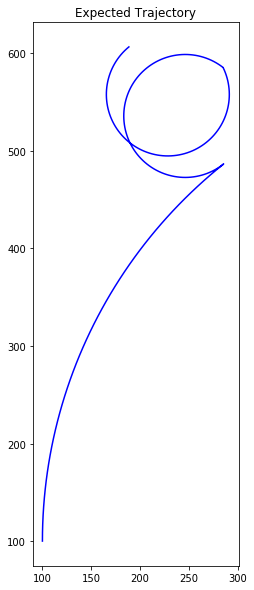

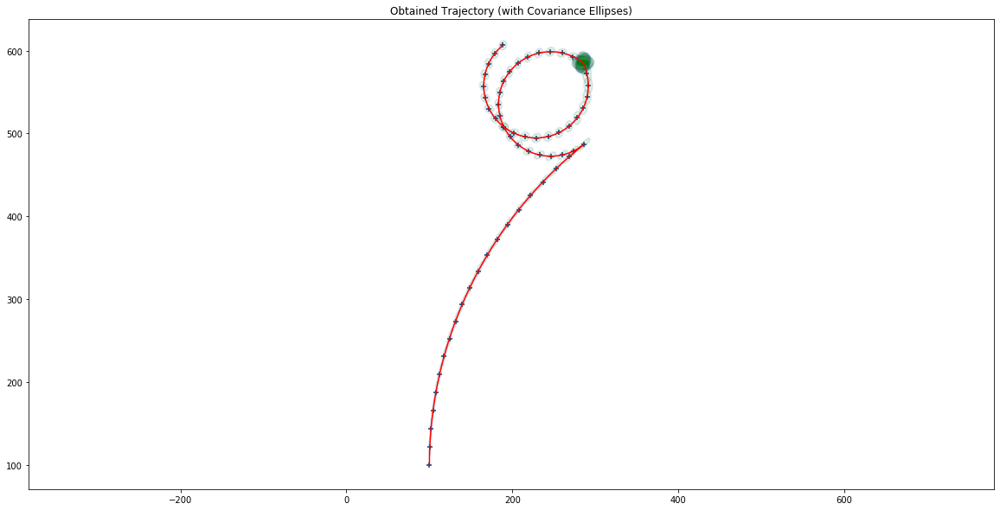

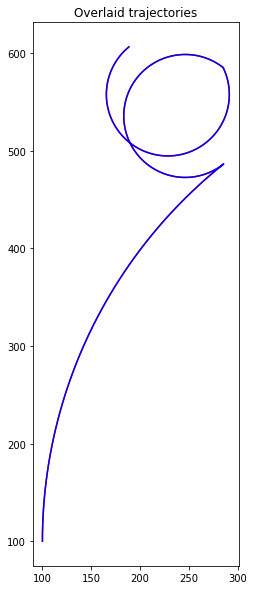

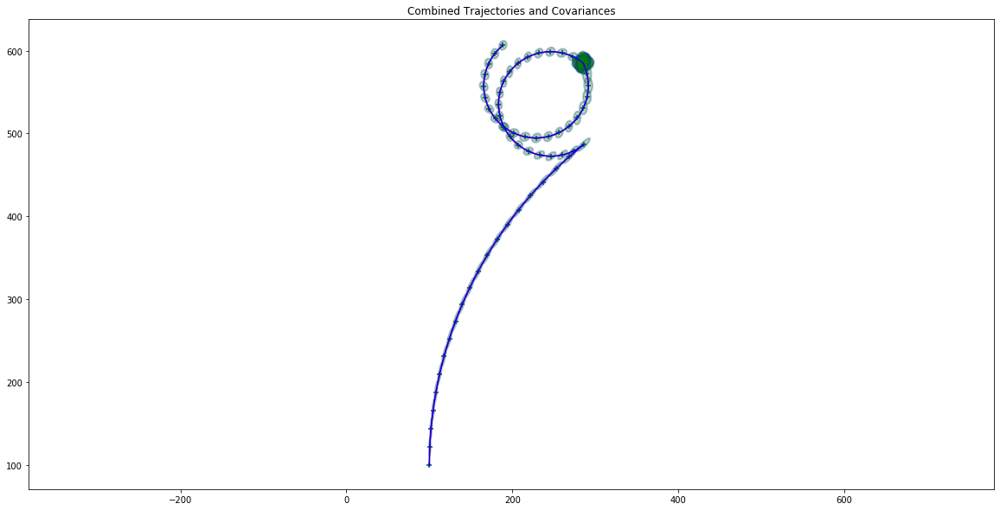

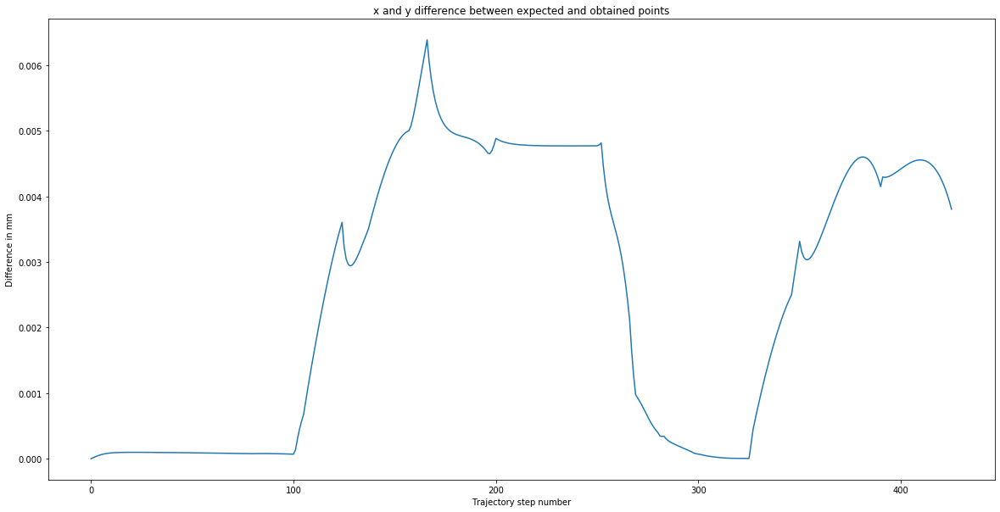

...

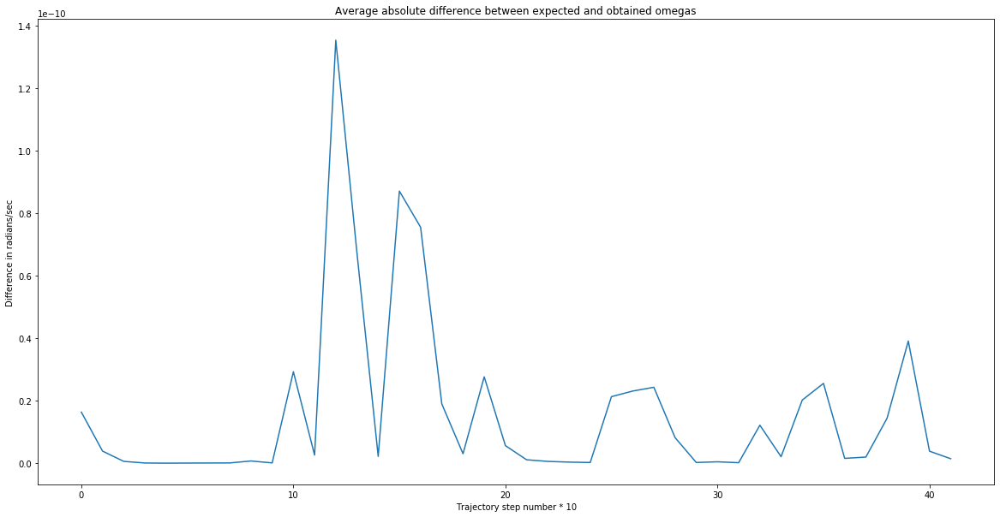

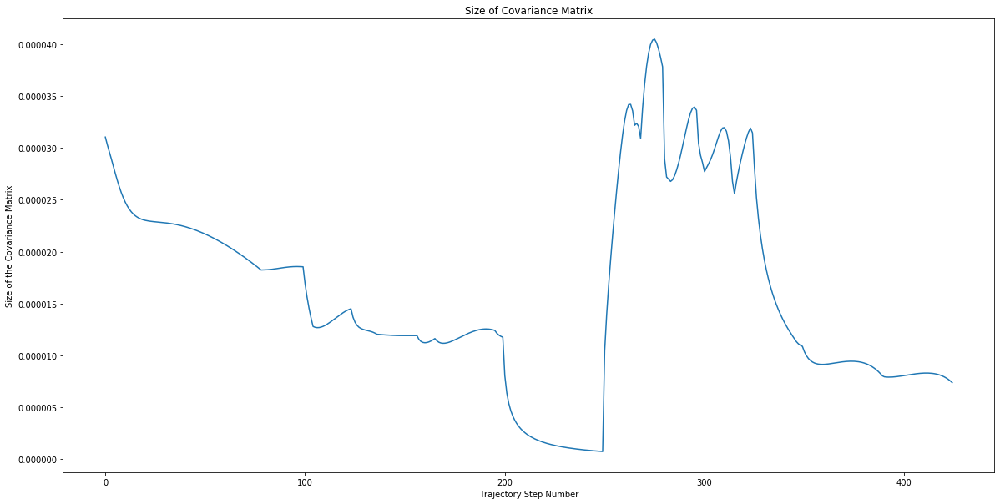

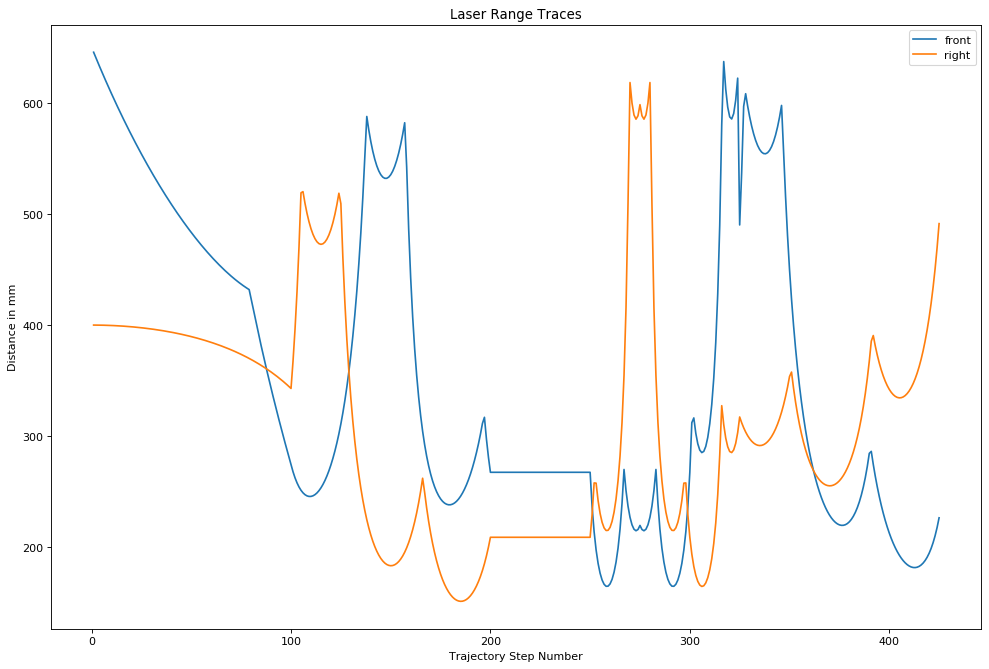

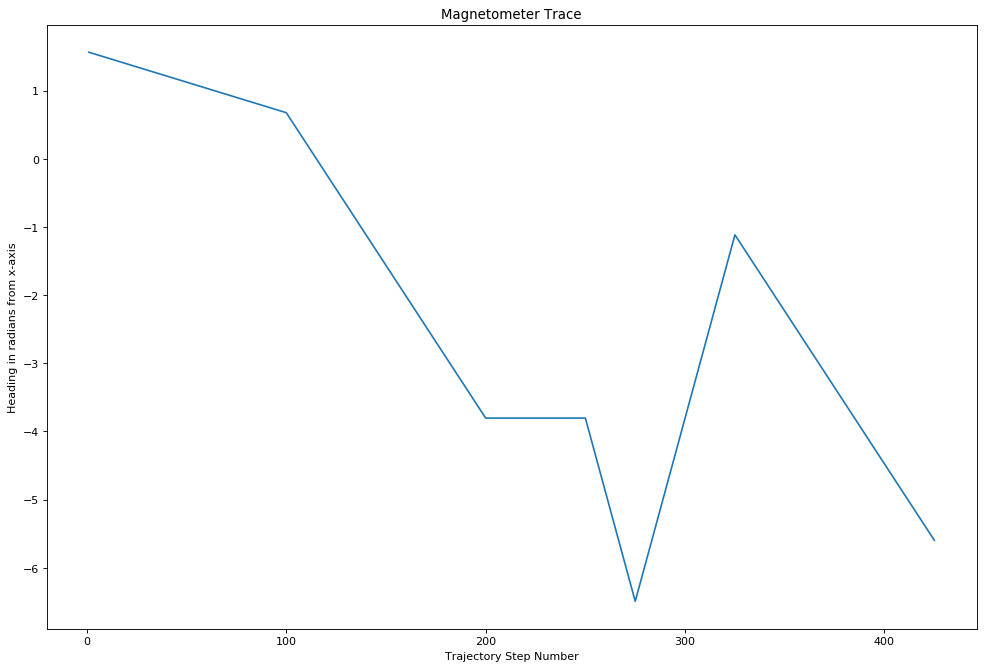

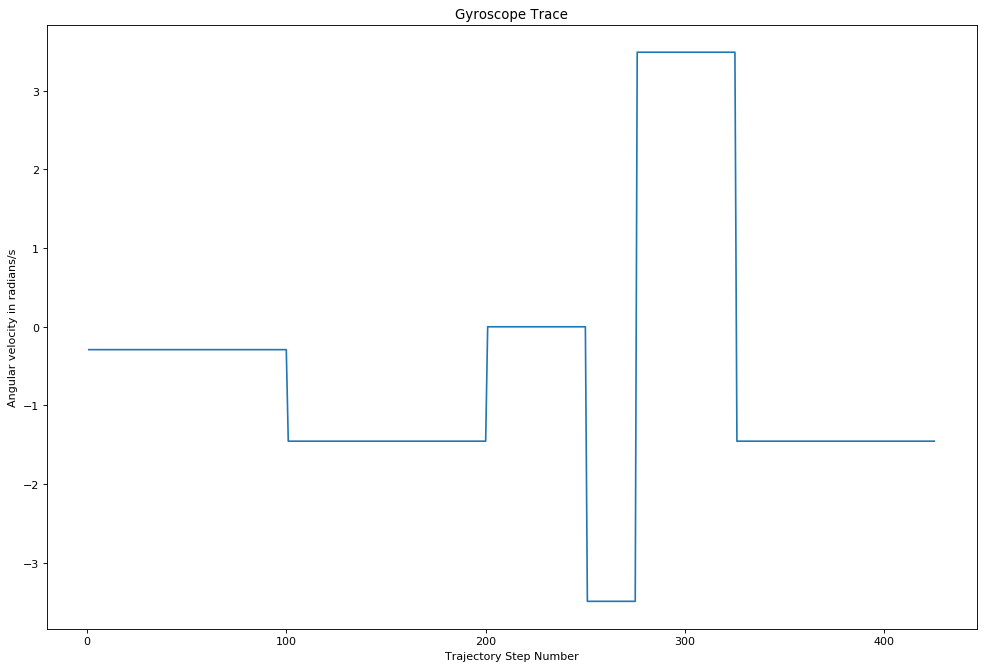

------
Mean Euclidean difference between expected and obtained points is 0.0025212685325371326 mm
------
RMSE of expected and obtained thetas is 2.9022927683144243e-12 radians
------
RMSE of expected and obtained omega is 6.211902475245944e-11 radians/second
------


In [13]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0]) # std_devs=[0,0,0,0,0,0]

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_0_clean')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Initial Example, regular noise and initial state known (w/noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


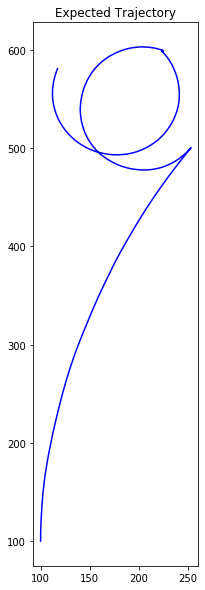

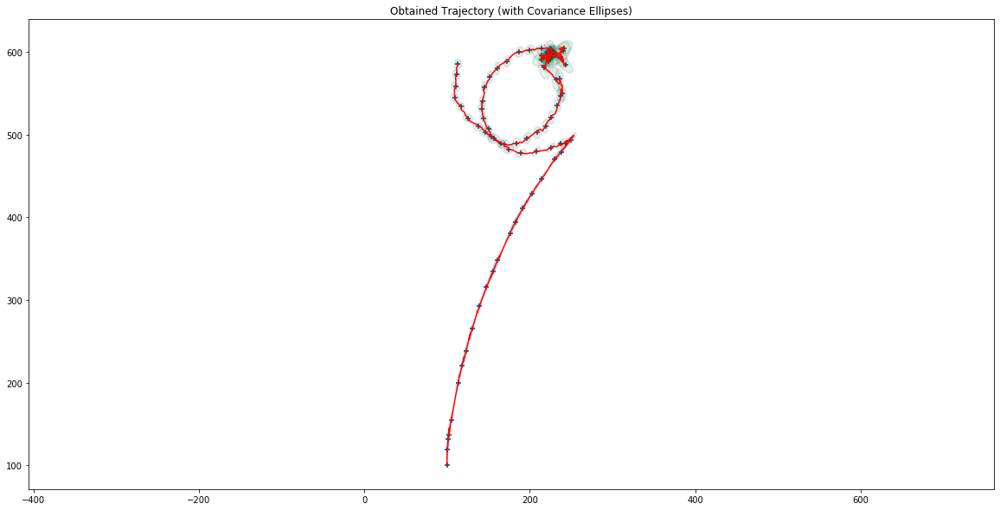

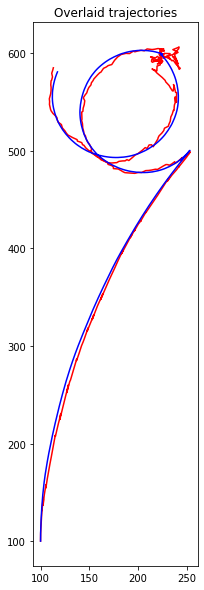

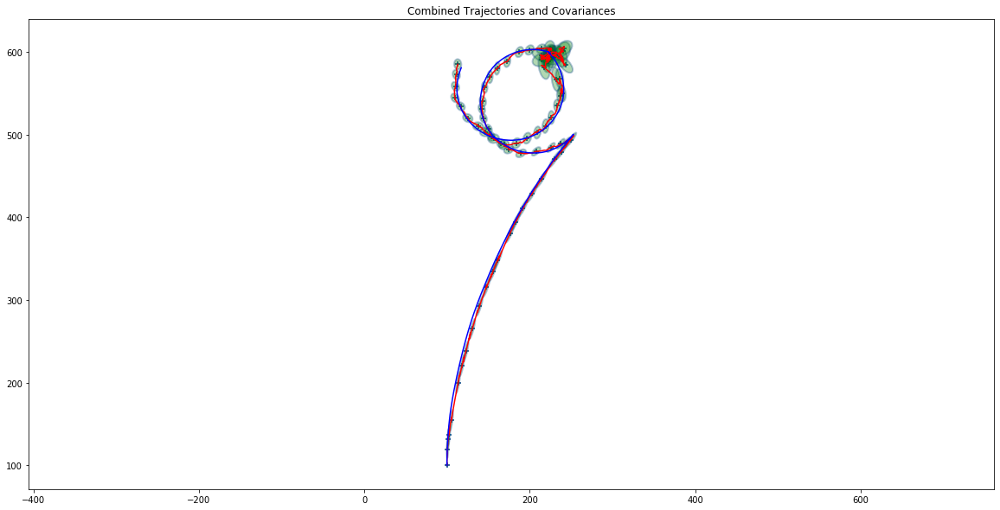

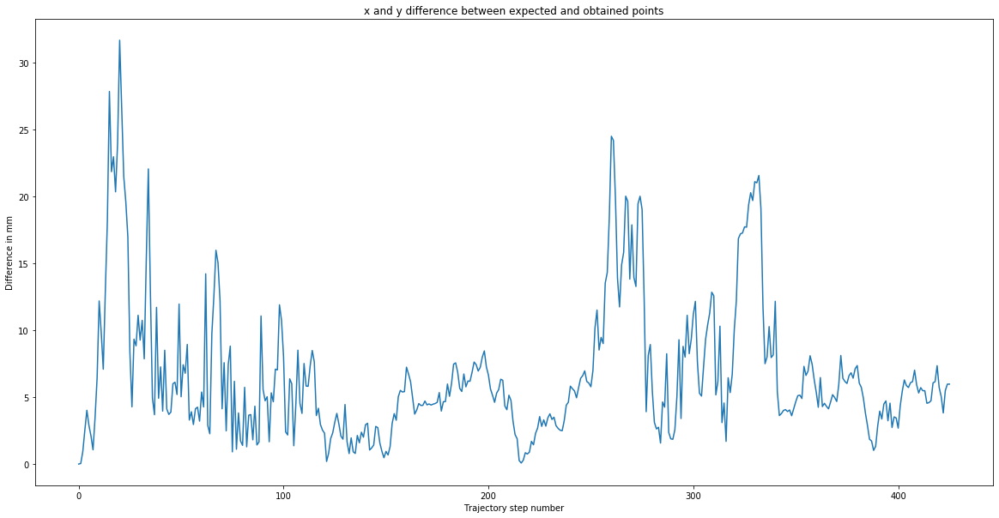

...

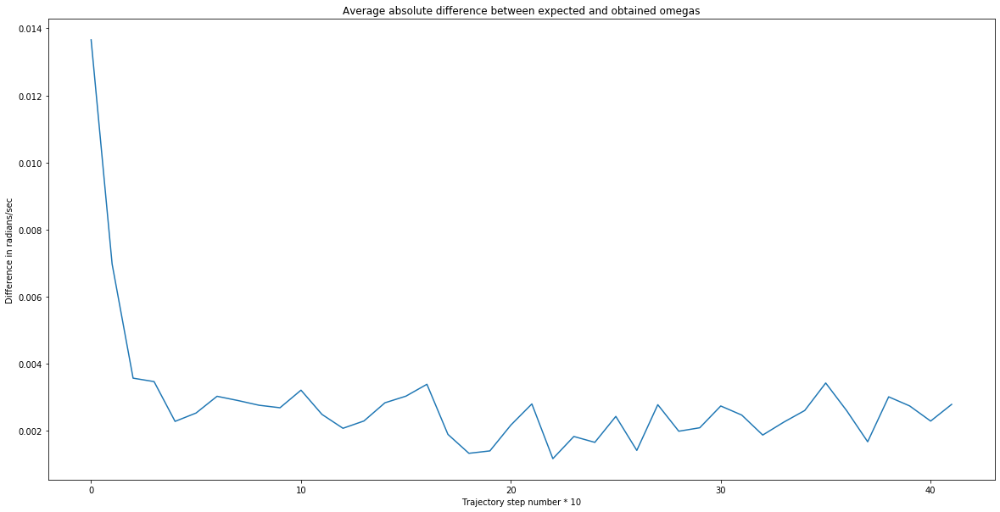

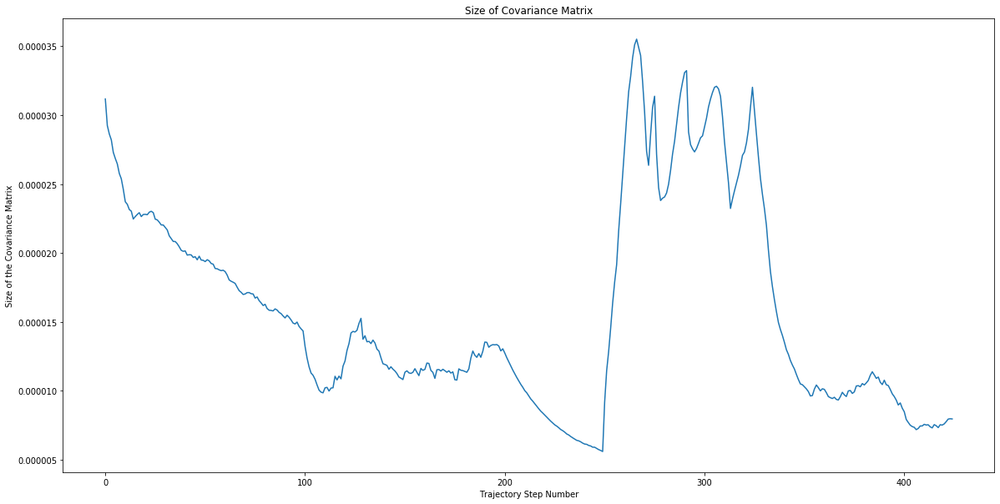

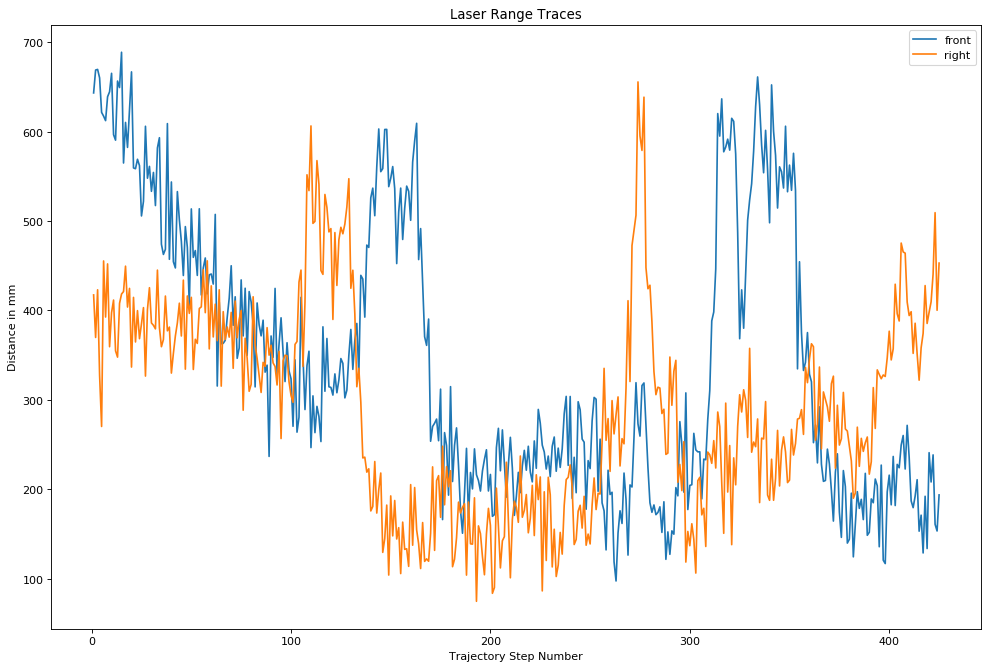

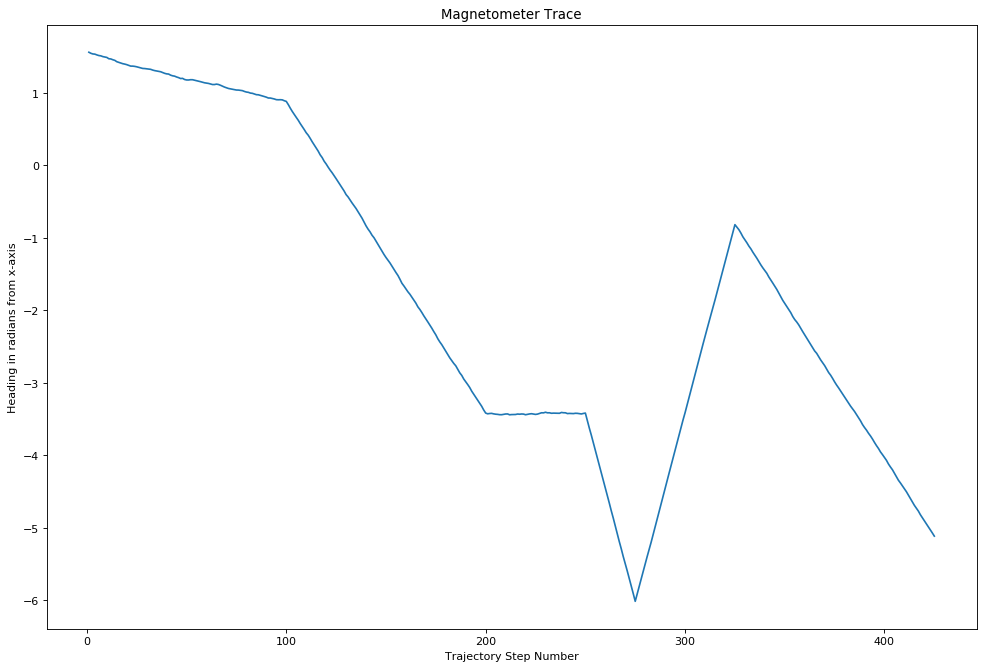

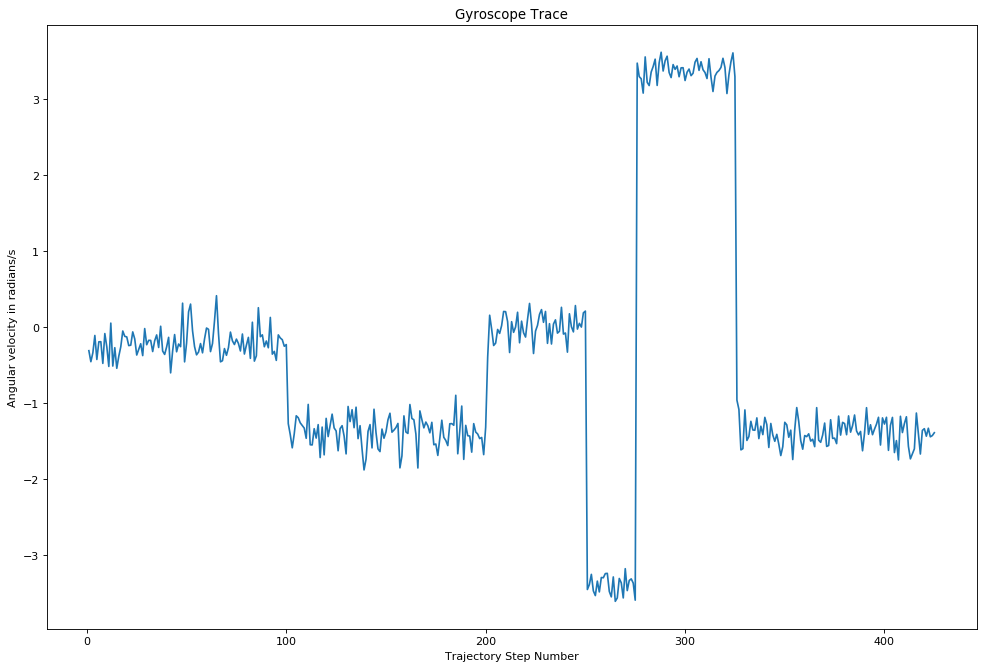

------
Mean Euclidean difference between expected and obtained points is 6.703418939660105 mm
------
RMSE of expected and obtained thetas is 6.056250650660427e-05 radians
------
RMSE of expected and obtained omega is 0.004058204793872679 radians/second
------


In [14]:
# Make system model
model = SystemModel() # std_devs=[0,0,0,0,0,0]

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_0')
kf.run(u_list, covariance_step = 5, make_gif = False)

## 3 Evaluation

You should evaluate your algorithms in a simulated environment. You should implement several pre-programmed
trajectories; you can also get arbitrary control inputs from a human driver.

### 3(a). Define and describe several reference trajectories (that in turn generate control input sequences) that capture the abilities and limitations of a state estimator in this environment.

Described in 3(c).

### 3(b). Implement a simulation, including models of your sensor and actuator response (especially including noise), to generate realistic sensor traces given the above control inputs. 

Present and explain the simulated sensor traces.

Implemented in 3(c).

### 3(c). Implement your KF based state estimator on these examples, demonstrating the performance (in terms of accuracy and efficiency) of your computed state estimate over time as the robot is issued commanded input 2 sequences. 

Consider both perfect knowledge of the initial state as well as no knowledge of the initial state on the same traces. Clearly describe the experiments that were run, the data that was gathered, and the process by which you use that data to characterize the performance of your state estimator. Include figures; you may also refer to animations uploaded to your git repo.

#### Example 1: Same as previous trajectory but with 3x the noise on all sensors and servos

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


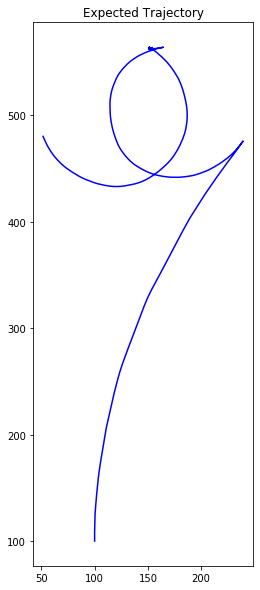

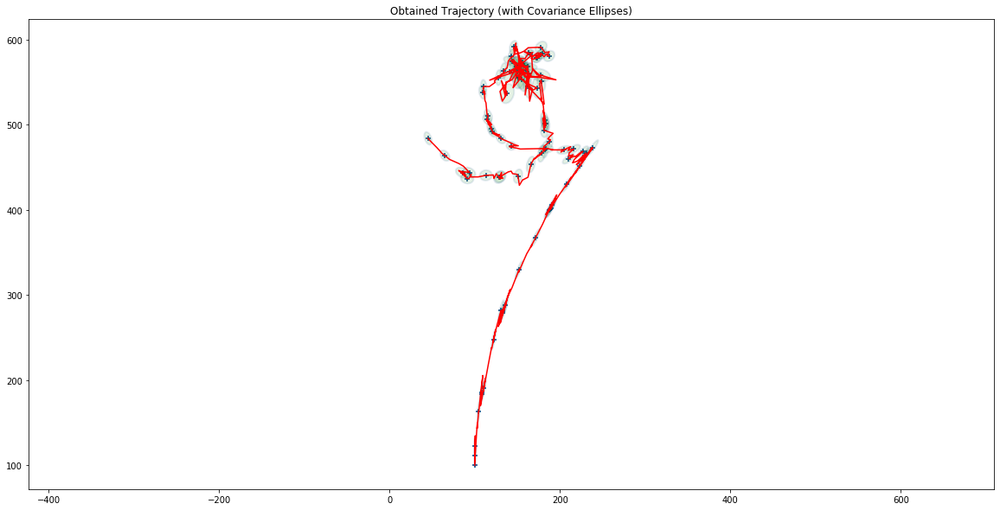

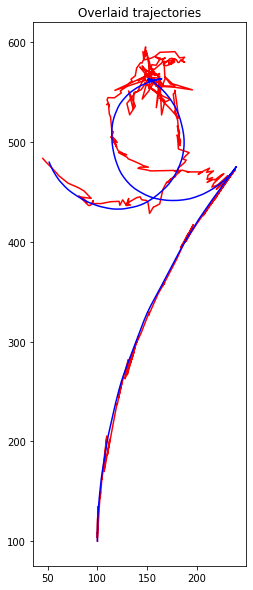

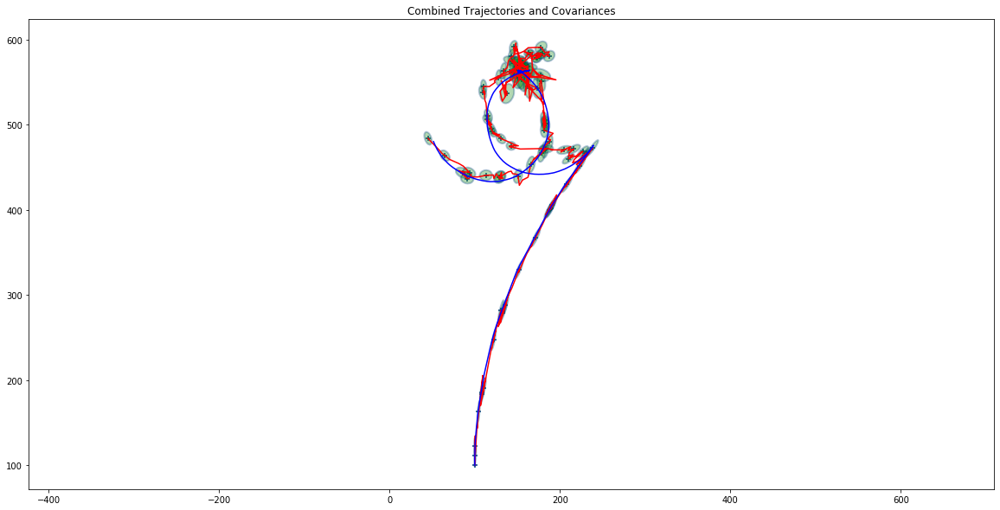

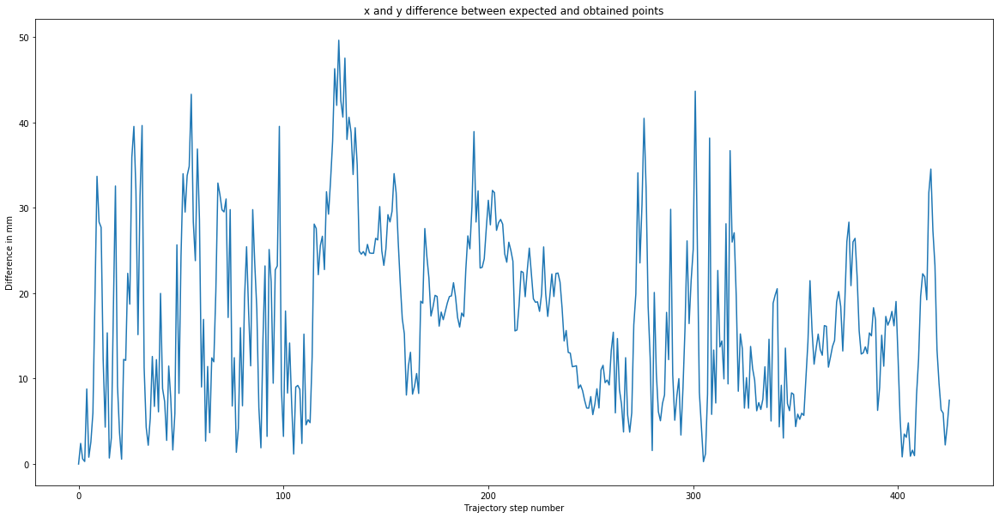

...

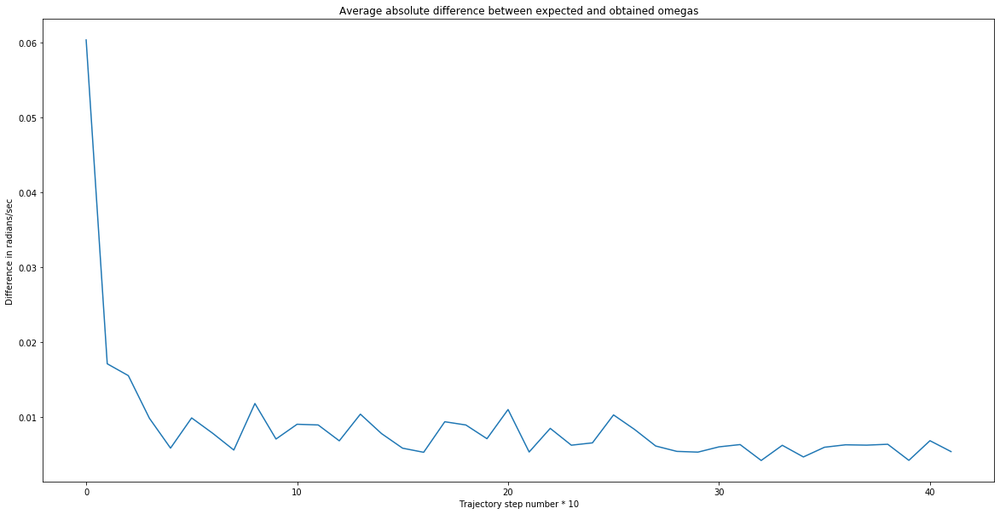

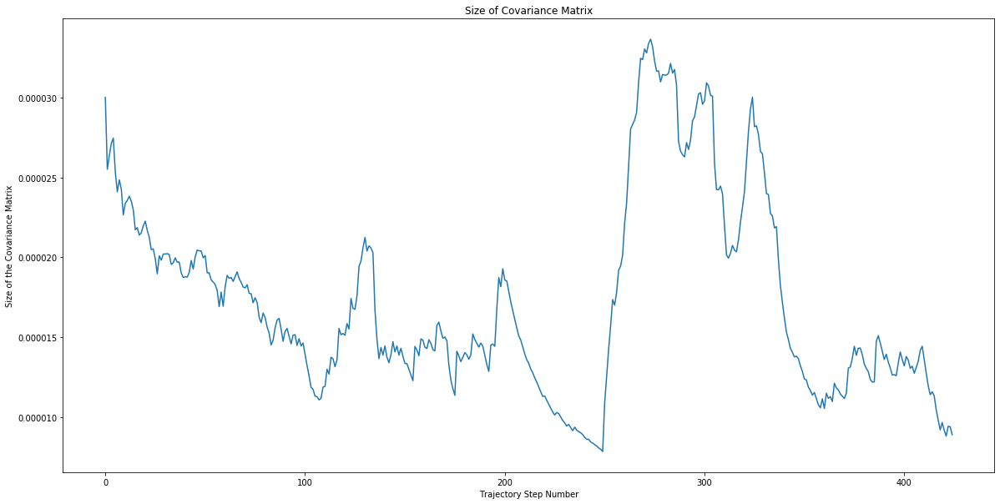

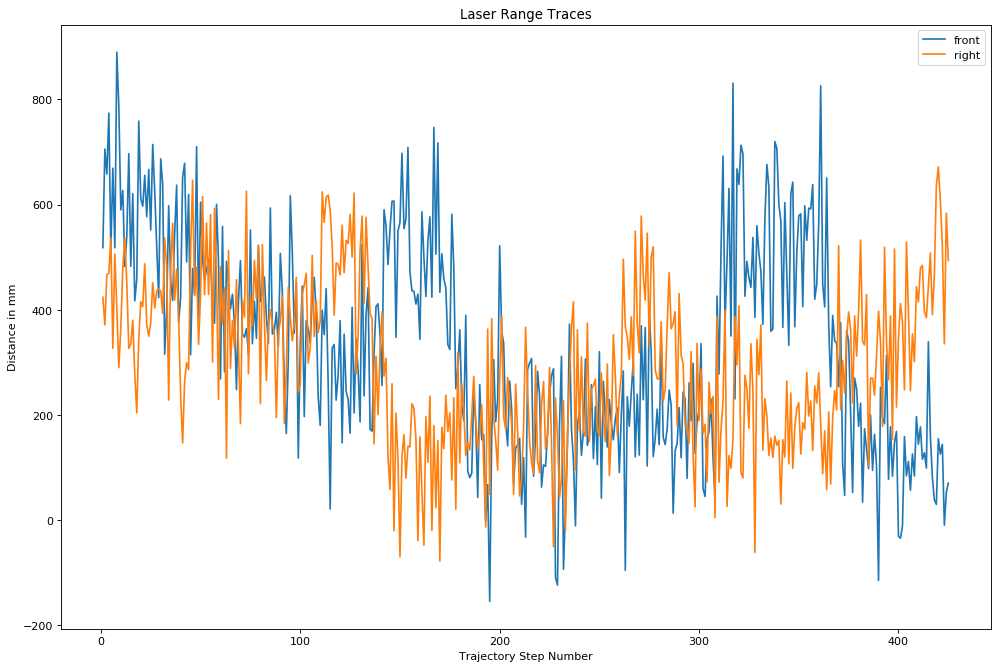

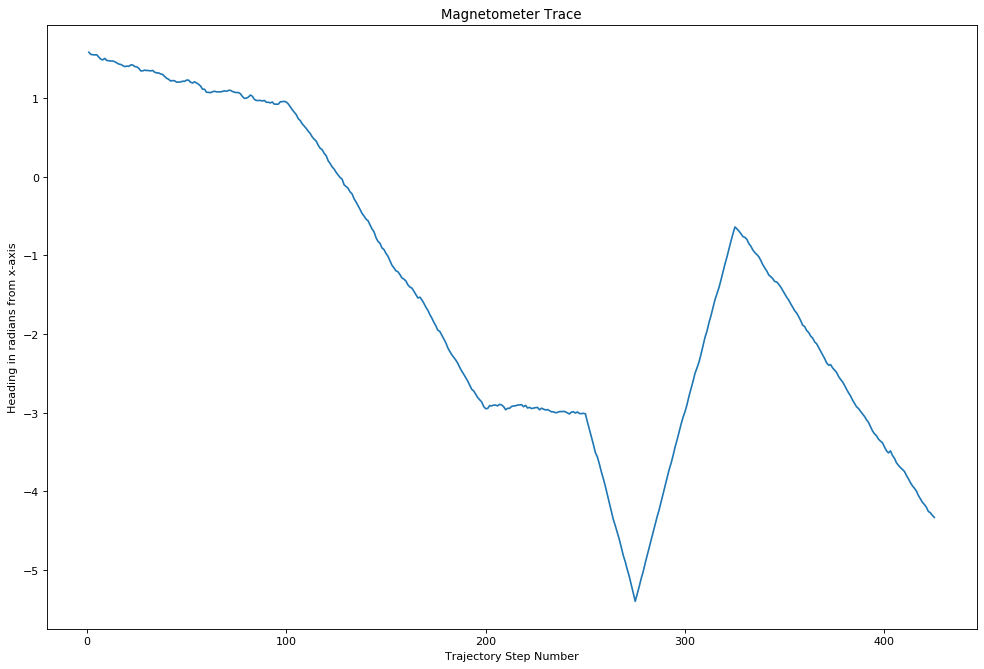

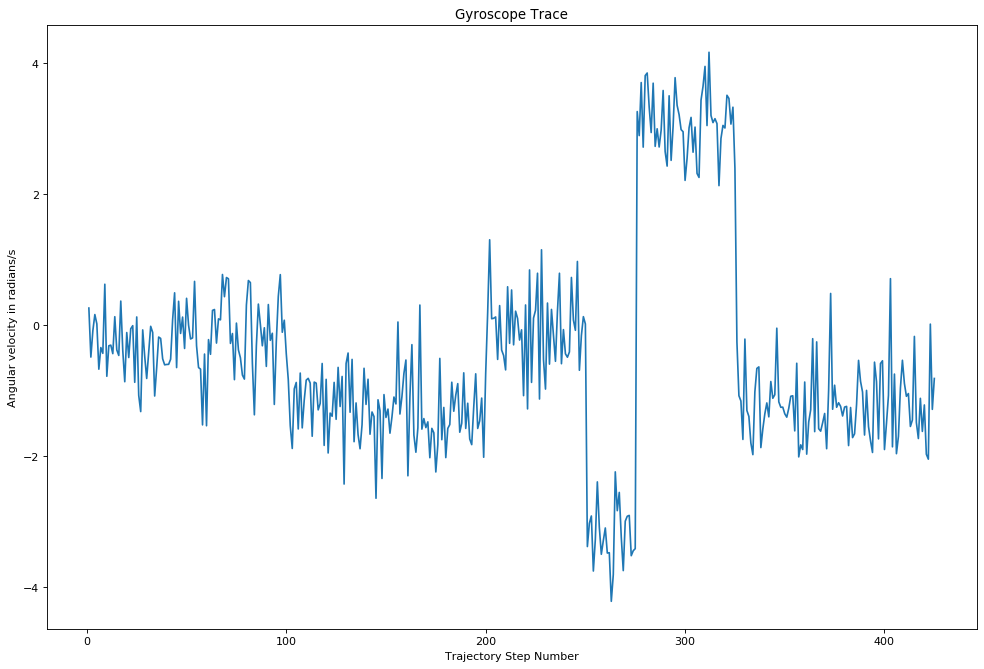

------
Mean Euclidean difference between expected and obtained points is 17.13599245259085 mm
------
RMSE of expected and obtained thetas is 0.000190002358189693 radians
------
RMSE of expected and obtained omega is 0.016412047871463928 radians/second
------


In [15]:
# Make system model
std_devs = [x*3 for x in [36, 36, 6.103515625e-5, 0.1, 3, 3]] # 3x the noise standard deviations
model = SystemModel(std_devs = std_devs)

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_1')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 2: Spiral trajectory (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


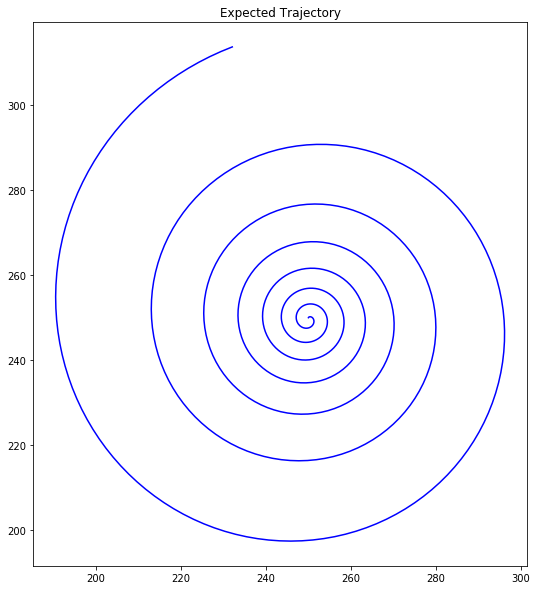

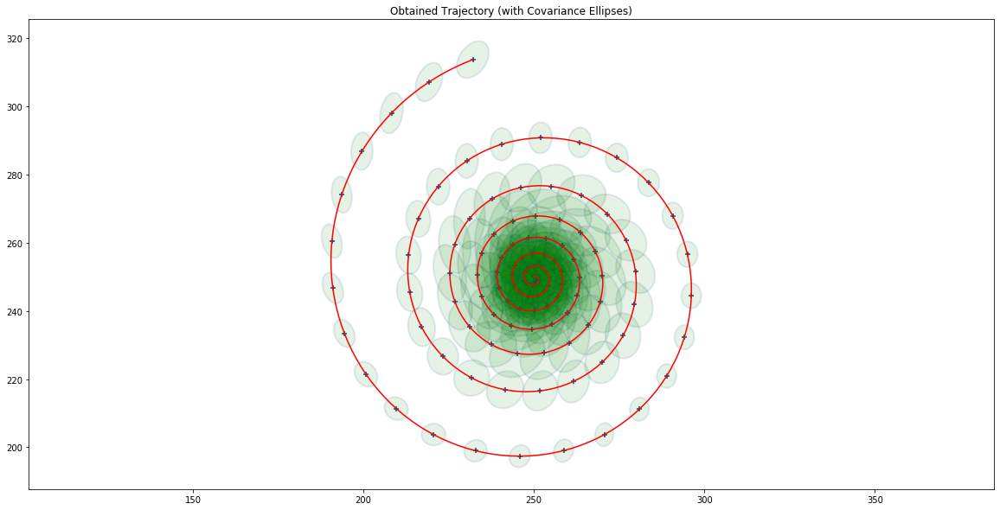

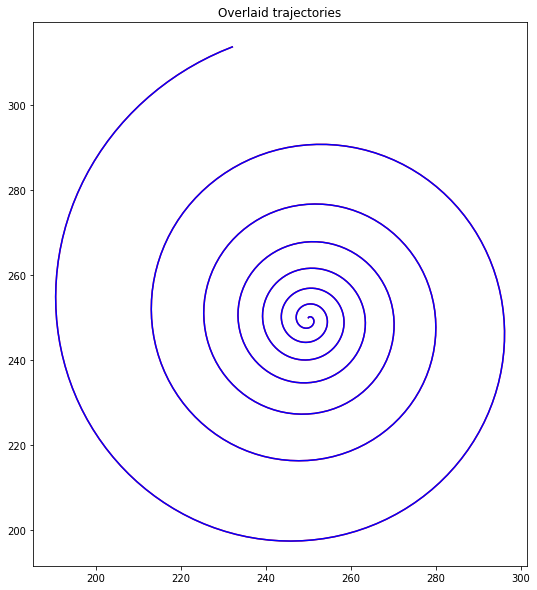

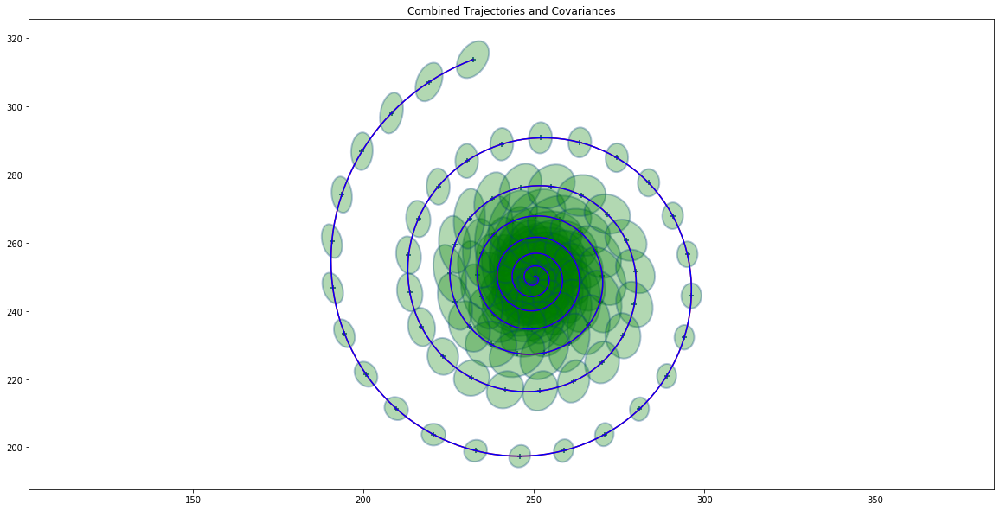

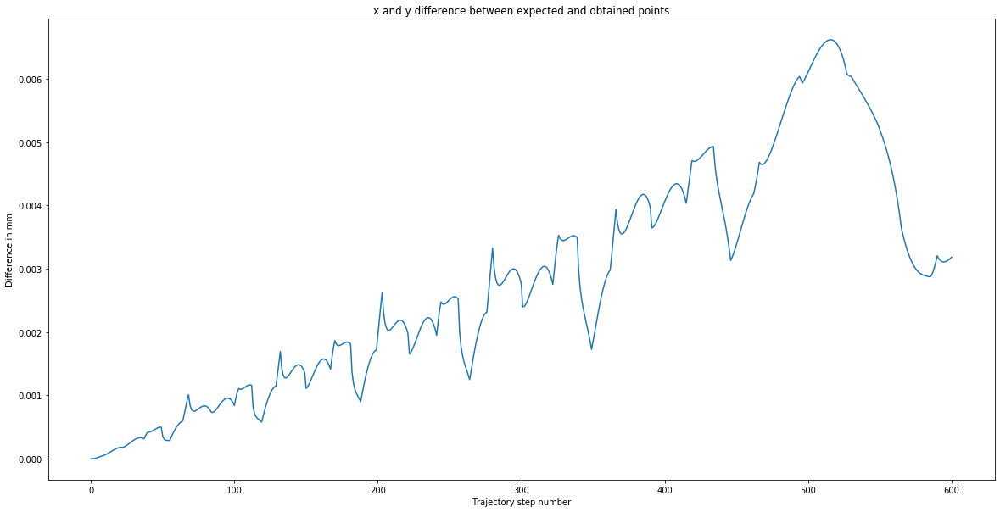

...

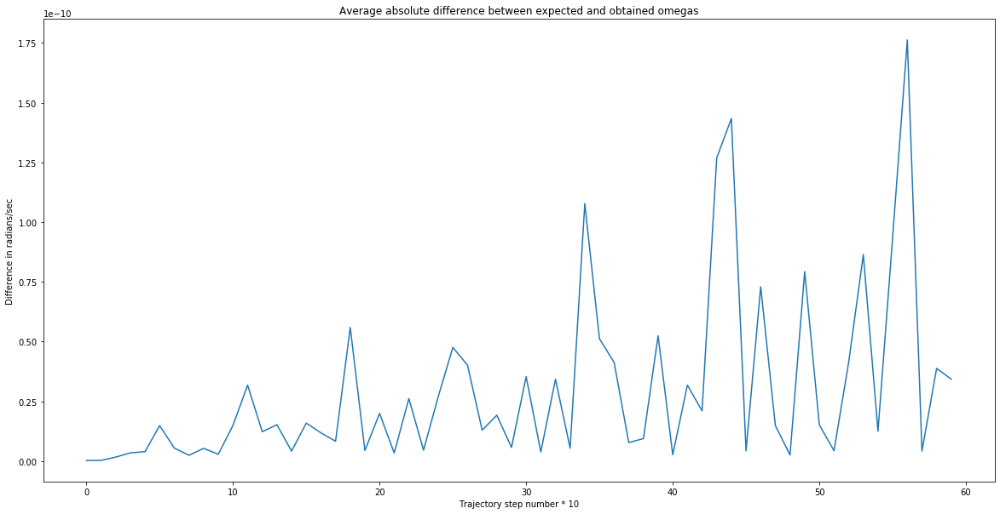

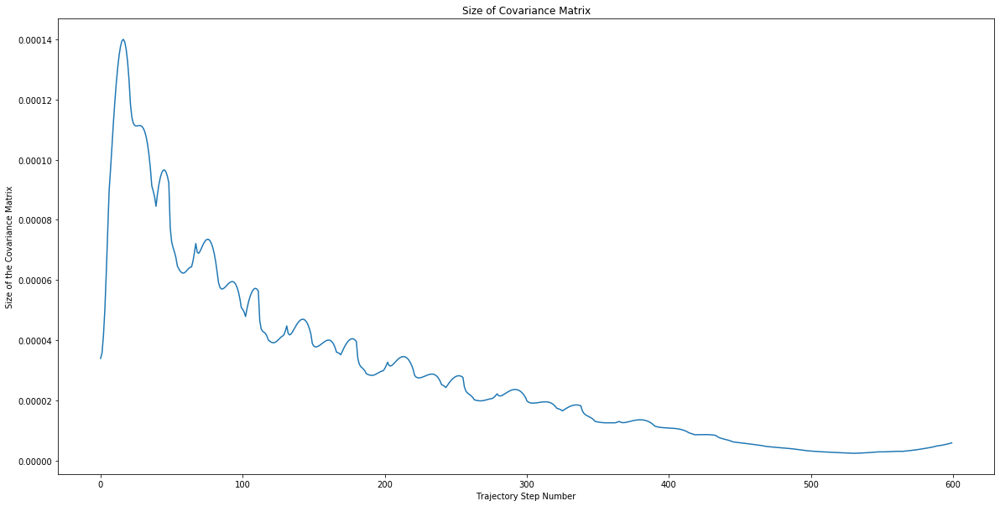

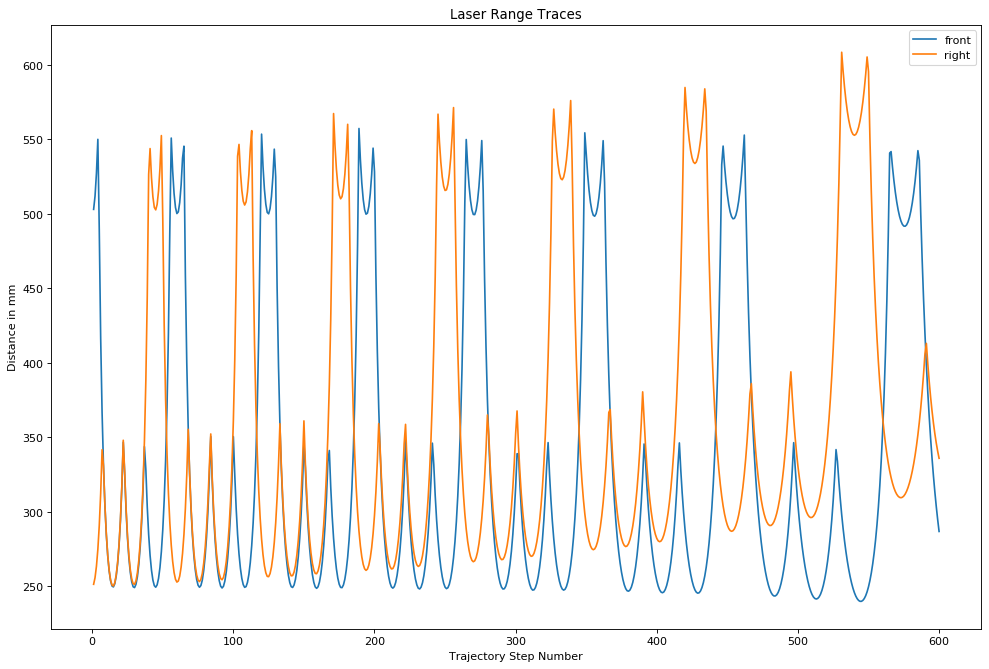

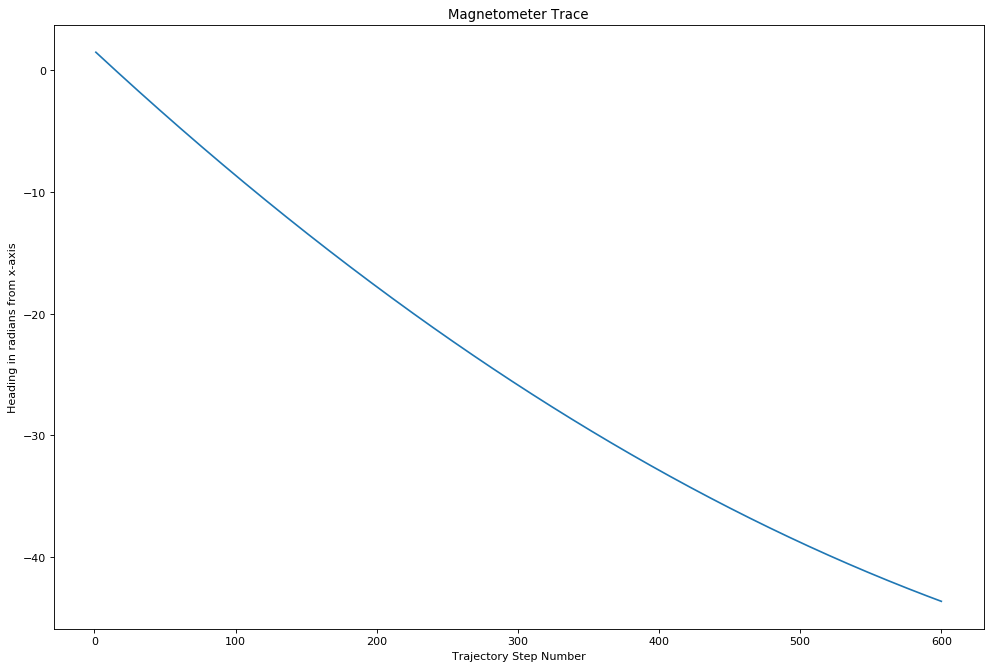

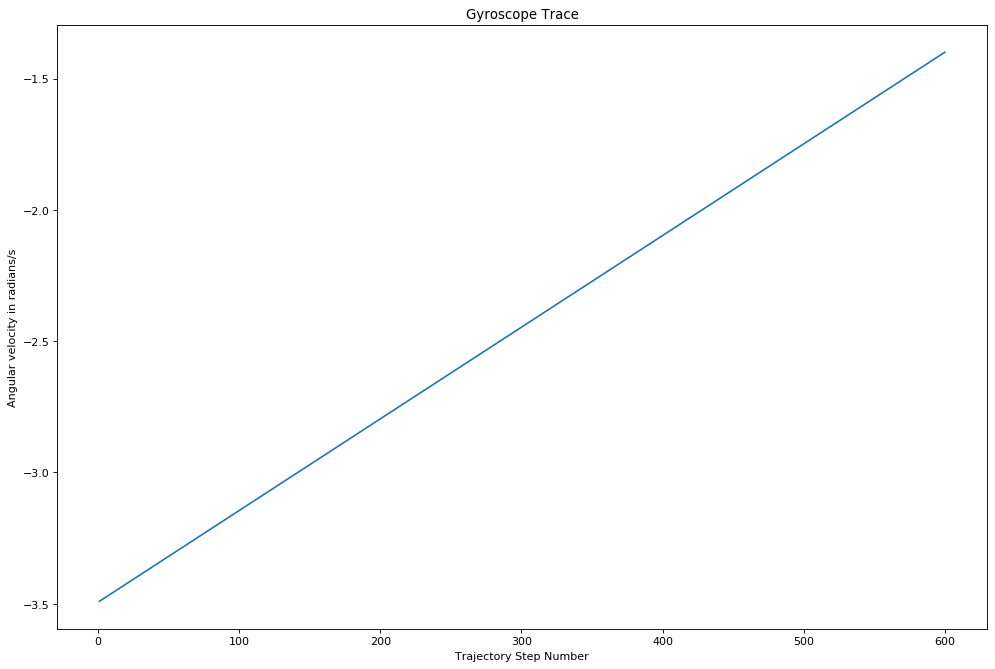

------
Mean Euclidean difference between expected and obtained points is 0.002779587020121605 mm
------
RMSE of expected and obtained thetas is 3.931121137183673e-12 radians
------
RMSE of expected and obtained omega is 8.992366744676987e-11 radians/second
------


In [16]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0])

# Set initial conditions
x_0 = State(x=250, y=250, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, i*120/1000-60] for i in range(600)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_2_clean')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 2: Spiral trajectory

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


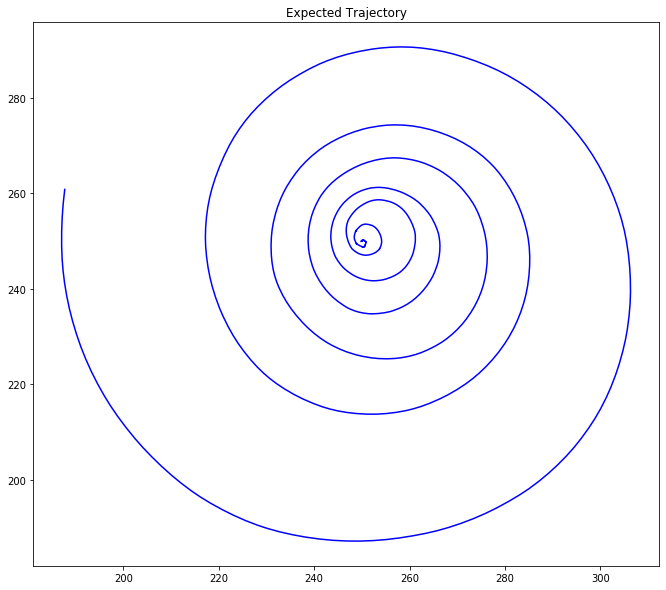

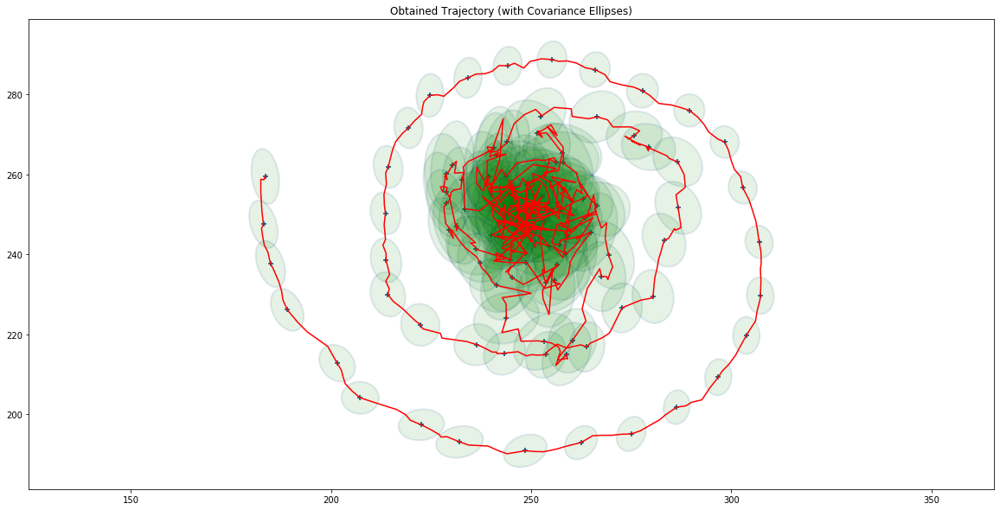

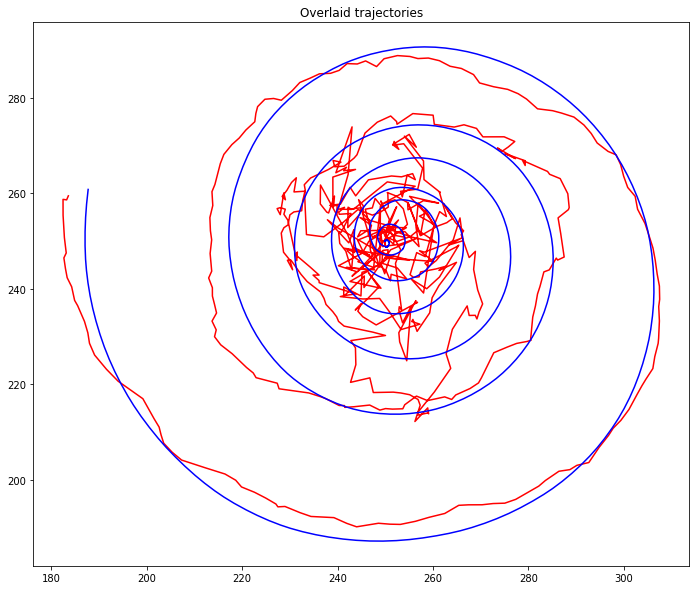

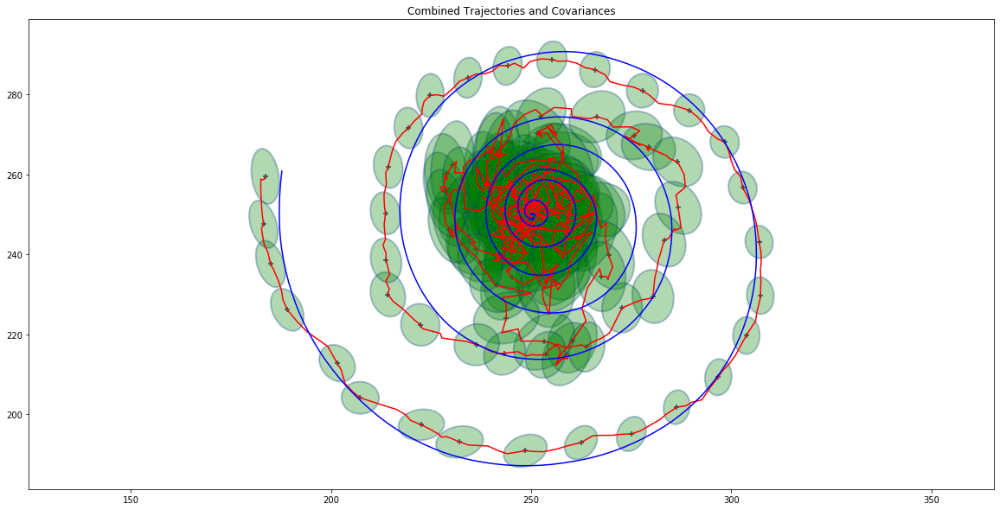

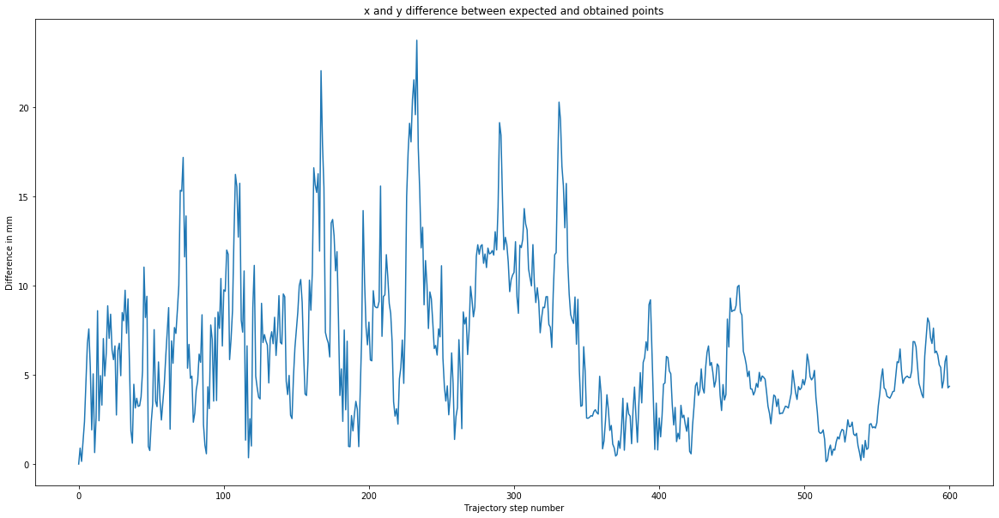

...

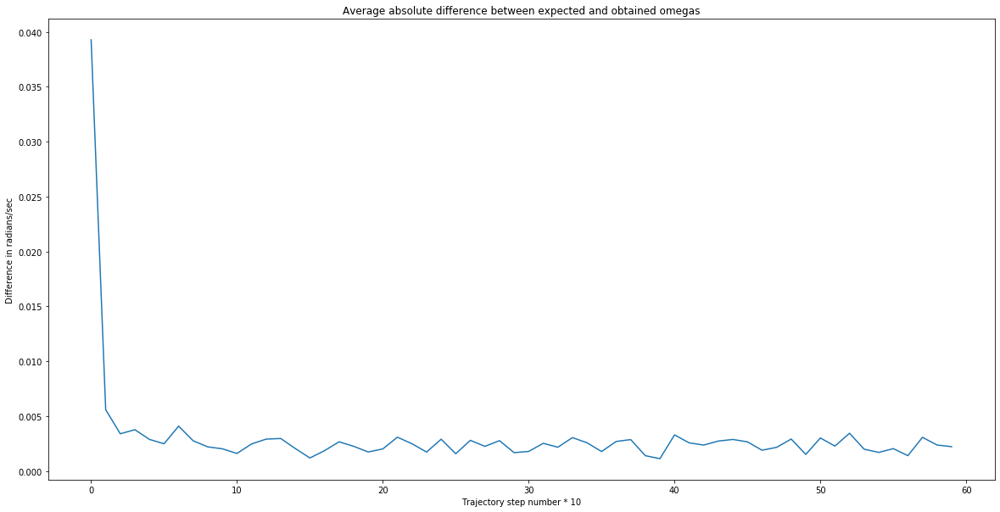

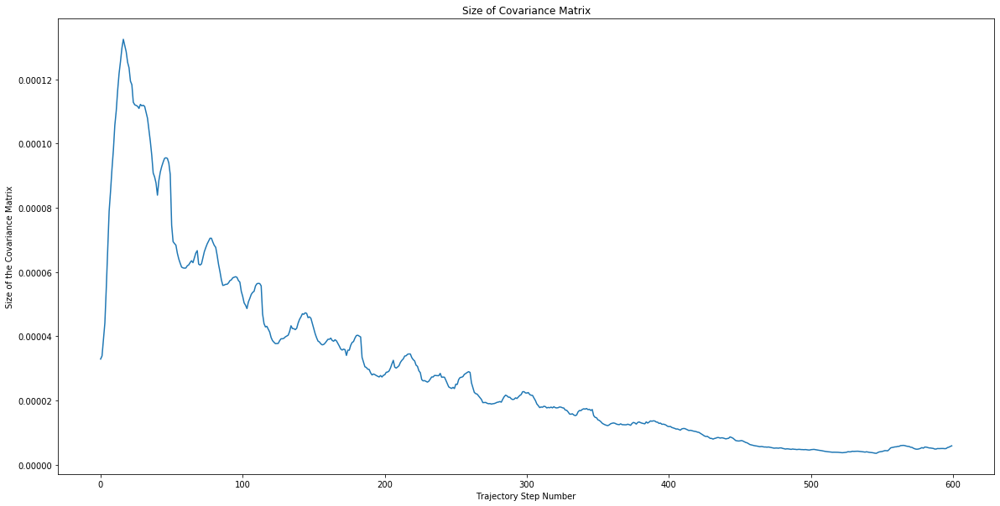

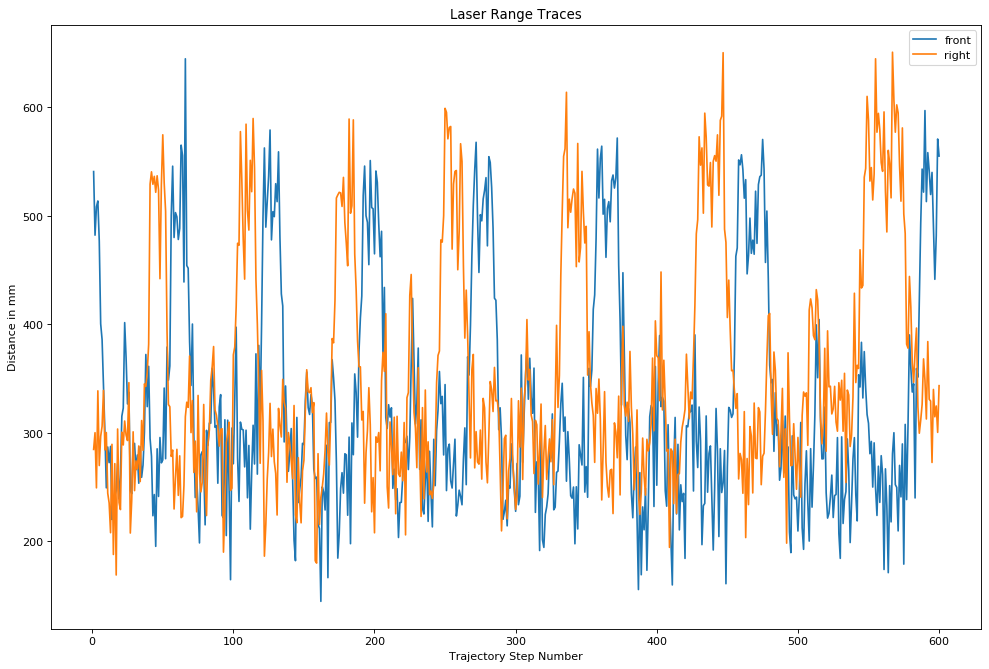

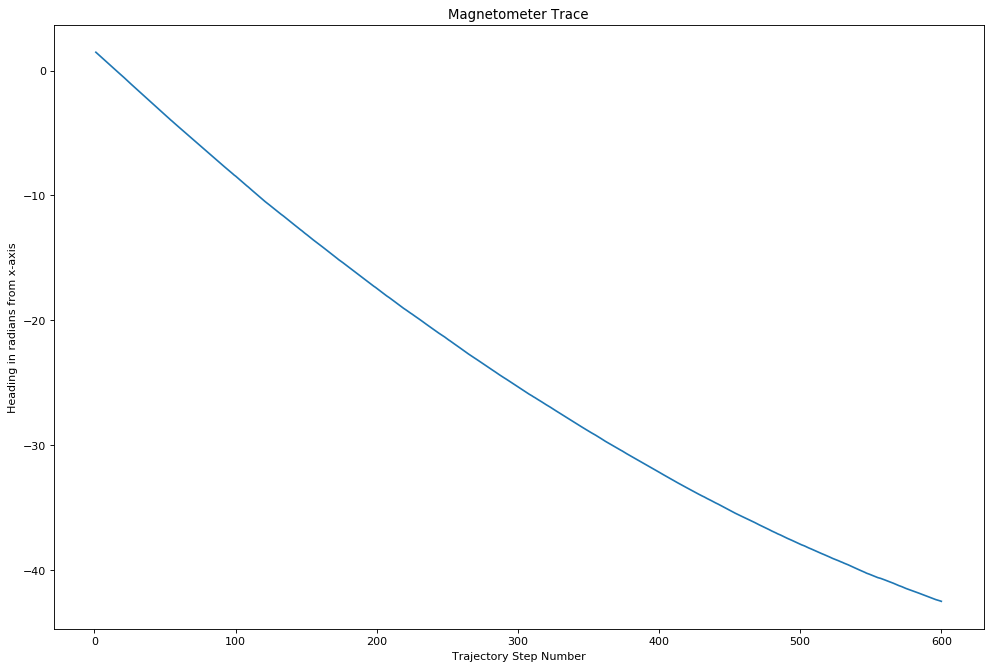

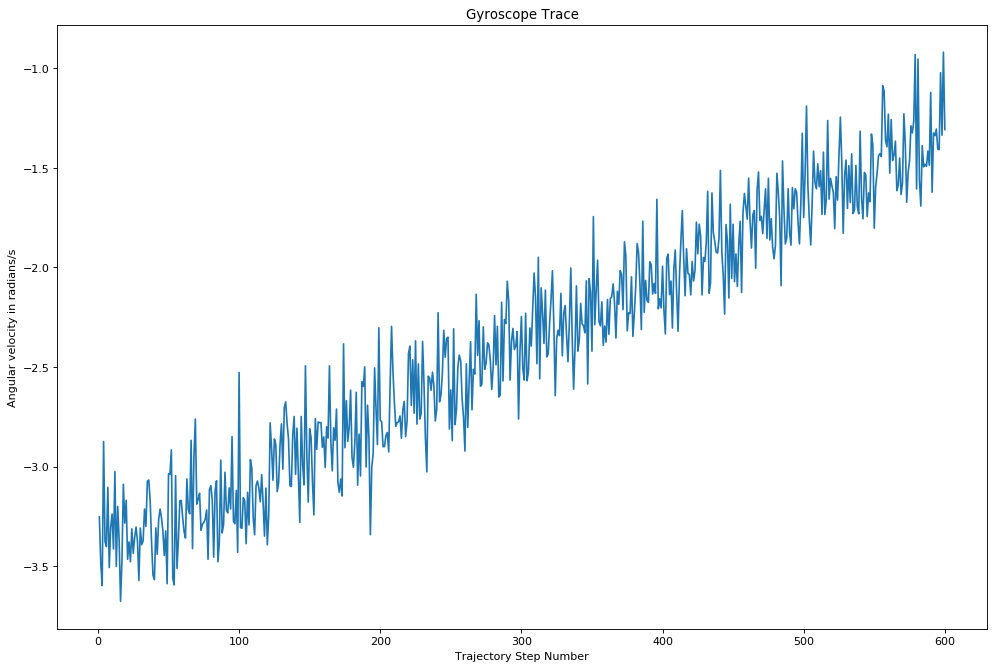

------
Mean Euclidean difference between expected and obtained points is 6.342921399090535 mm
------
RMSE of expected and obtained thetas is 6.190201025396648e-05 radians
------
RMSE of expected and obtained omega is 0.007841482342455176 radians/second
------


In [17]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=250, y=250, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, i*120/1000-60] for i in range(600)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_2')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 3: Spiral trajectory (for a longer period of time) (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


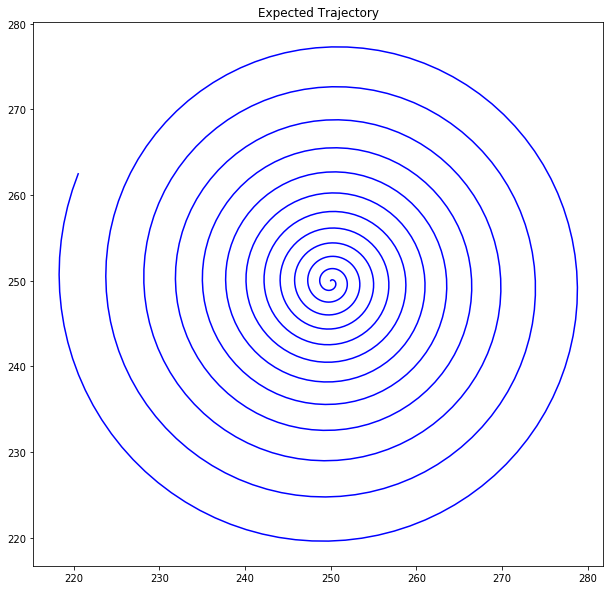

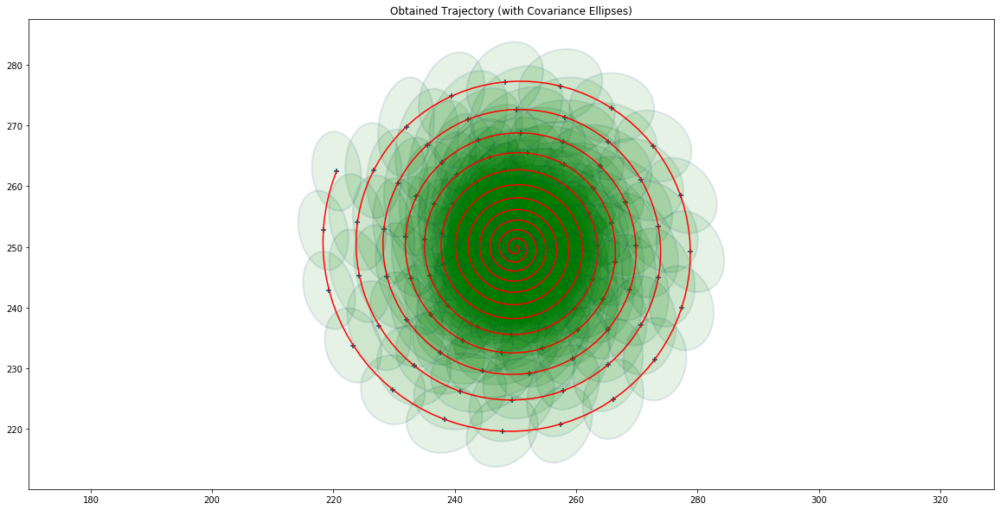

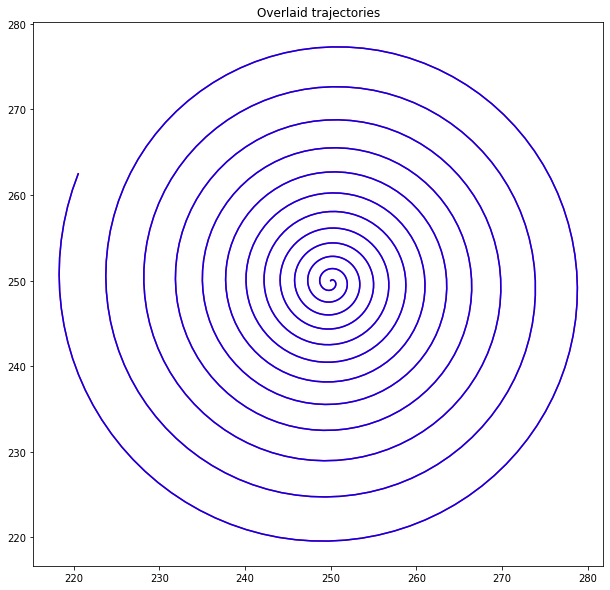

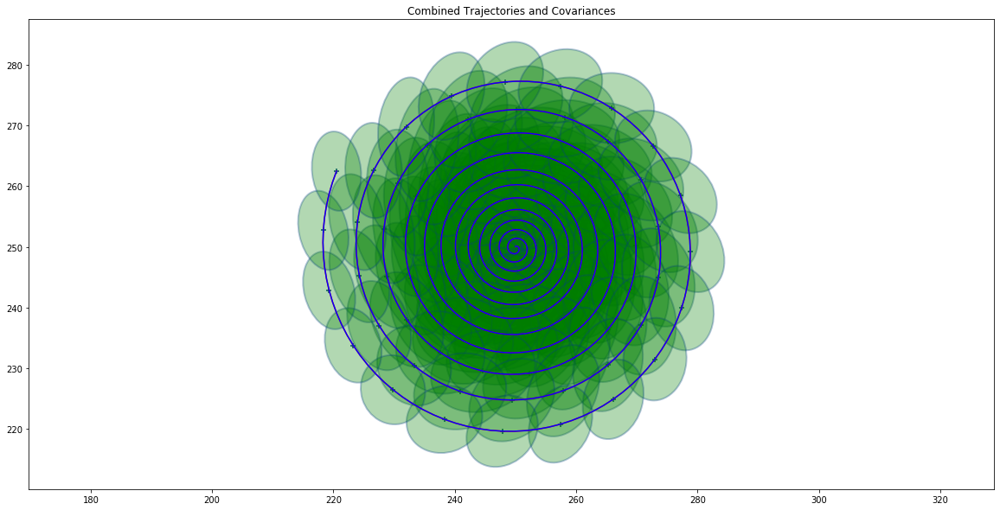

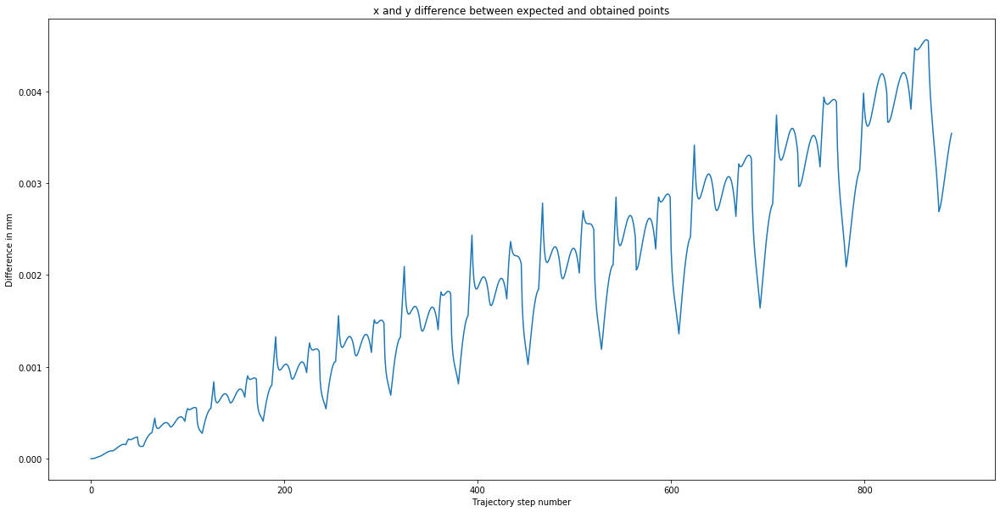

...

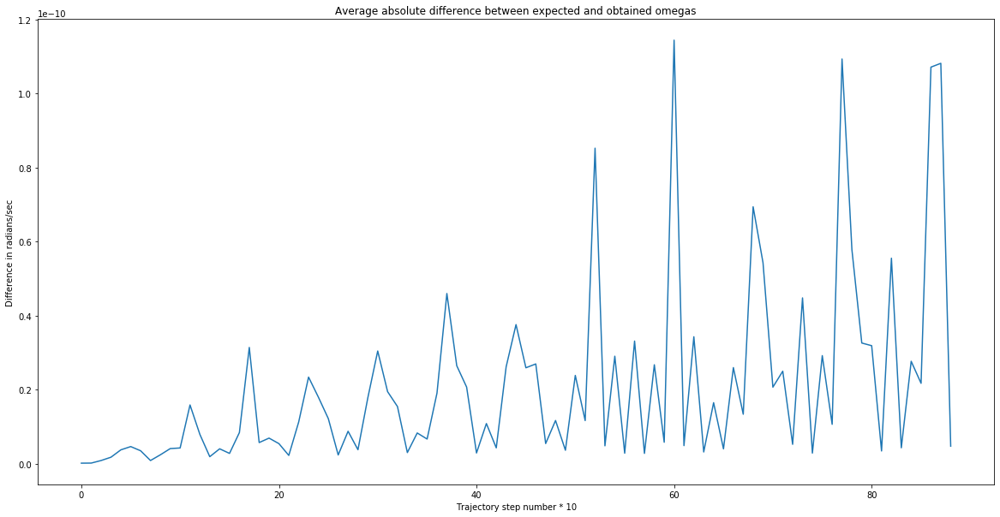

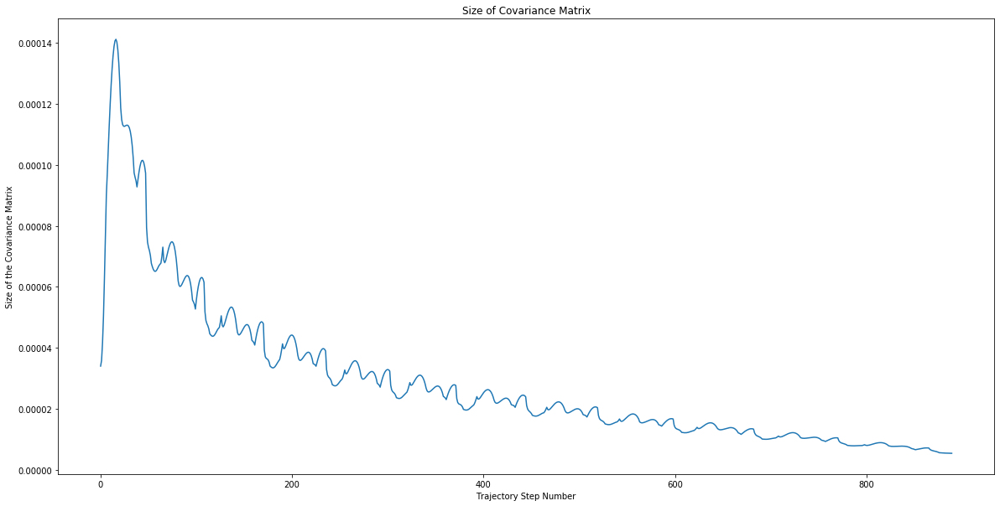

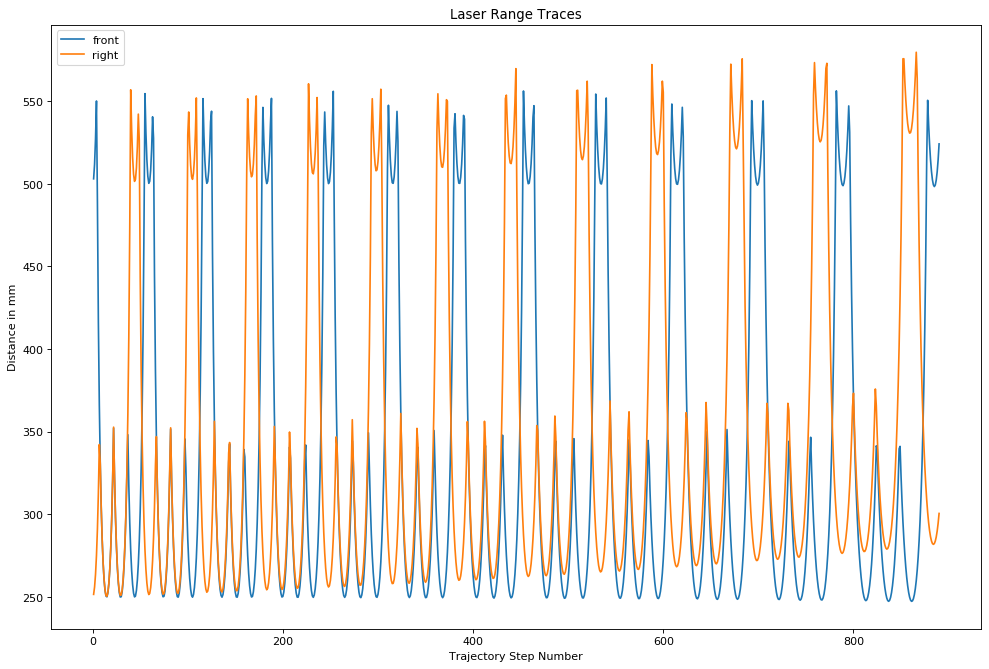

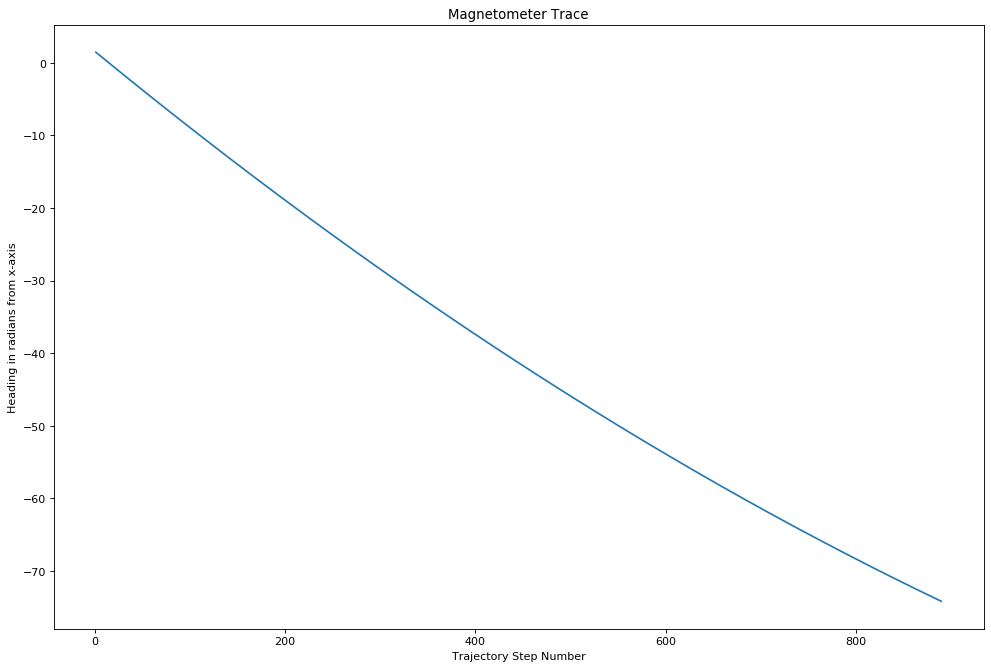

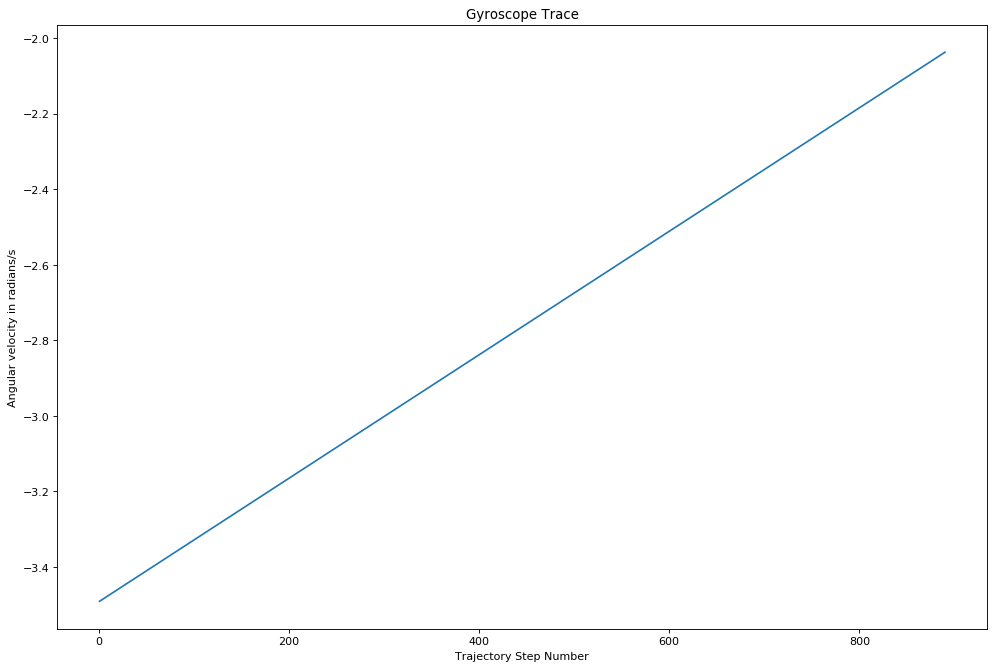

------
Mean Euclidean difference between expected and obtained points is 0.0019332739429269753 mm
------
RMSE of expected and obtained thetas is 2.4507192172411358e-12 radians
------
RMSE of expected and obtained omega is 5.961021935532006e-11 radians/second
------


In [18]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0])

# Set initial conditions
x_0 = State(x=250, y=250, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, i*50/890-60] for i in range(890)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_3_clean')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 3: Spiral trajectory (for a longer period of time) (w/noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


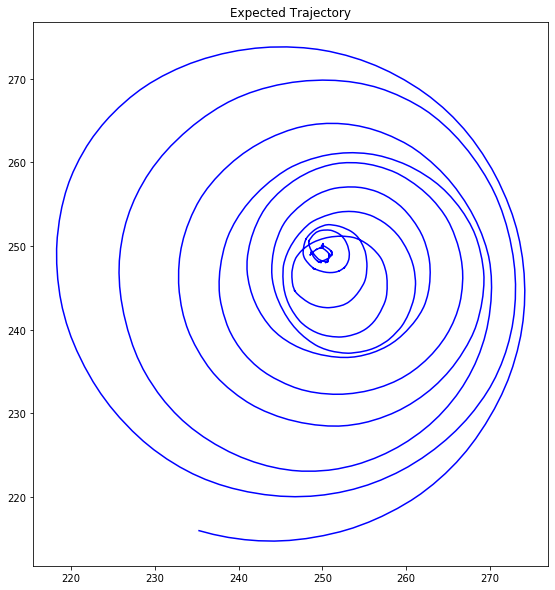

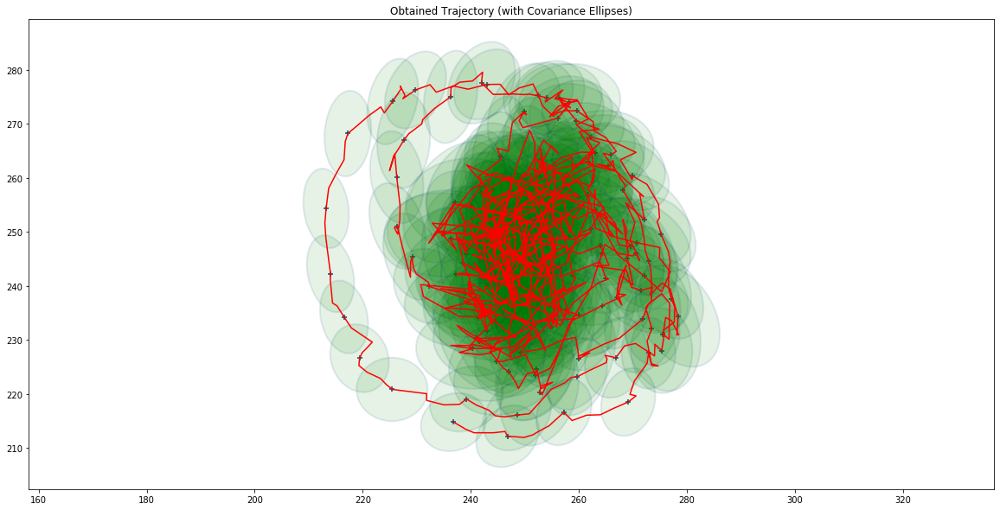

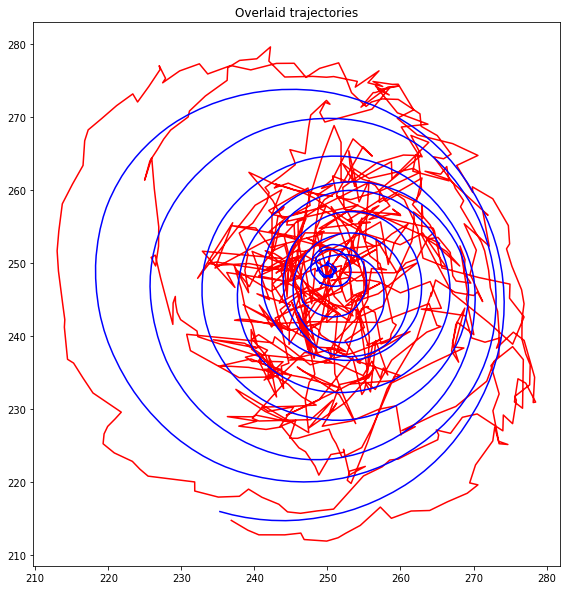

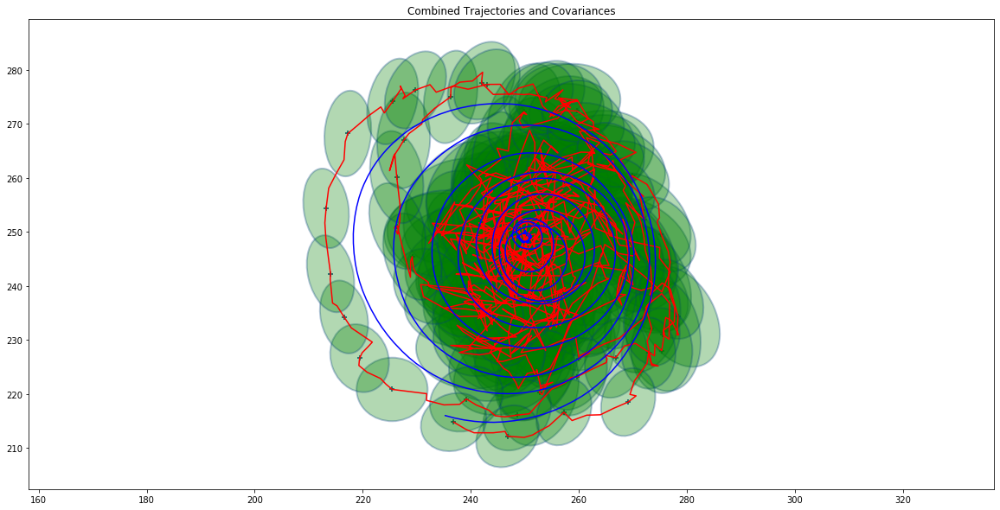

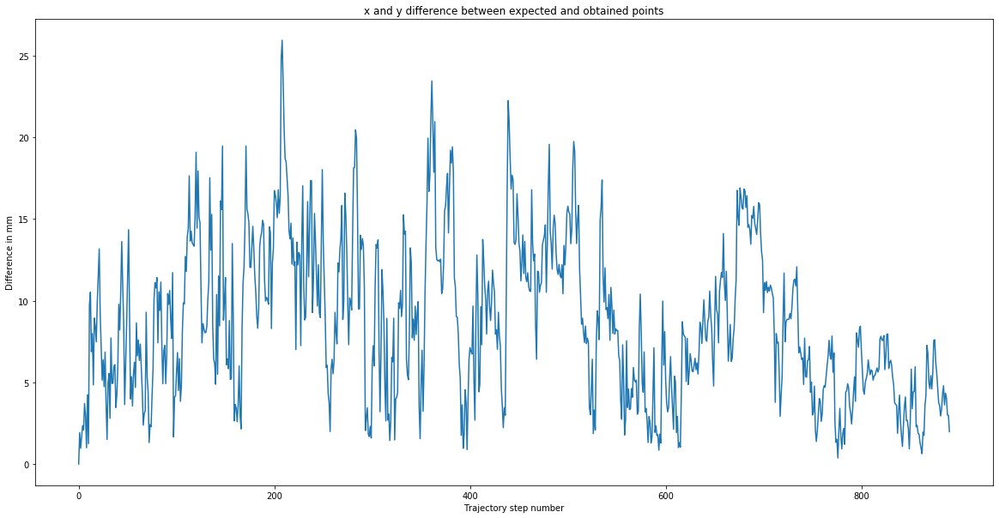

...

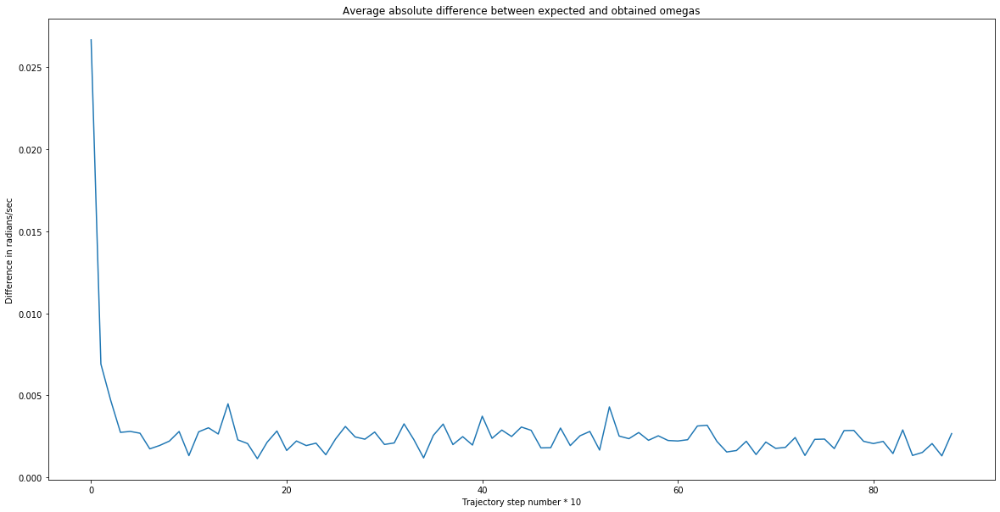

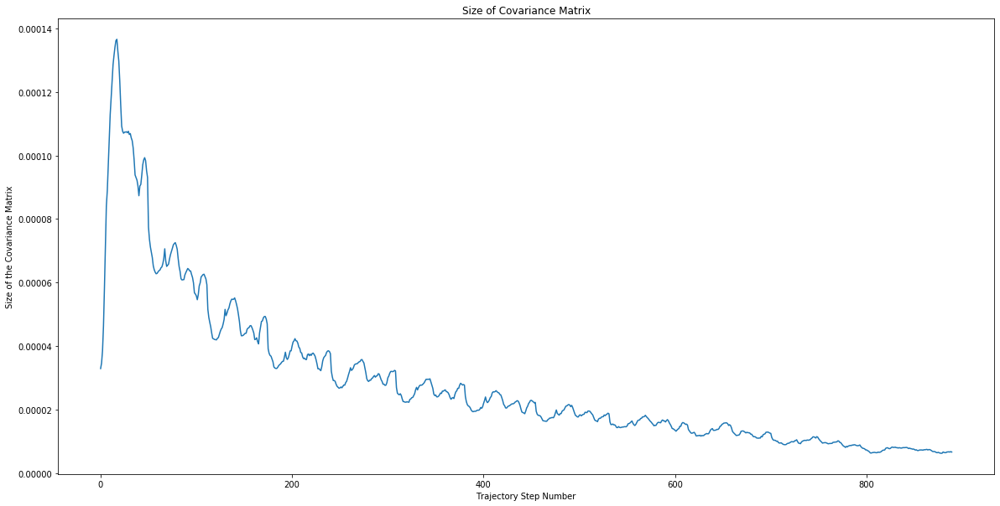

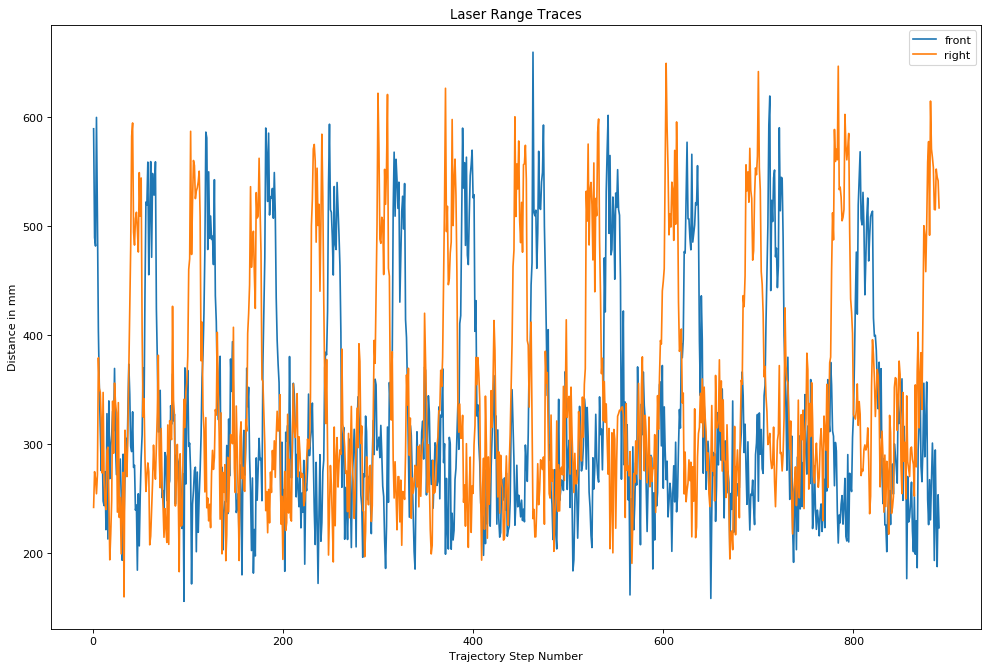

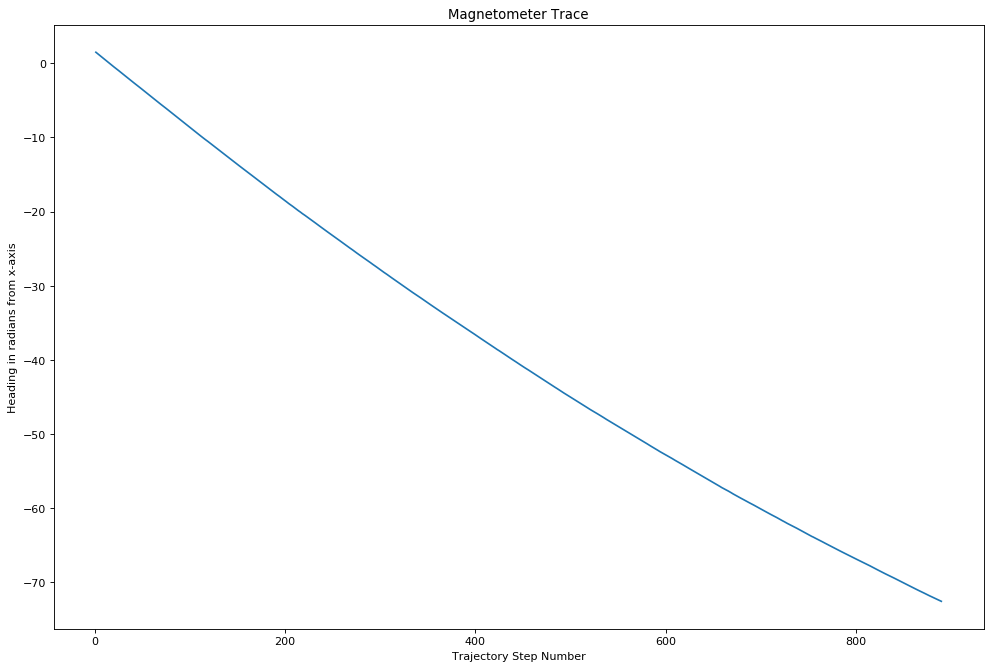

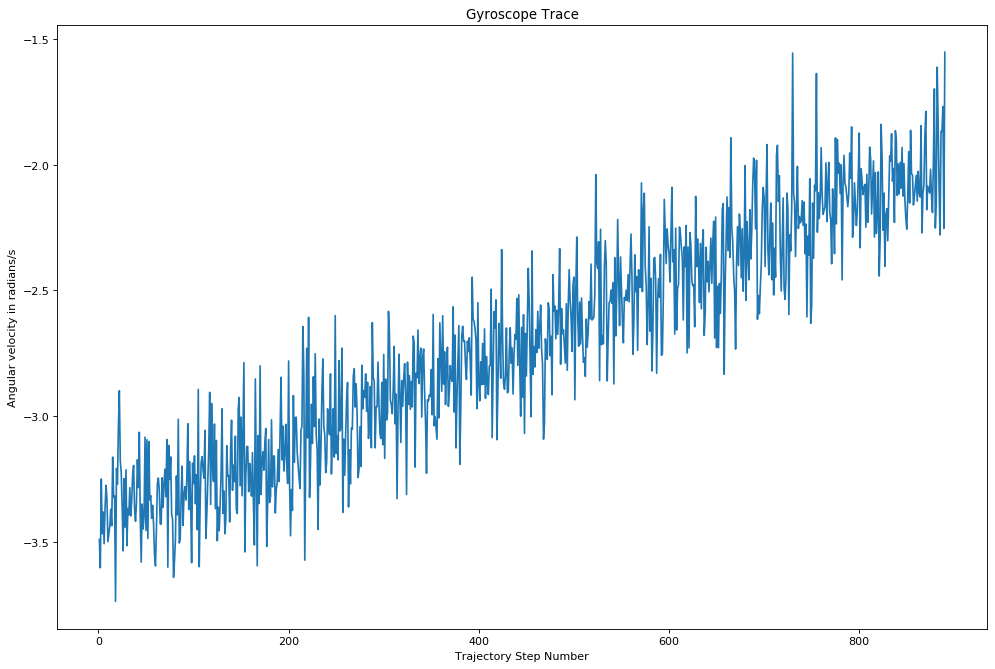

------
Mean Euclidean difference between expected and obtained points is 8.69366176351124 mm
------
RMSE of expected and obtained thetas is 6.325195171909068e-05 radians
------
RMSE of expected and obtained omega is 0.005894483834625385 radians/second
------


In [19]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=250, y=250, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, i*50/890-60] for i in range(890)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_3')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 4: Circular Trajectory (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


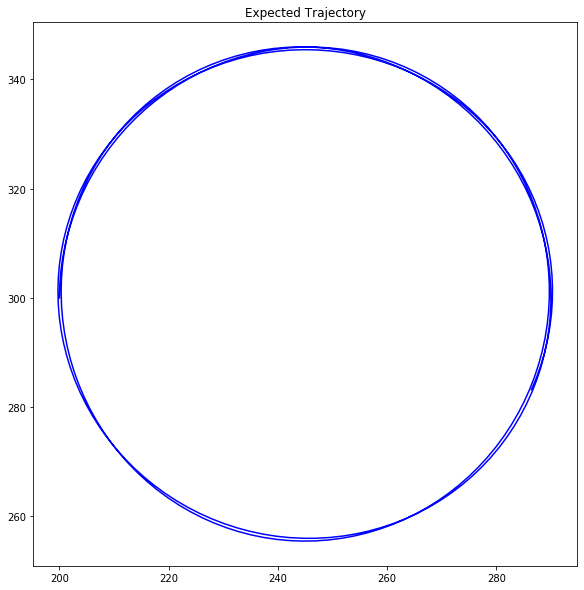

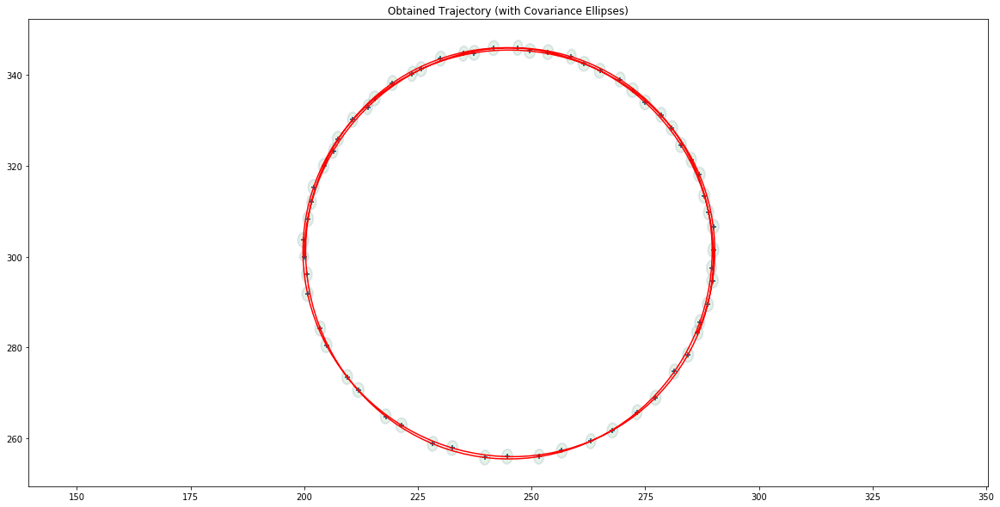

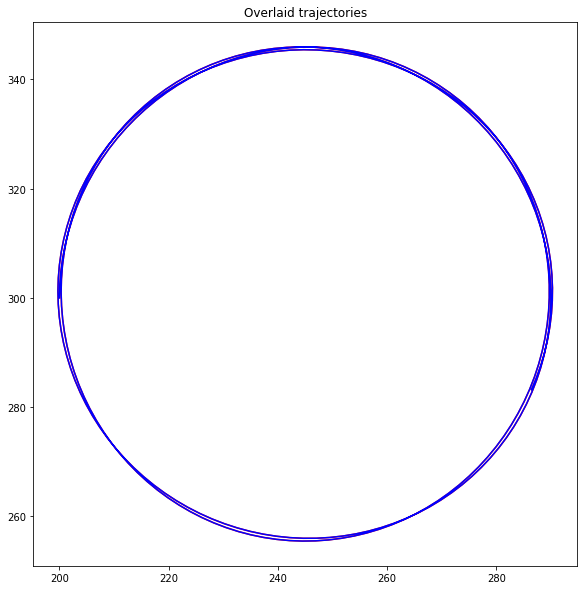

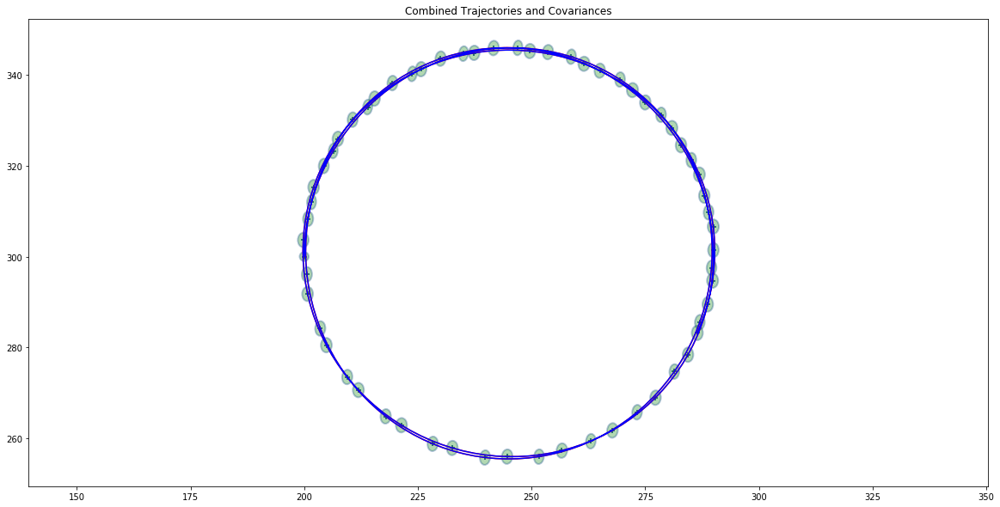

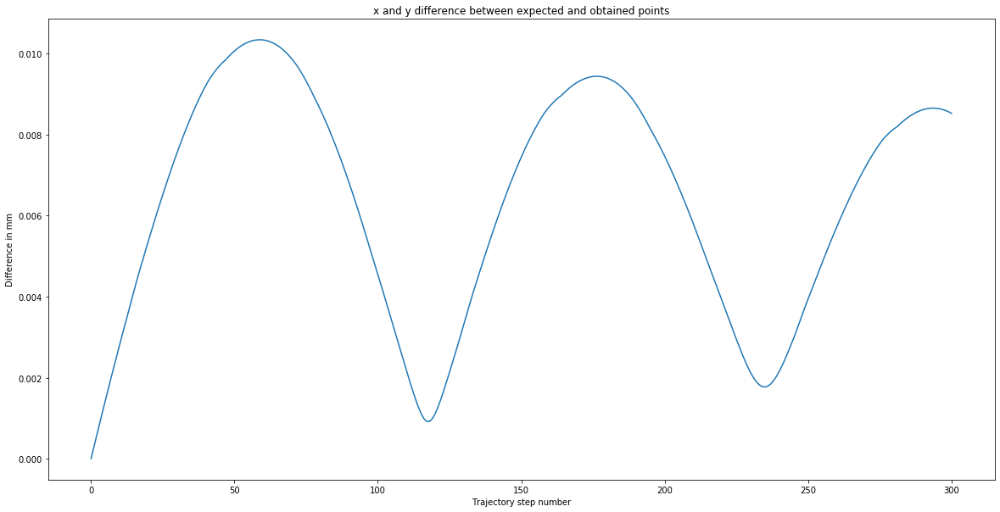

...

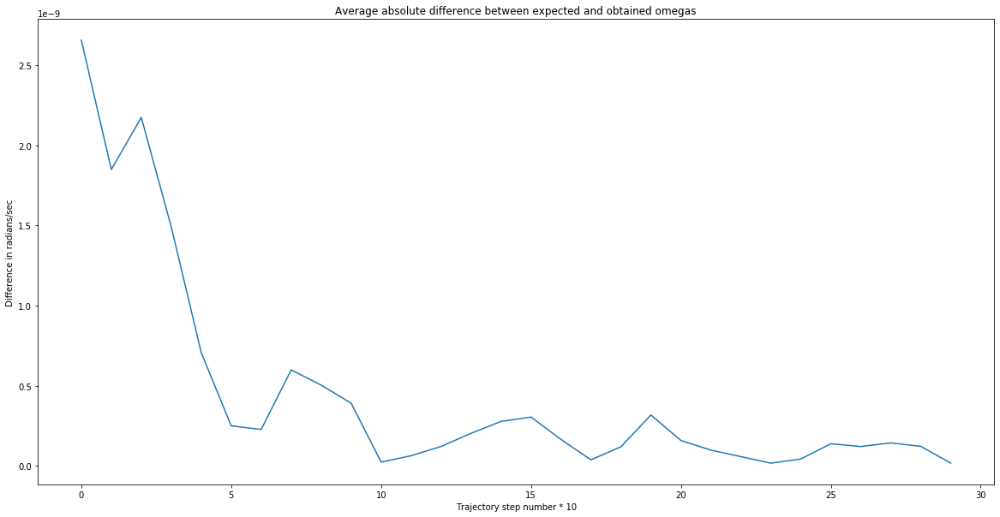

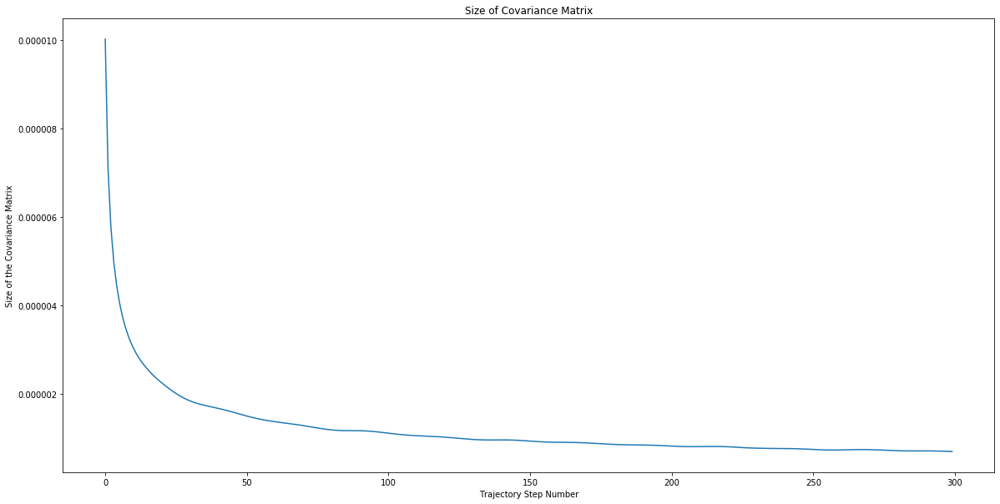

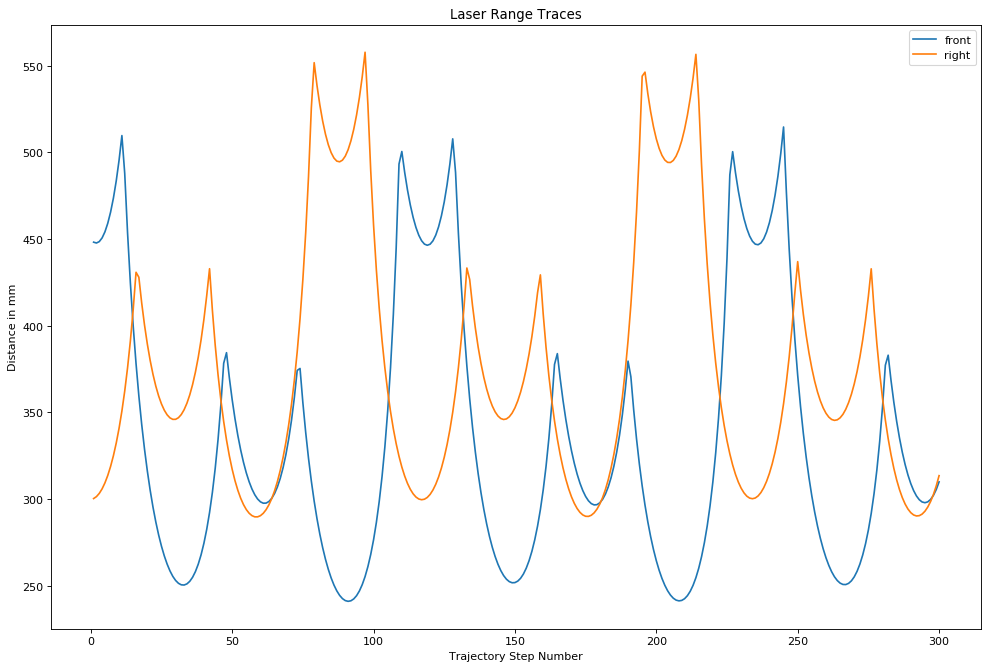

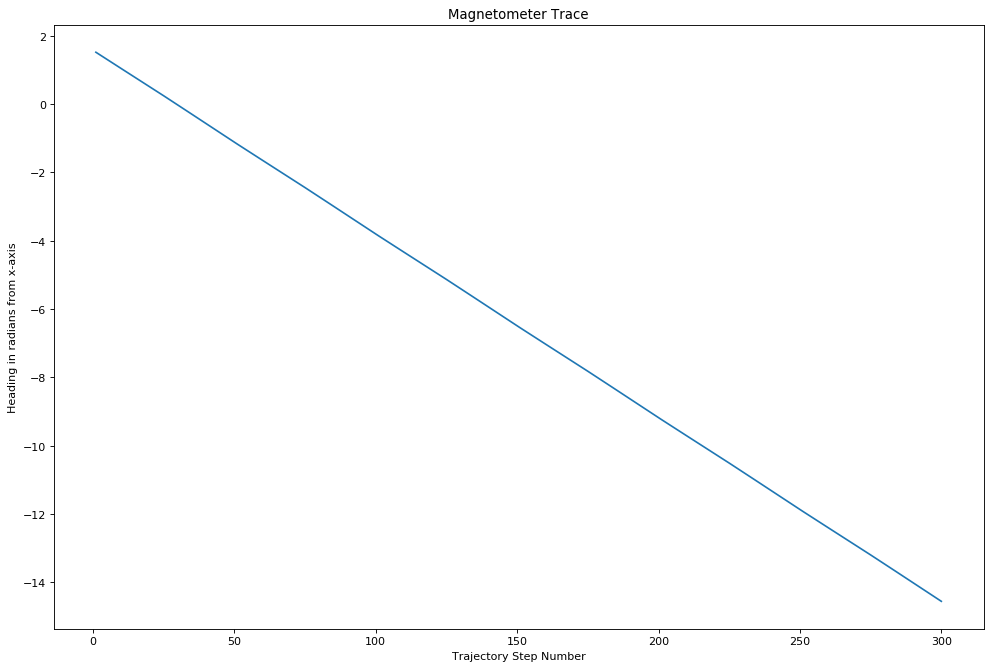

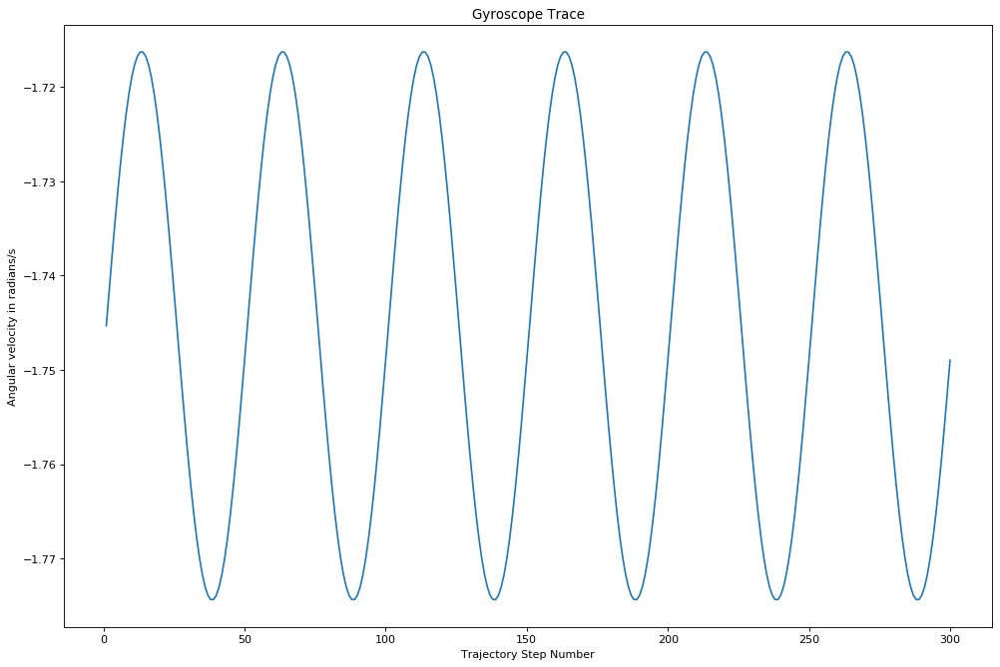

------
Mean Euclidean difference between expected and obtained points is 0.006345855419924606 mm
------
RMSE of expected and obtained thetas is 6.698193114029318e-12 radians
------
RMSE of expected and obtained omega is 8.87167968931185e-10 radians/second
------


In [20]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0])

# Set initial conditions
x_0 = State(x=200, y=300, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, math.sin(20*(i*2*math.pi/1000))] for i in range(300)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_4_clean')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 4: Circular Trajectory (w/ noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


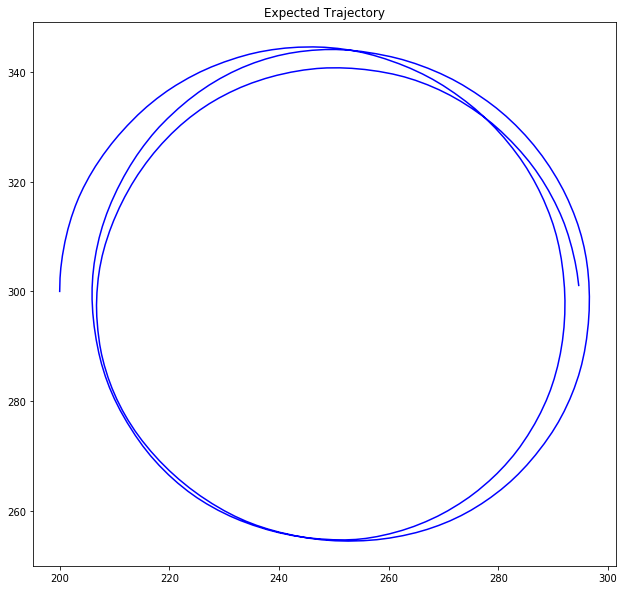

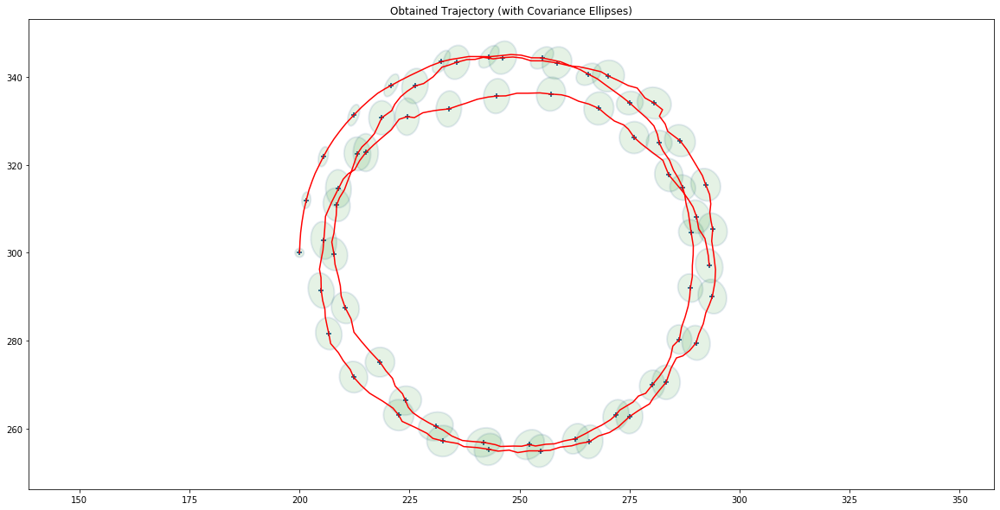

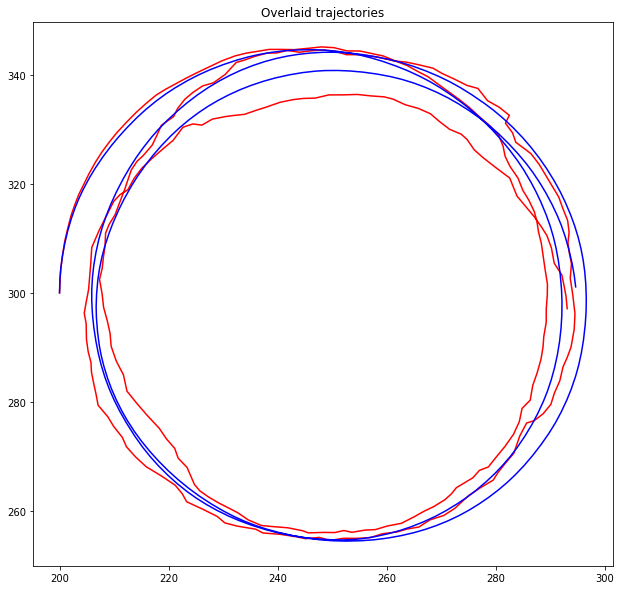

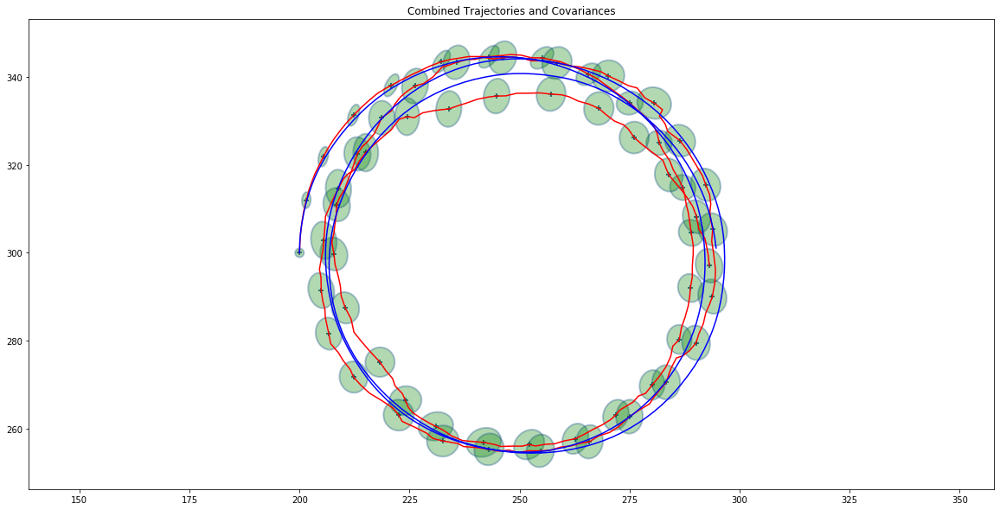

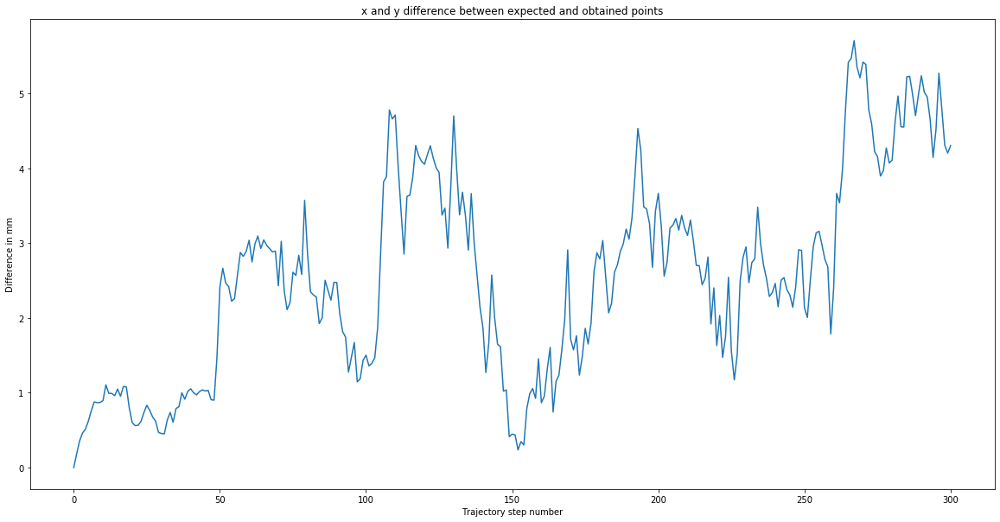

...

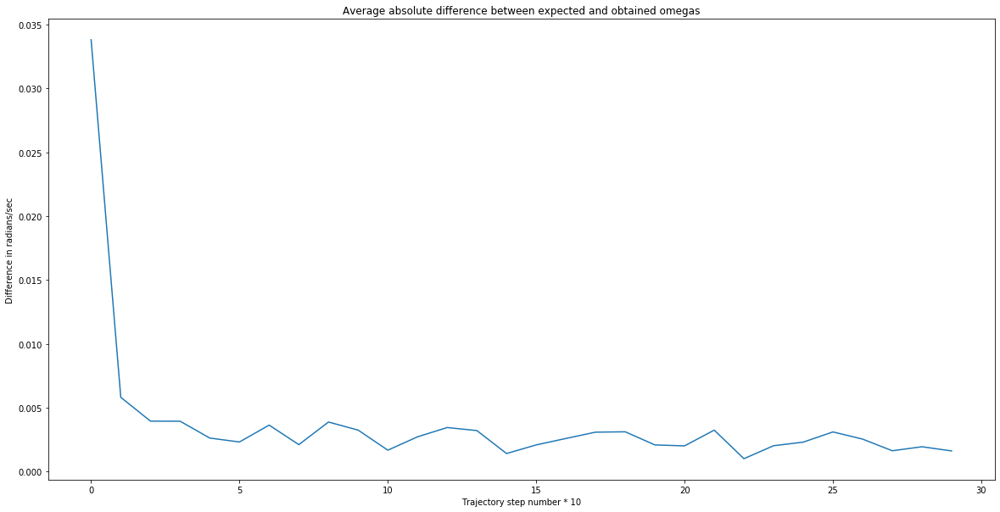

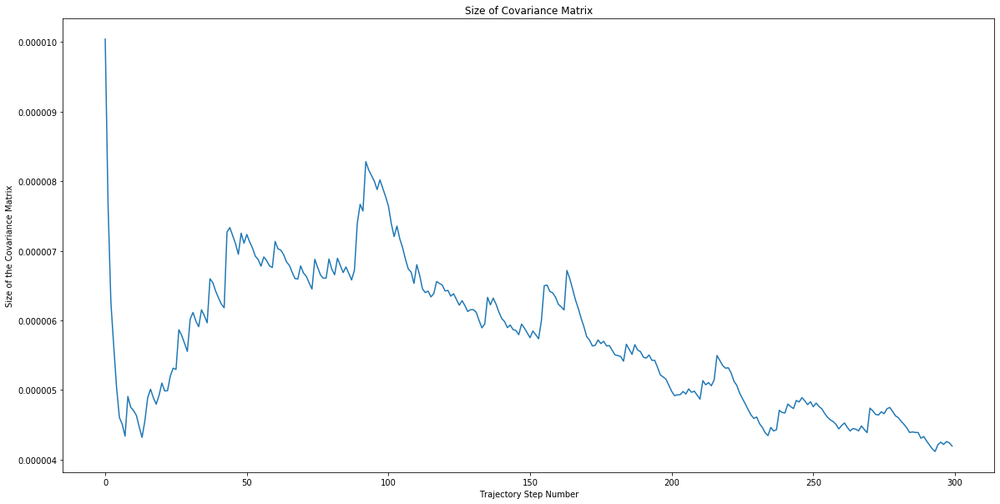

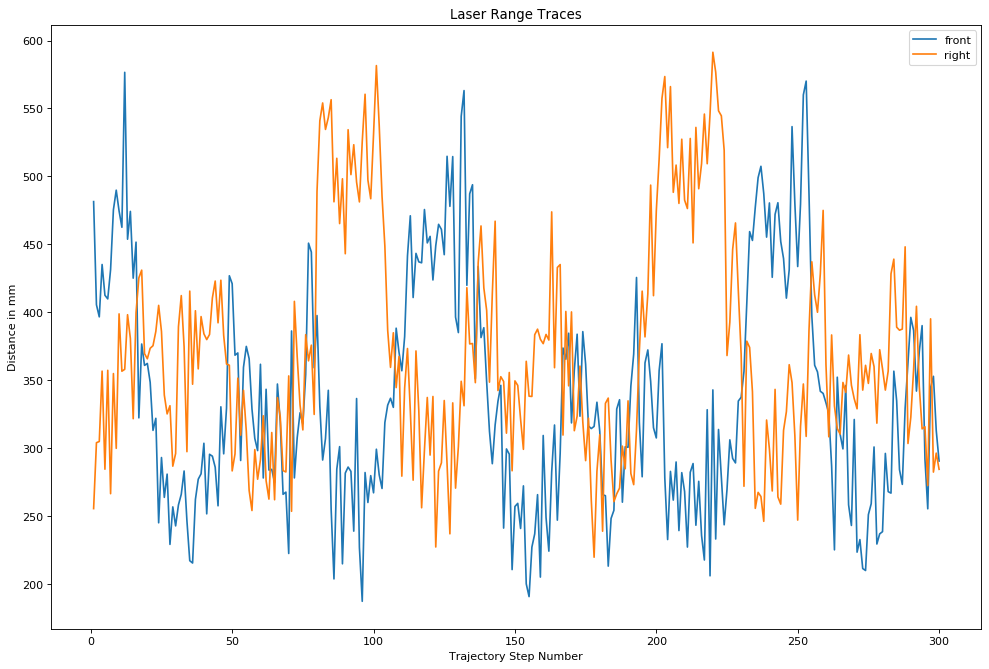

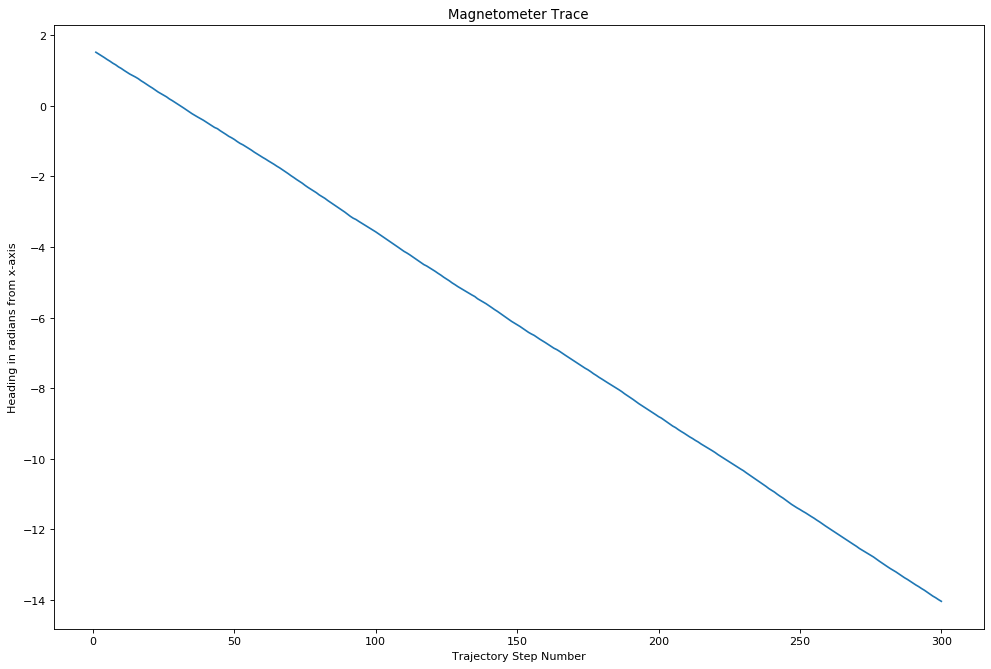

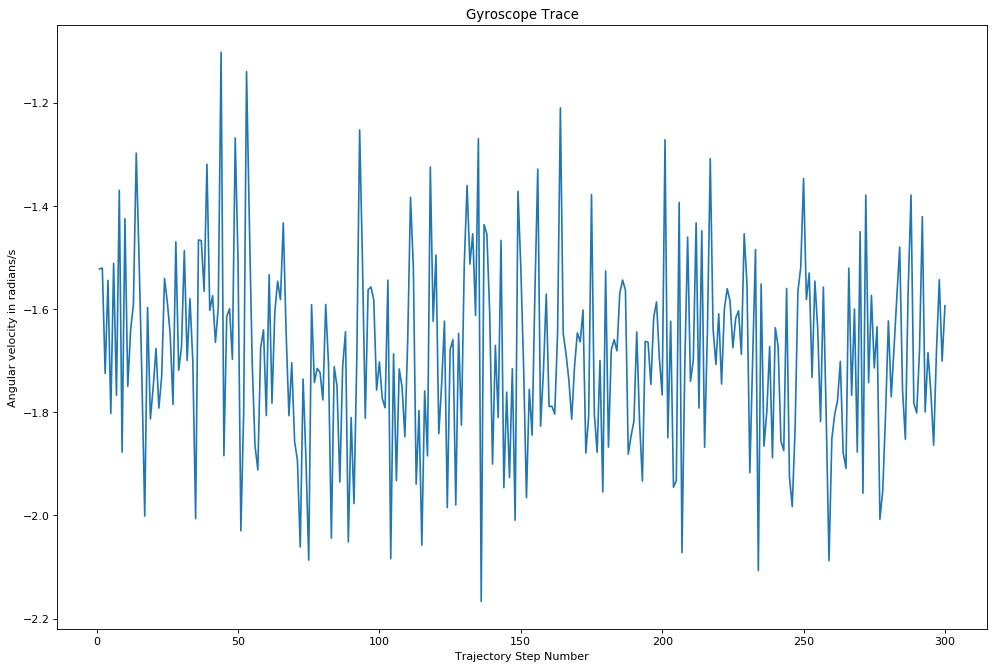

------
Mean Euclidean difference between expected and obtained points is 2.529565370170334 mm
------
RMSE of expected and obtained thetas is 6.141887562522578e-05 radians
------
RMSE of expected and obtained omega is 0.012553044570208194 radians/second
------


In [21]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=200, y=300, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, math.sin(20*(i*2*math.pi/1000))] for i in range(300)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_4')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example: Unknown starting point (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


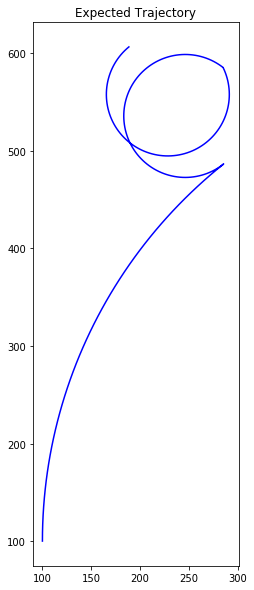

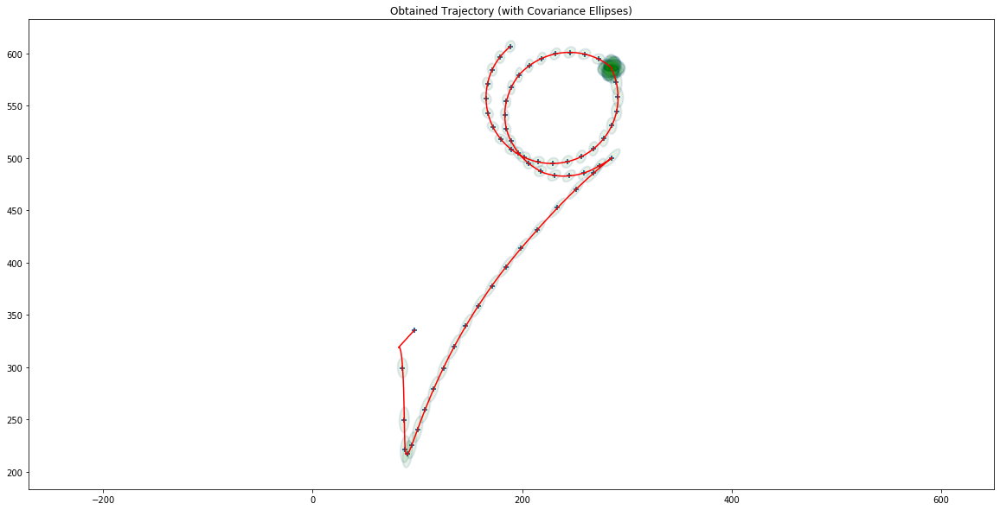

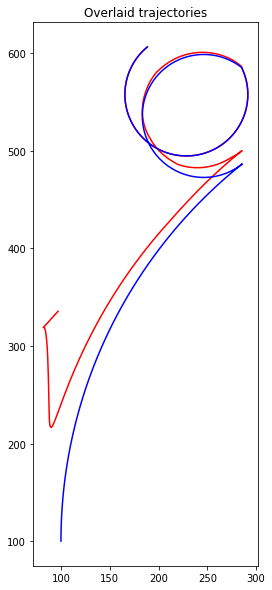

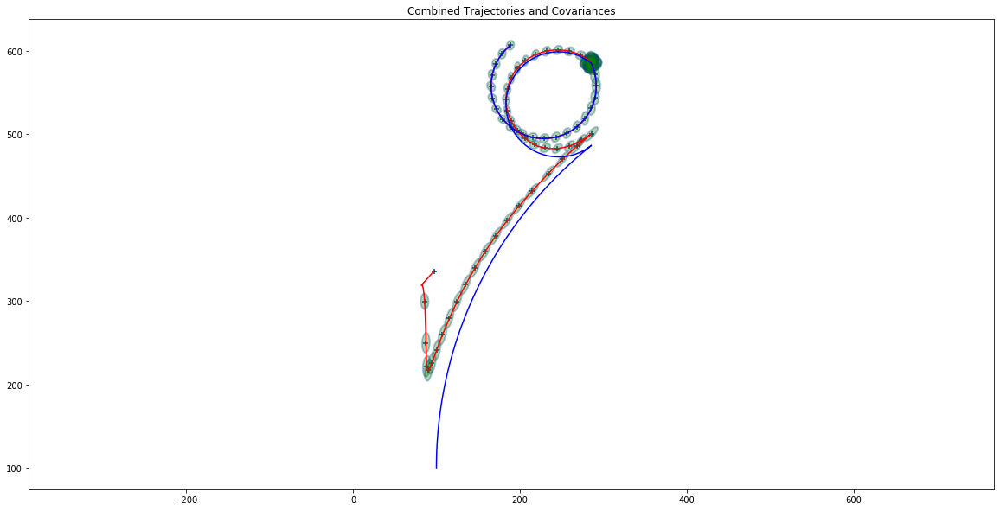

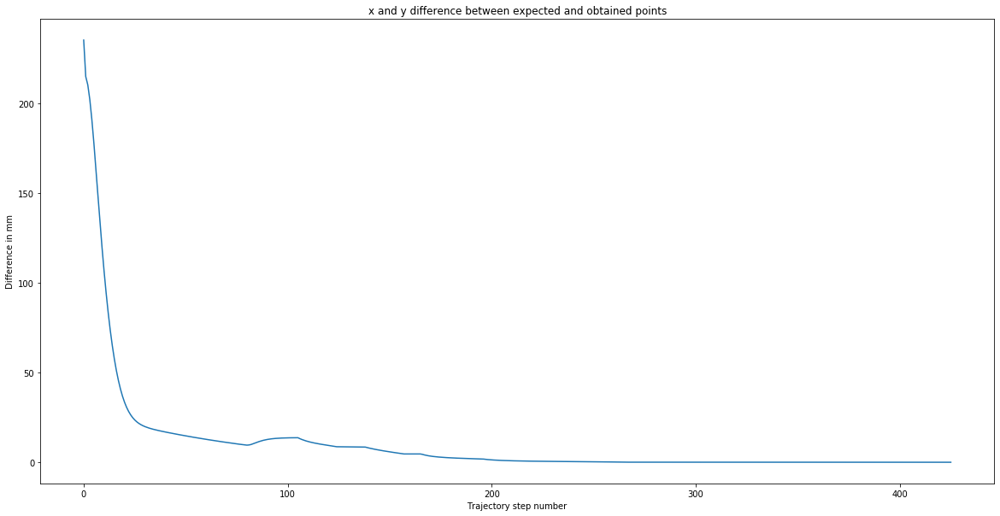

...

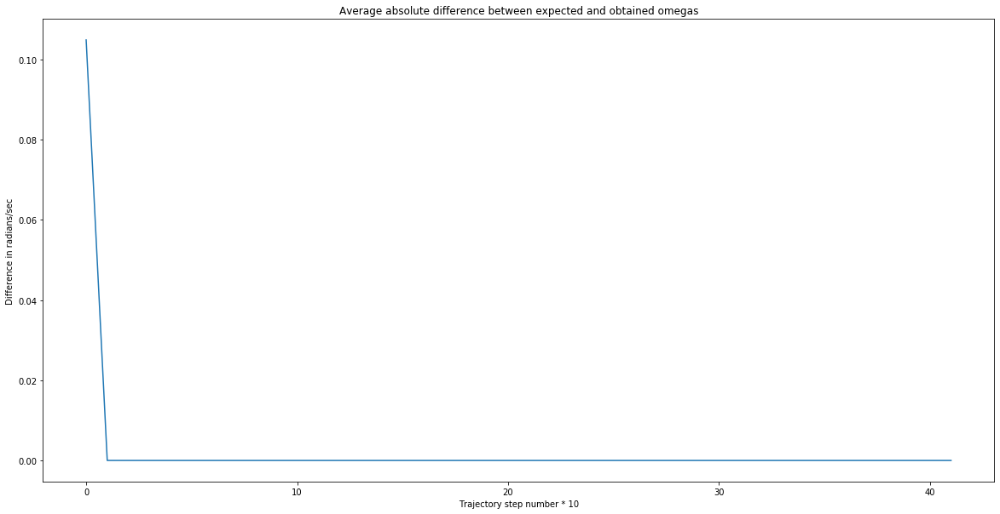

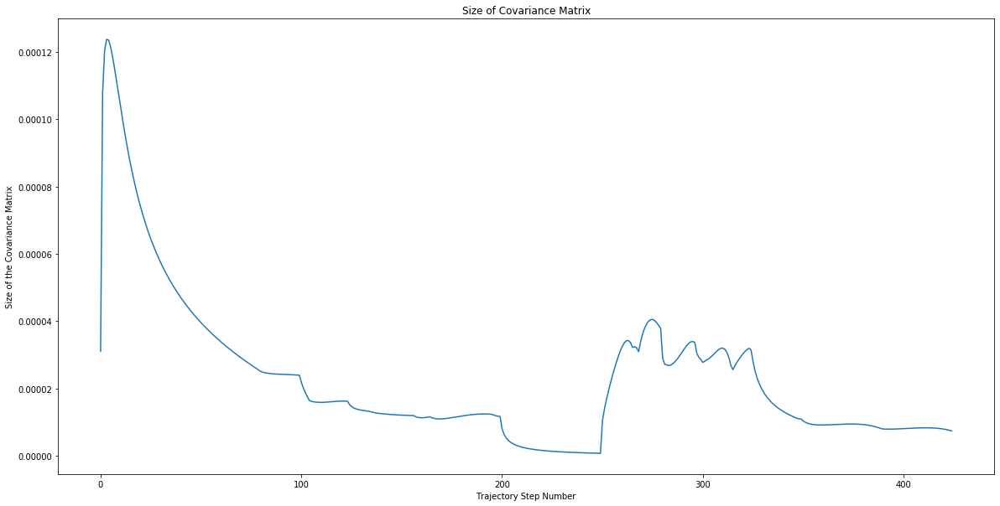

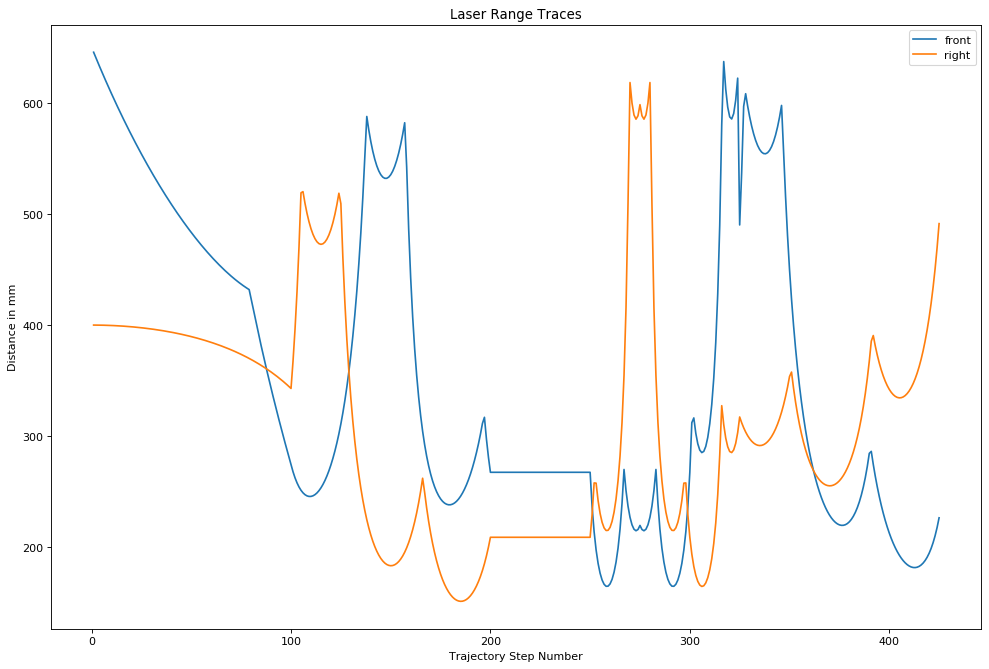

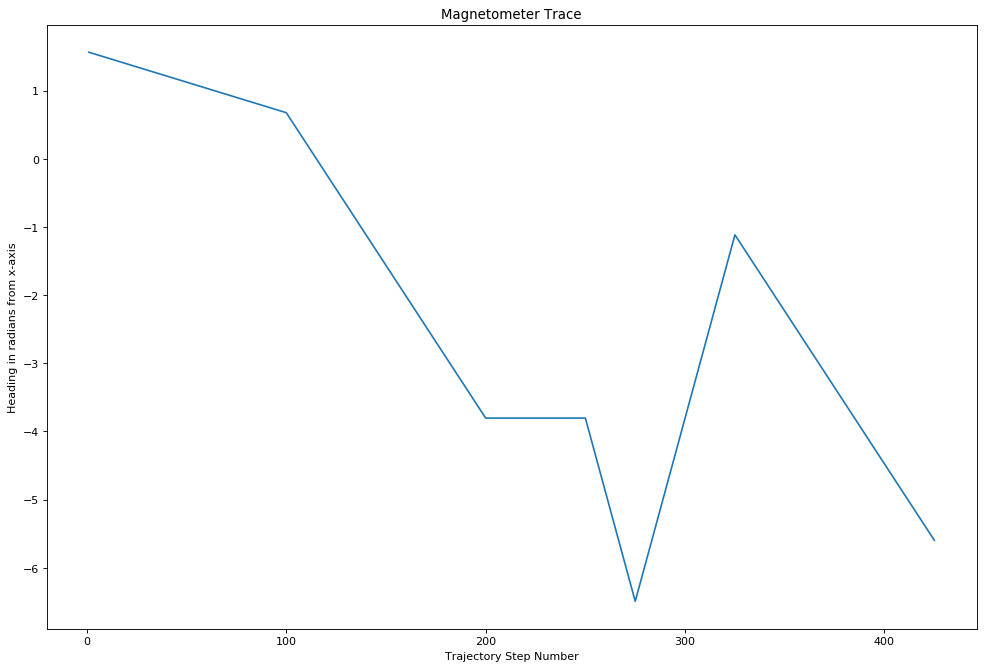

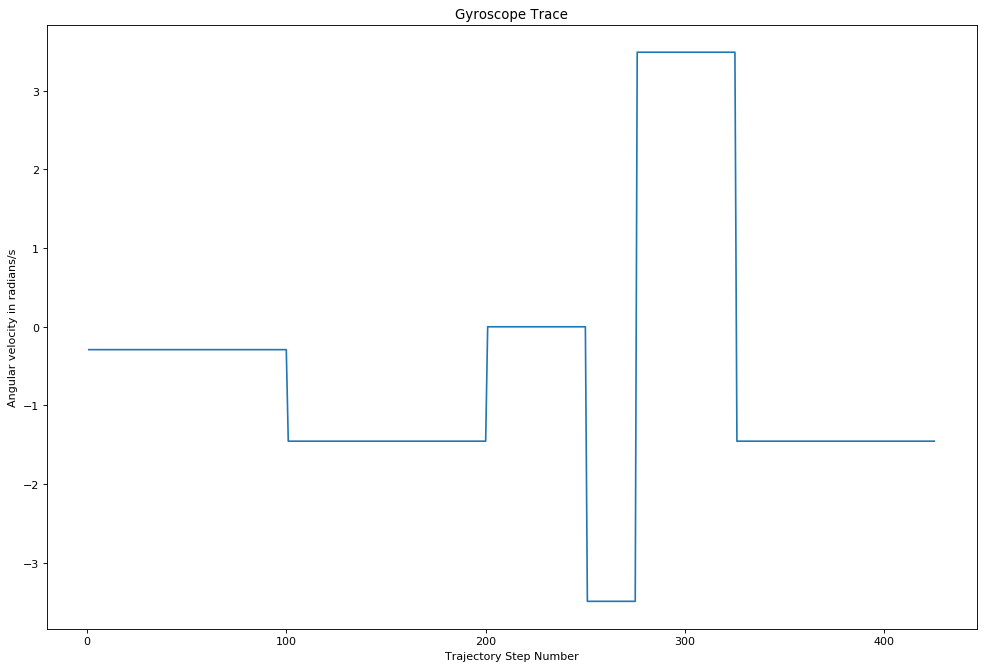

------
Mean Euclidean difference between expected and obtained points is 10.168568903016844 mm
------
RMSE of expected and obtained thetas is 0.2174428256035445 radians
------
RMSE of expected and obtained omega is 0.050676578495643214 radians/second
------


In [22]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0])

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_5_clean')
kf.run(u_list, covariance_step = 5, make_gif = False, known_x0 = False)

#### Example: Unknown starting point (w/ noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


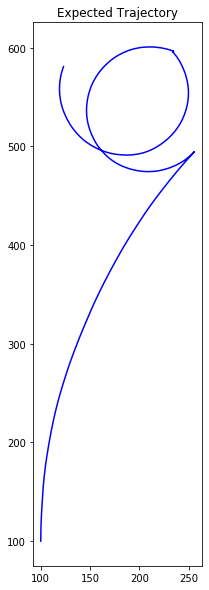

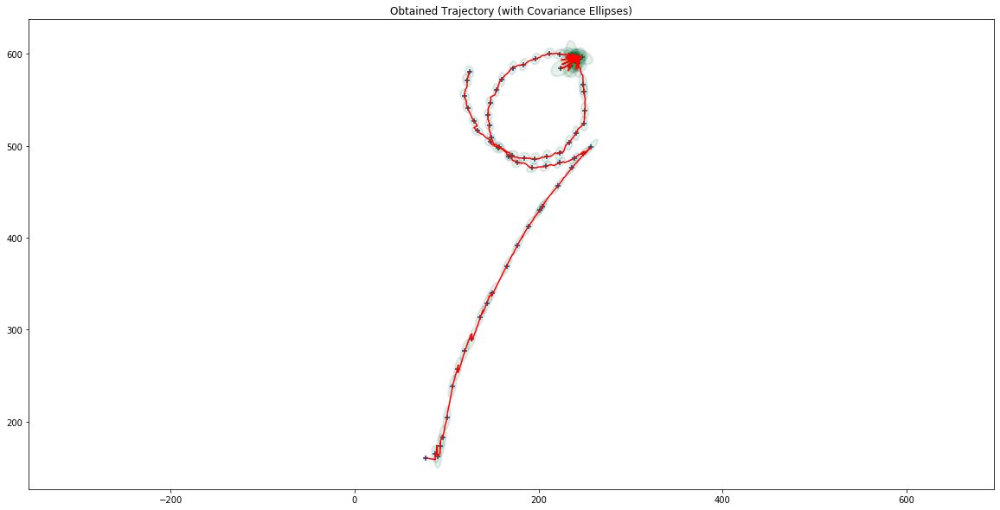

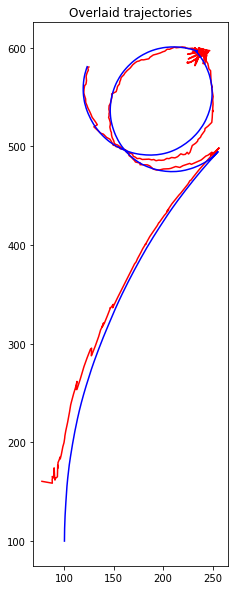

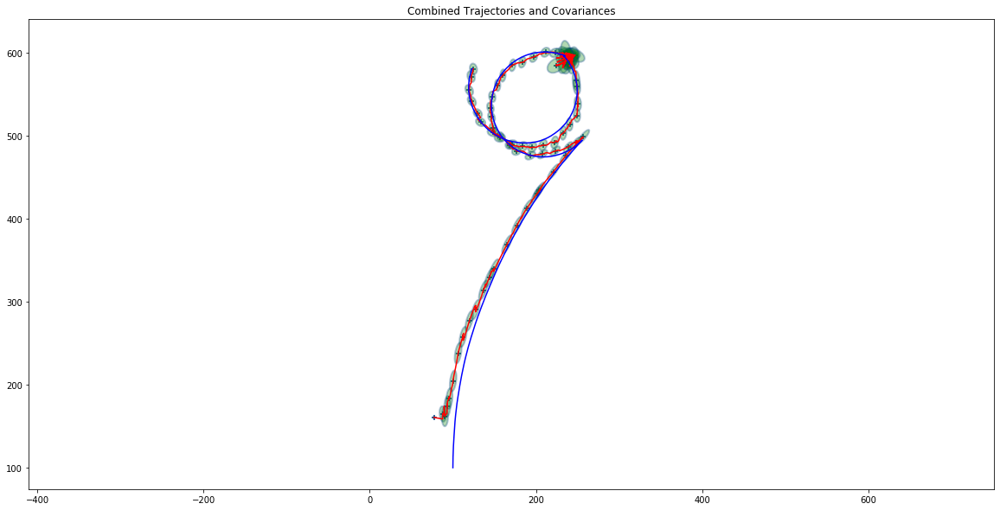

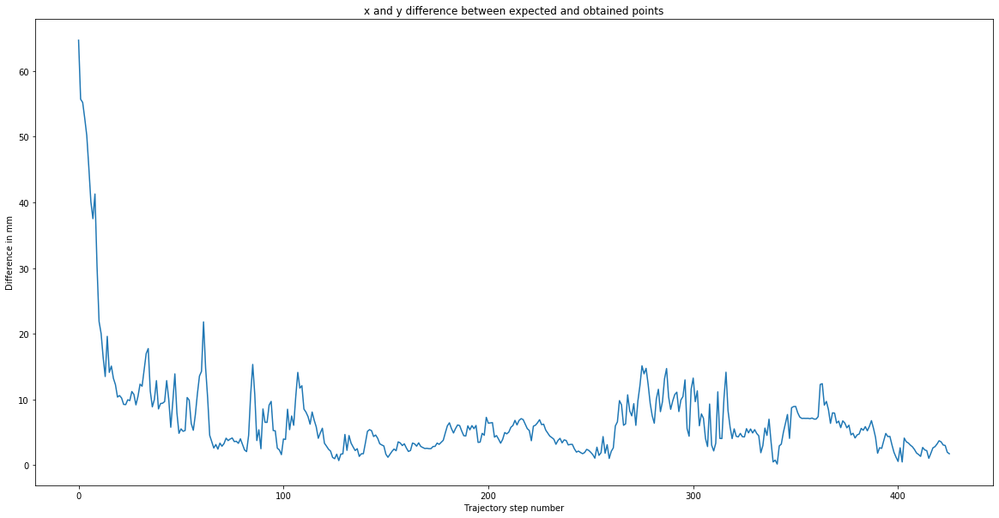

...

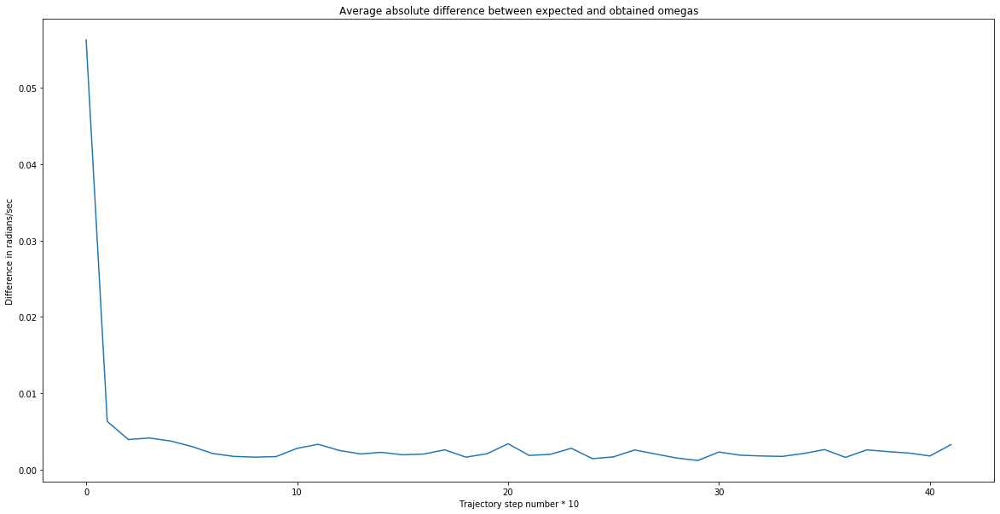

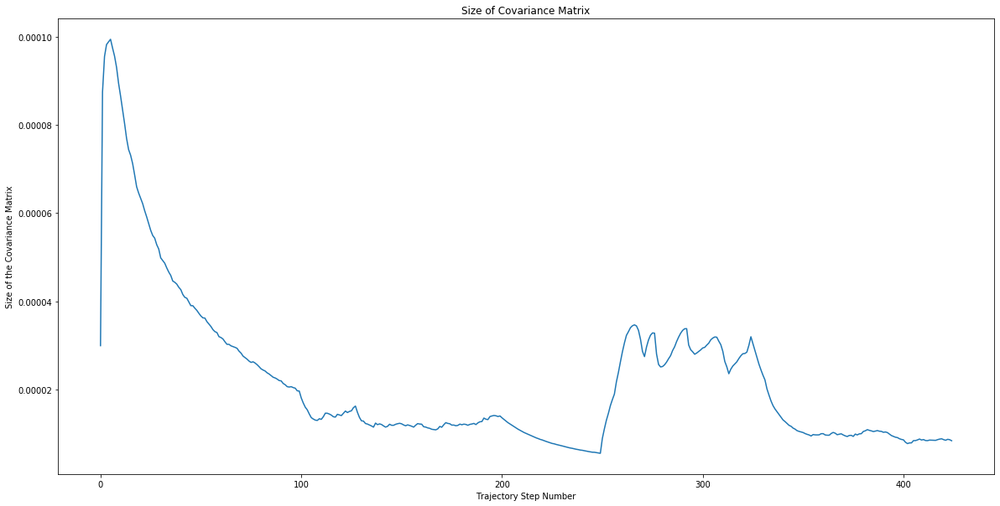

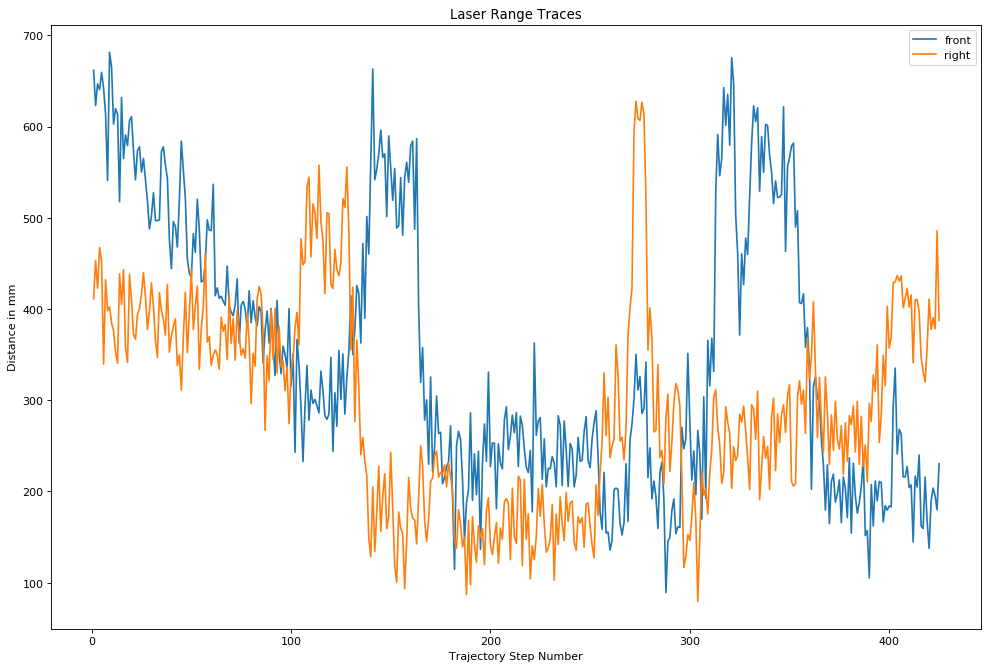

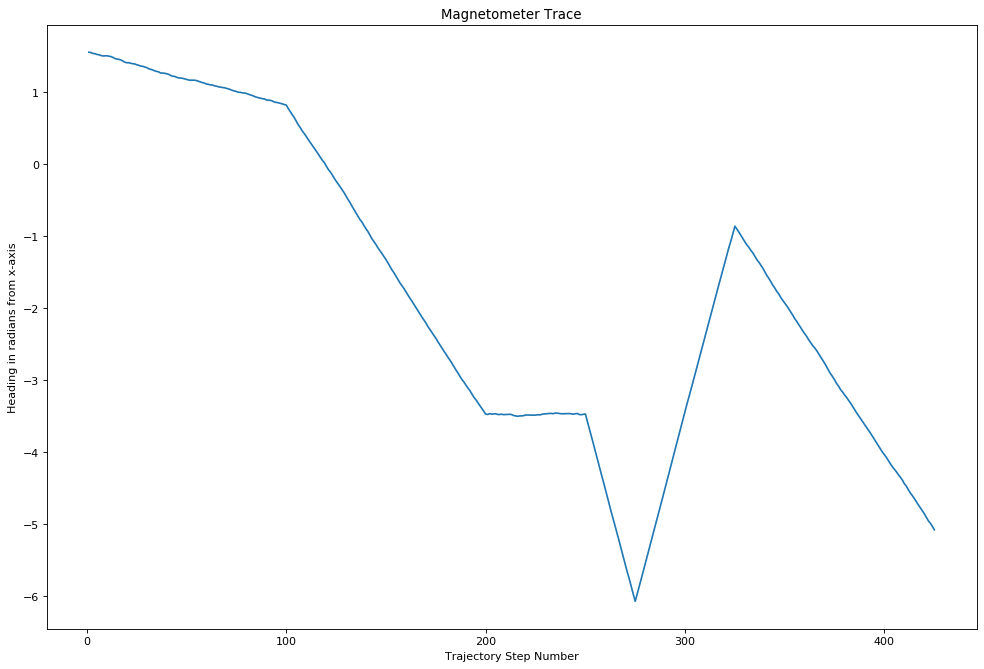

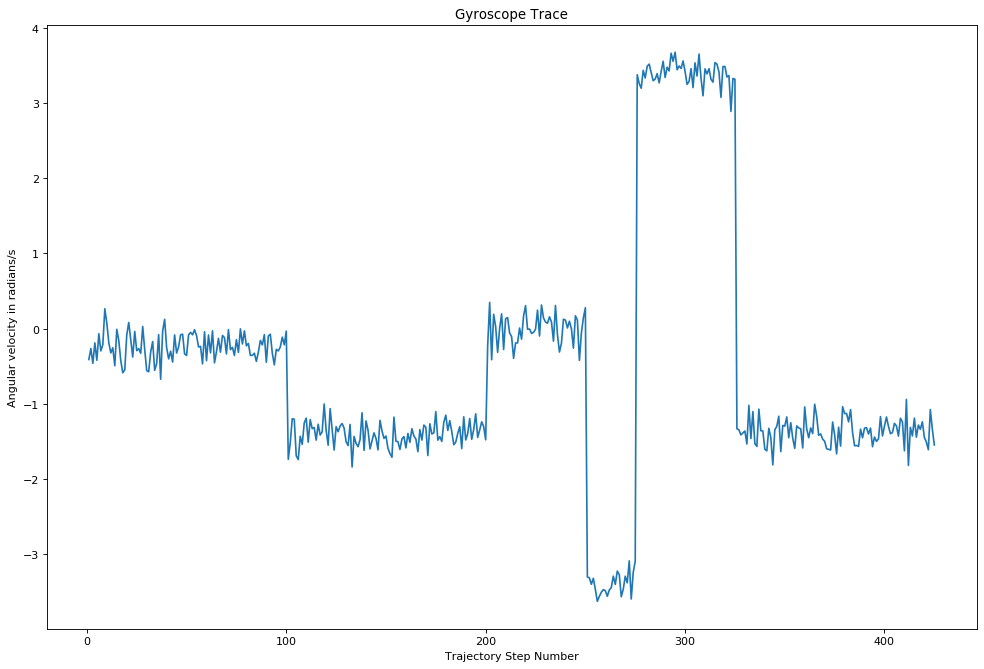

------
Mean Euclidean difference between expected and obtained points is 6.947391079983855 mm
------
RMSE of expected and obtained thetas is 0.04729844700549661 radians
------
RMSE of expected and obtained omega is 0.018256130680885347 radians/second
------


In [23]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_5')
kf.run(u_list, covariance_step = 5, make_gif = False, known_x0 = False)

#### Example 6: Pointy Trajectory (no noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


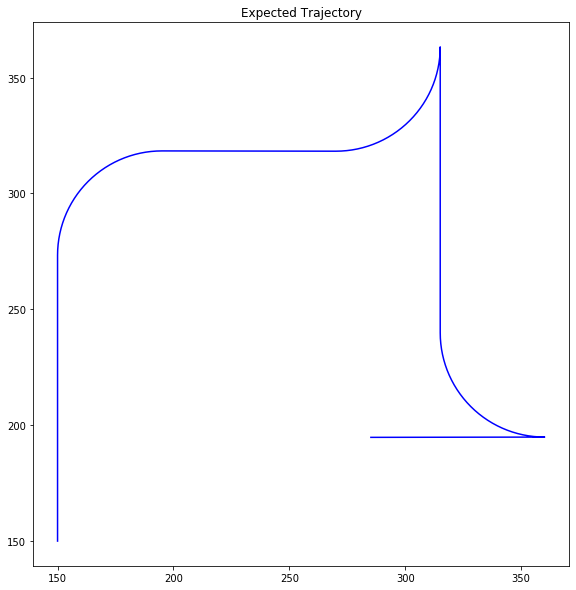

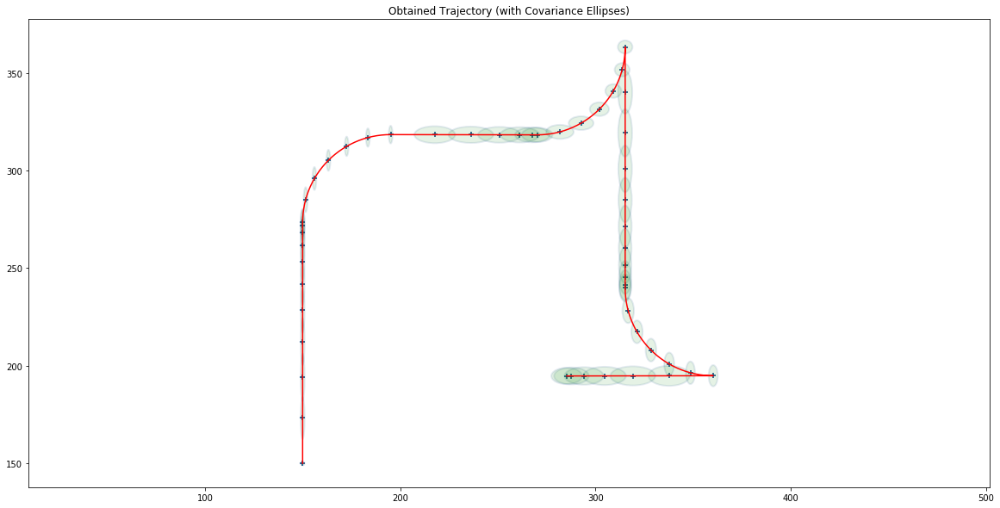

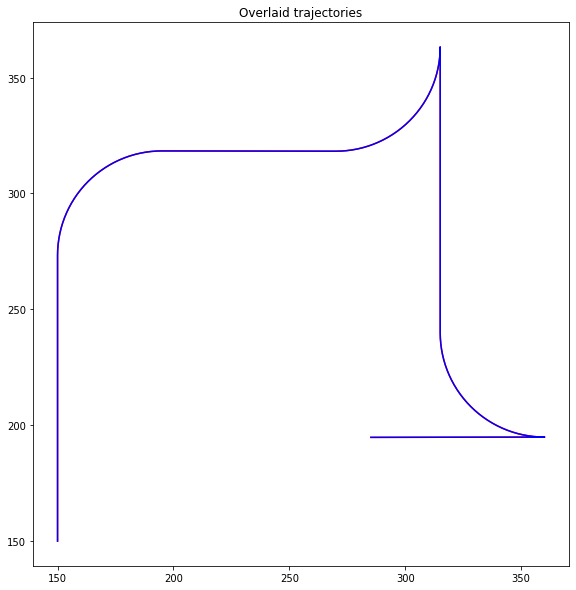

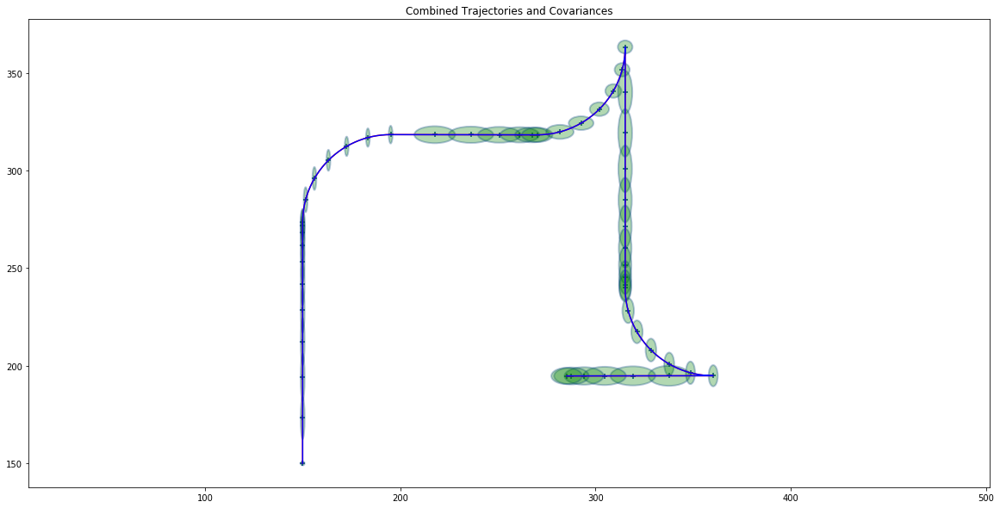

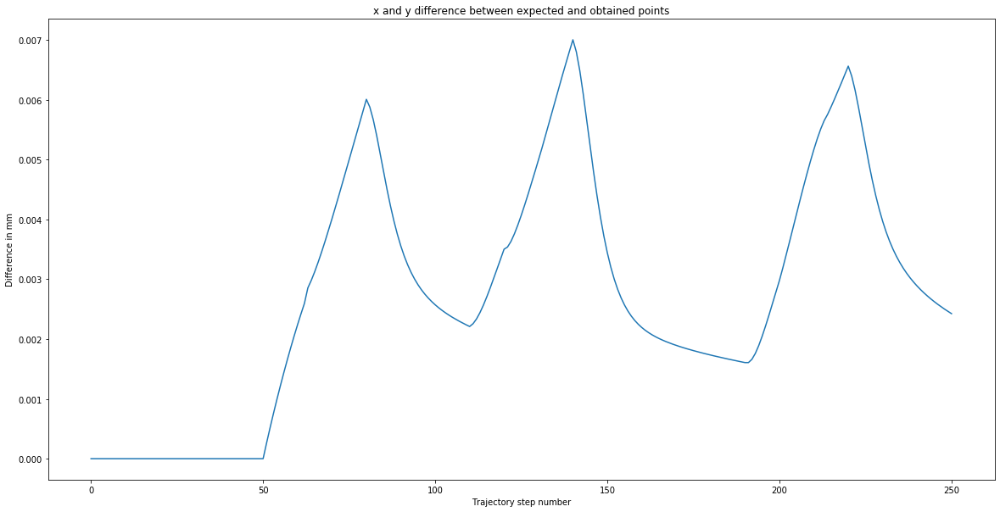

...

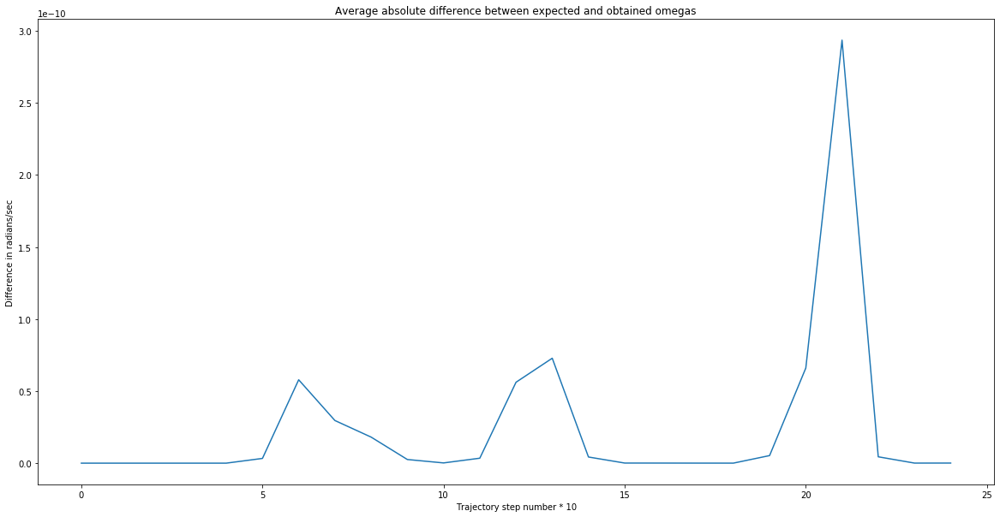

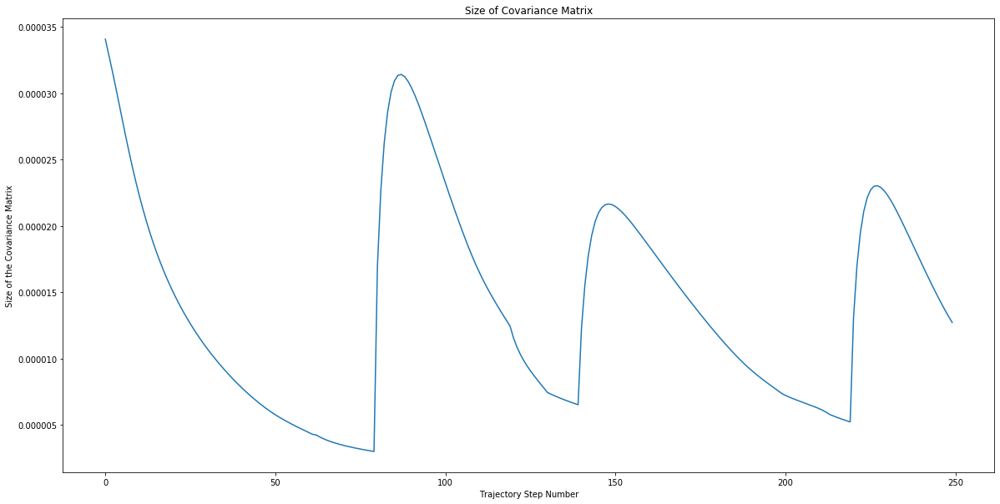

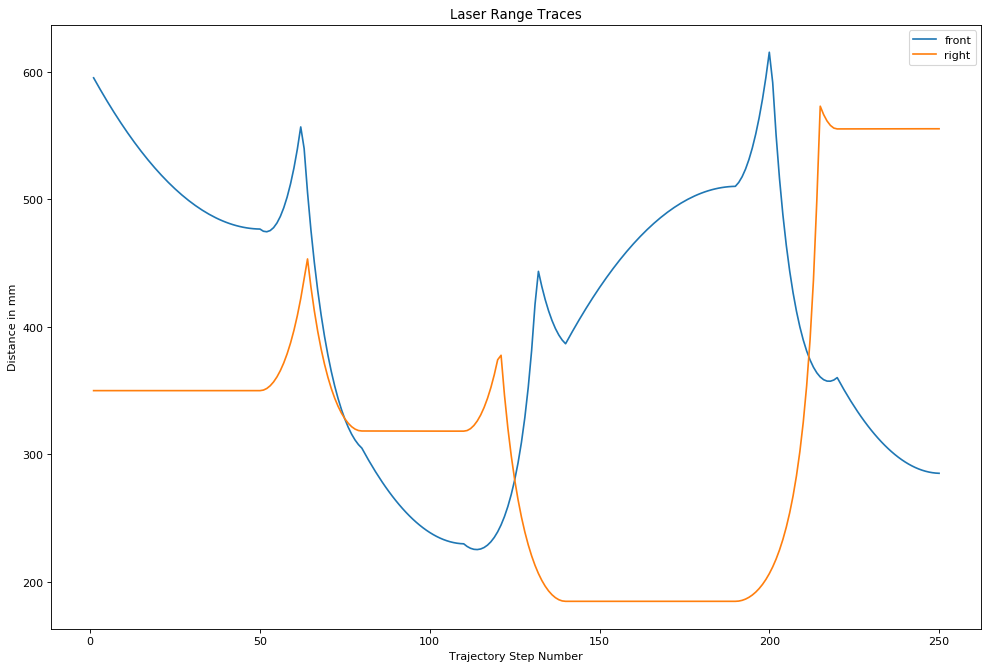

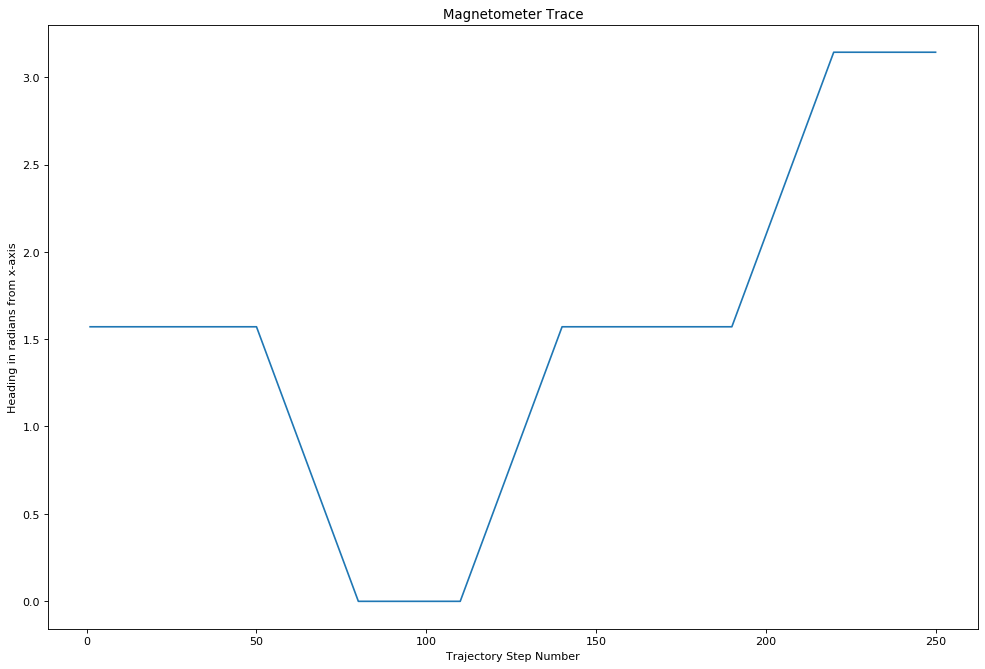

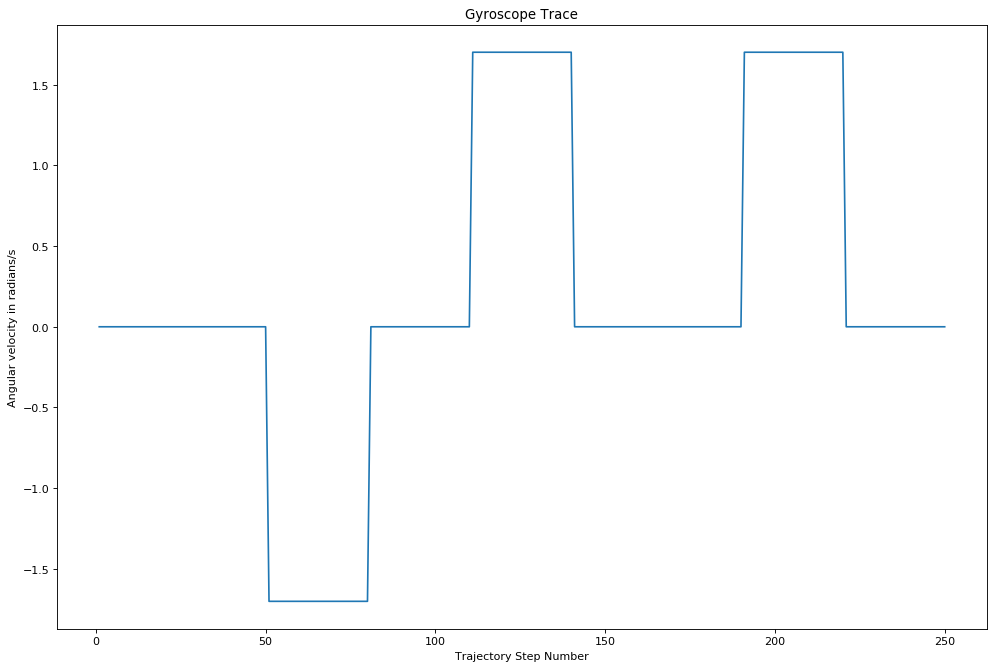

------
Mean Euclidean difference between expected and obtained points is 0.00275641813313485 mm
------
RMSE of expected and obtained thetas is 4.593297826641787e-12 radians
------
RMSE of expected and obtained omega is 1.1708245458759204e-10 radians/second
------


In [24]:
# Make system model
model = SystemModel(std_devs=[0,0,0,0,0,0])

# Set initial conditions
x_0 = State(x=150, y=150, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[(50-i)/50*60, (50-i)/50*60] for i in range(50)] +\
         [[58.5, 0] for i in range(30)] +\
         [[(30-i)/30*60, (30-i)/30*60] for i in range(30)] +\
         [[0, 58.5] for i in range(30)] +\
         [[-(50-i)/50*60, -(50-i)/50*60] for i in range(50)] +\
         [[-58.5, 0] for i in range(30)] +\
         [[(30-i)/30*60, (30-i)/30*60] for i in range(30)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_6_clean')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example 6: Pointy Trajectory (w/ noise)

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


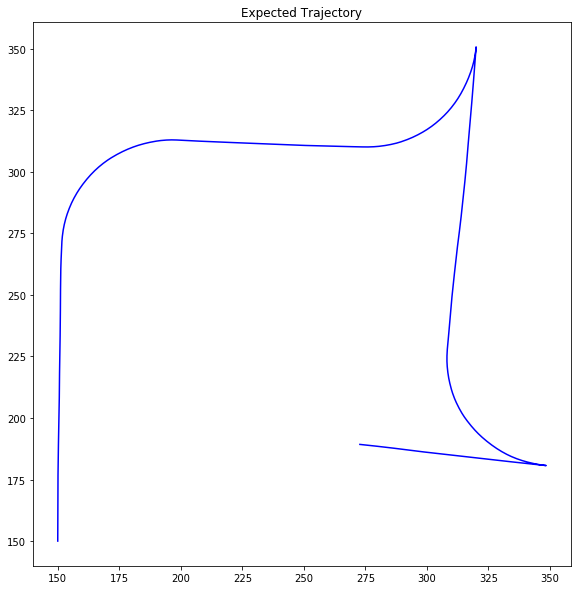

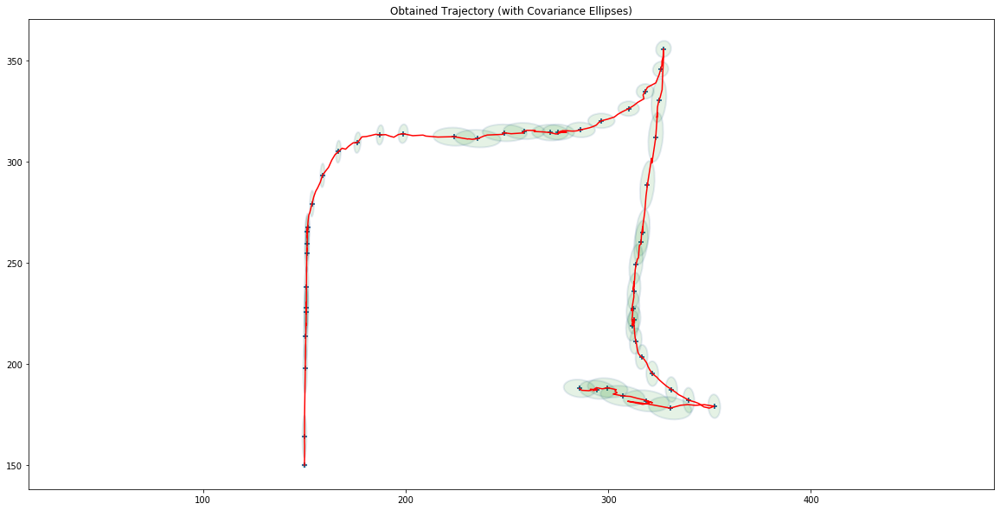

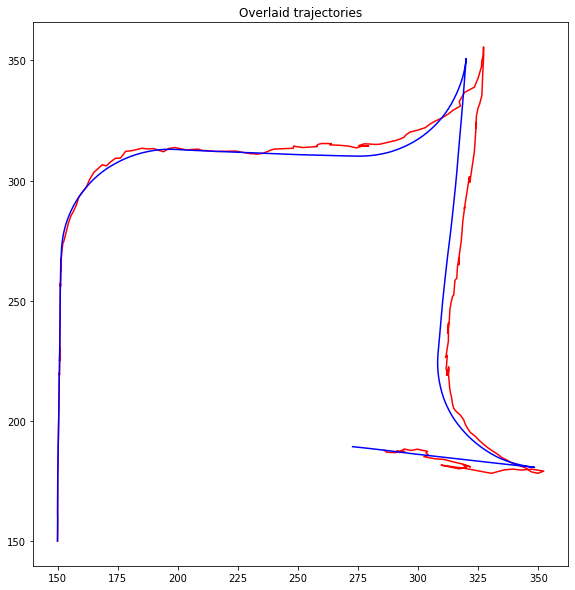

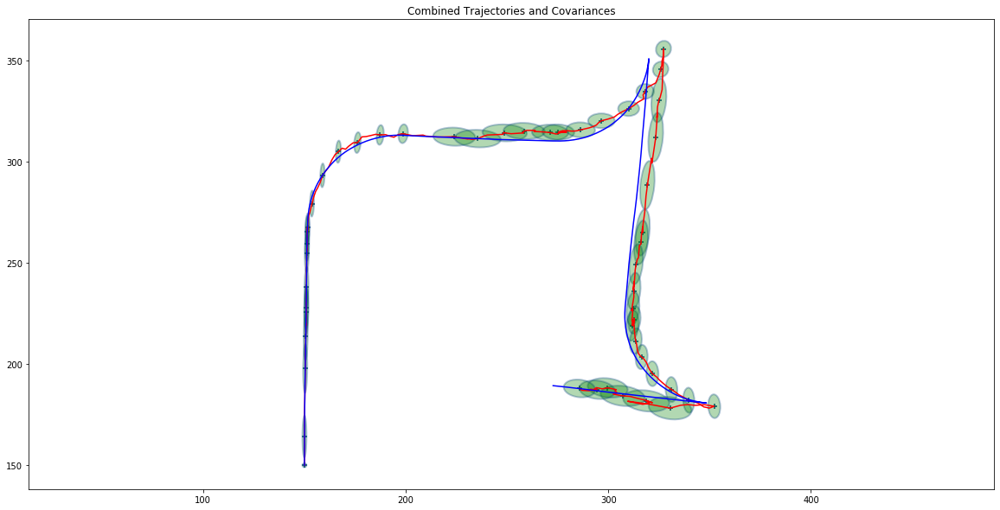

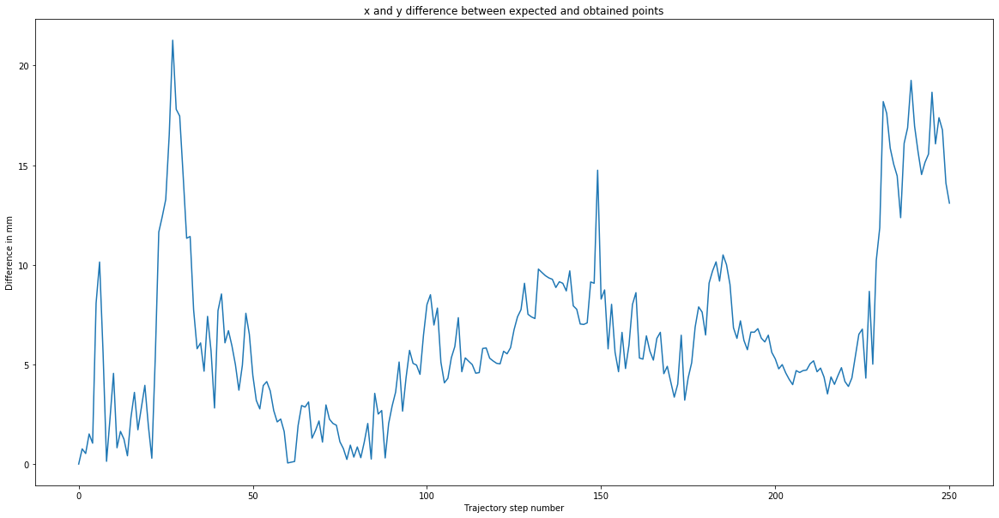

...

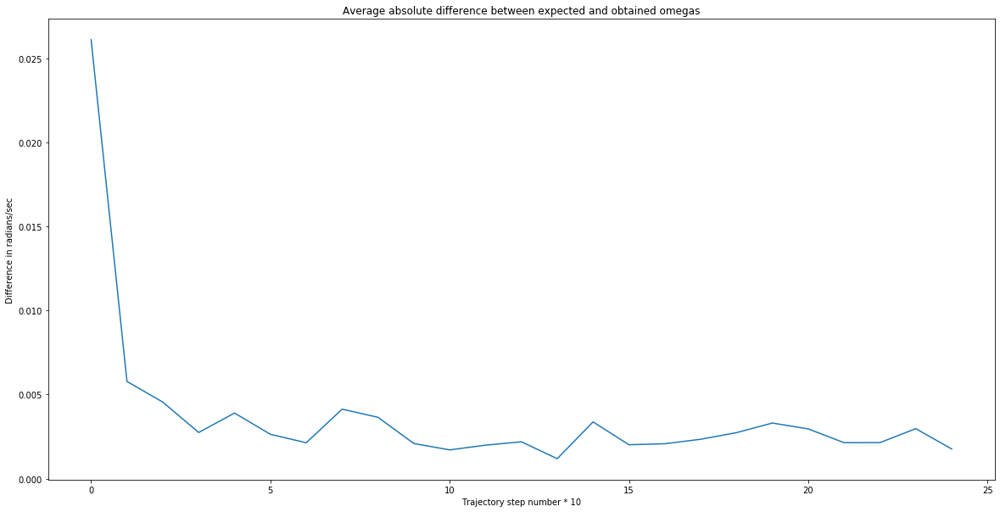

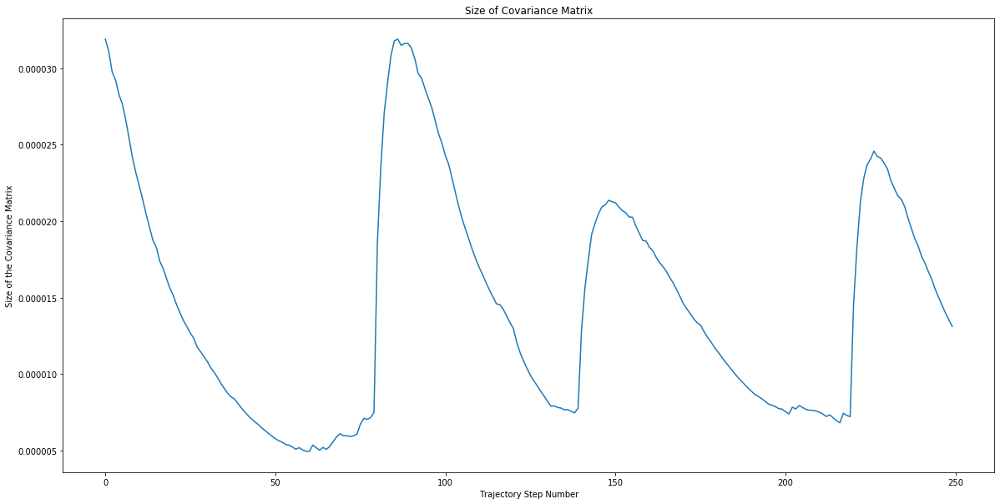

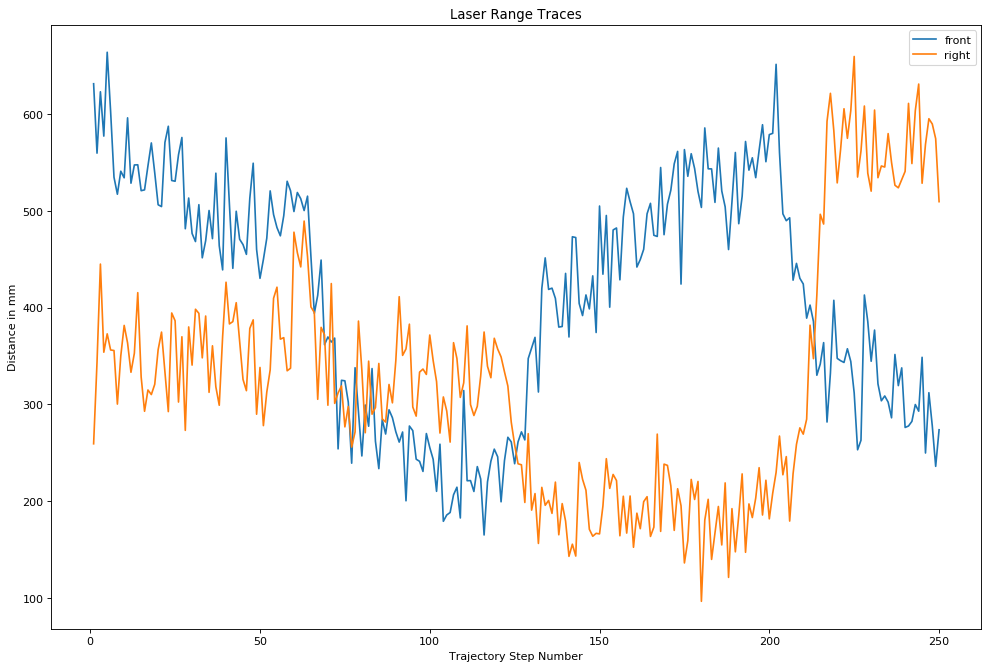

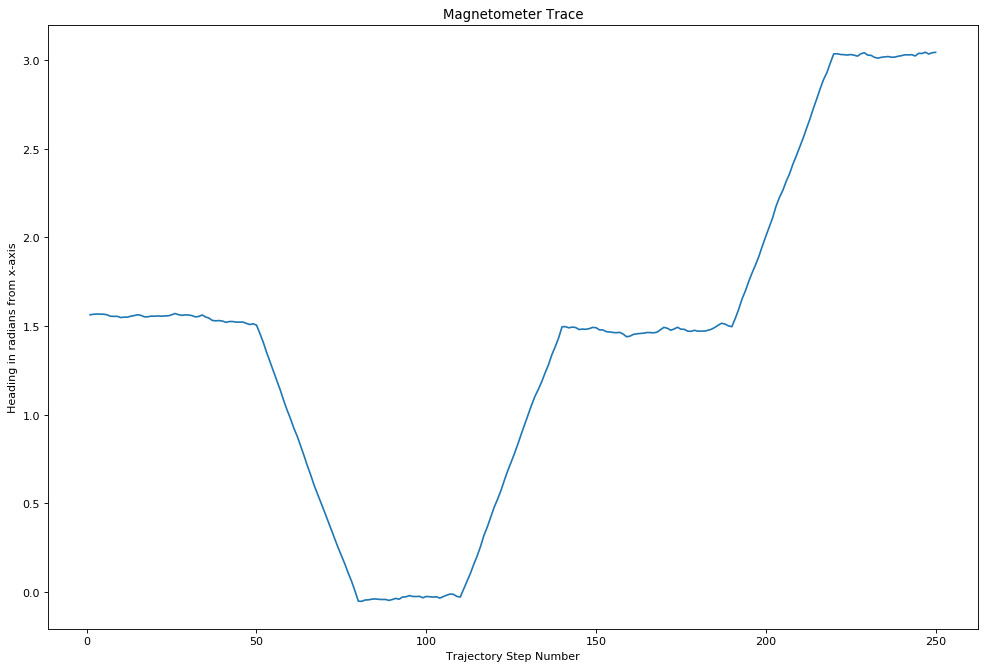

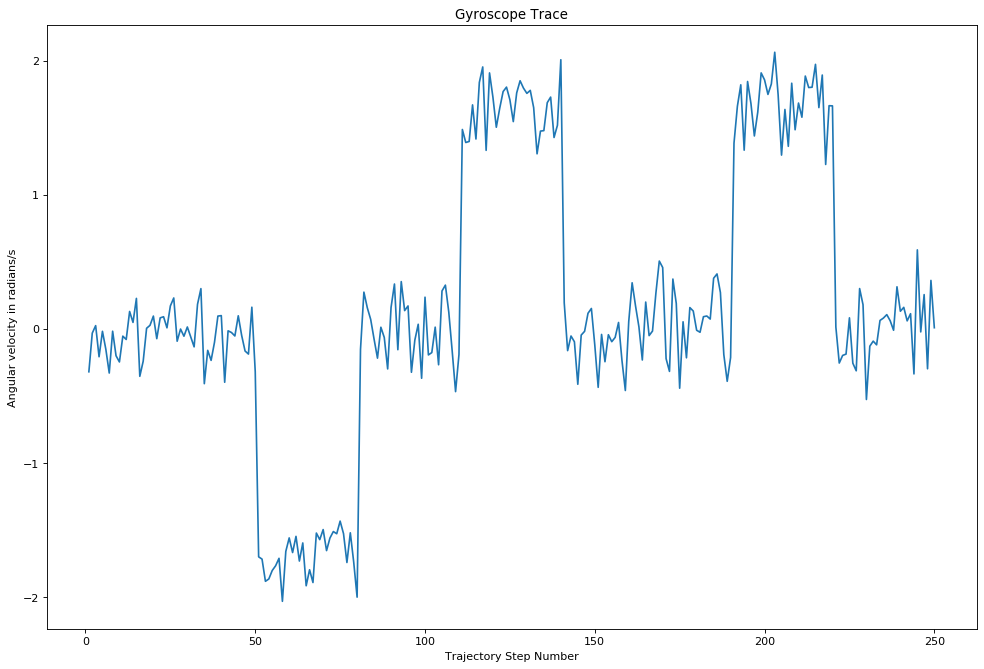

------
Mean Euclidean difference between expected and obtained points is 6.383759437604446 mm
------
RMSE of expected and obtained thetas is 6.180267870162636e-05 radians
------
RMSE of expected and obtained omega is 0.009010812457996238 radians/second
------


In [25]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=150, y=150, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[(50-i)/50*60, (50-i)/50*60] for i in range(50)] +\
         [[58.5, 0] for i in range(30)] +\
         [[(30-i)/30*60, (30-i)/30*60] for i in range(30)] +\
         [[0, 58.5] for i in range(30)] +\
         [[-(50-i)/50*60, -(50-i)/50*60] for i in range(50)] +\
         [[-58.5, 0] for i in range(30)] +\
         [[(30-i)/30*60, (30-i)/30*60] for i in range(30)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_6')
kf.run(u_list, covariance_step = 5, make_gif = False)

#### Example: Using better gyro fusion when state is known

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


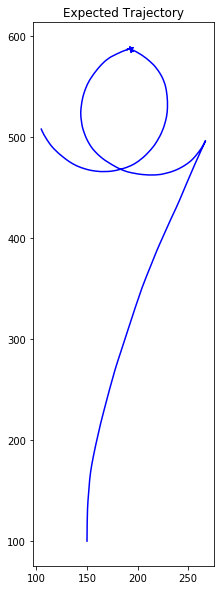

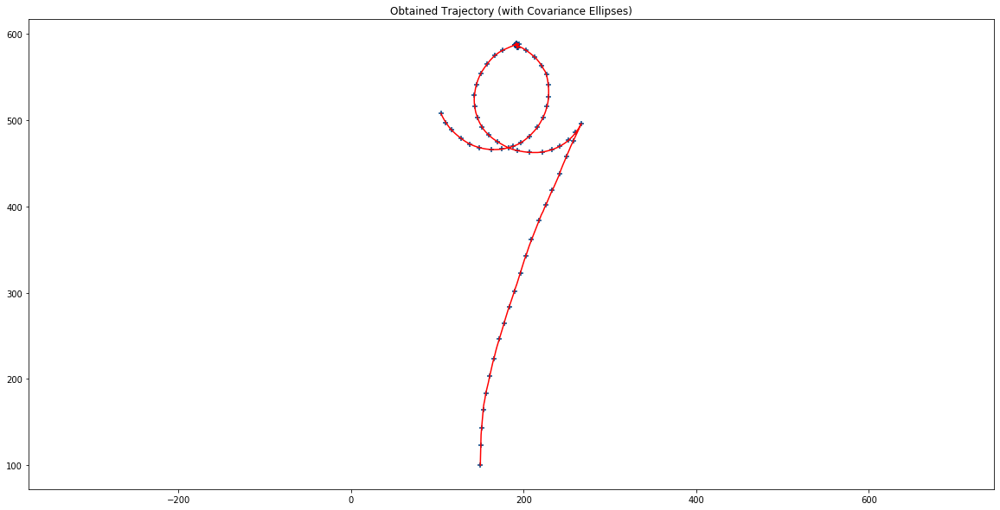

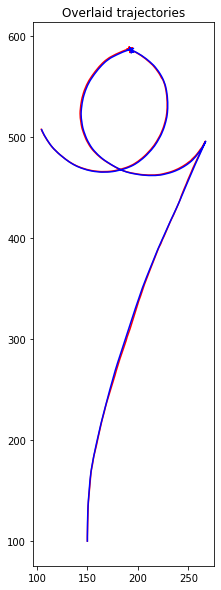

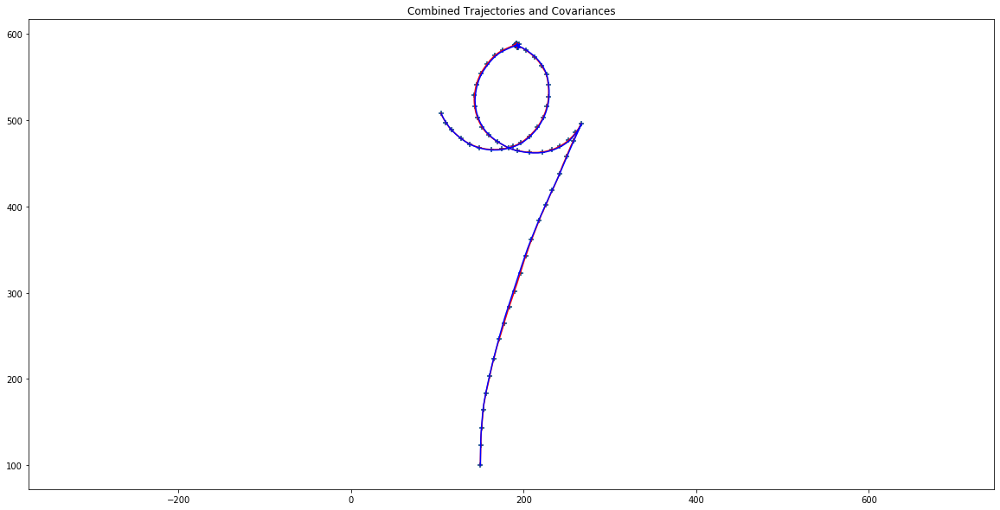

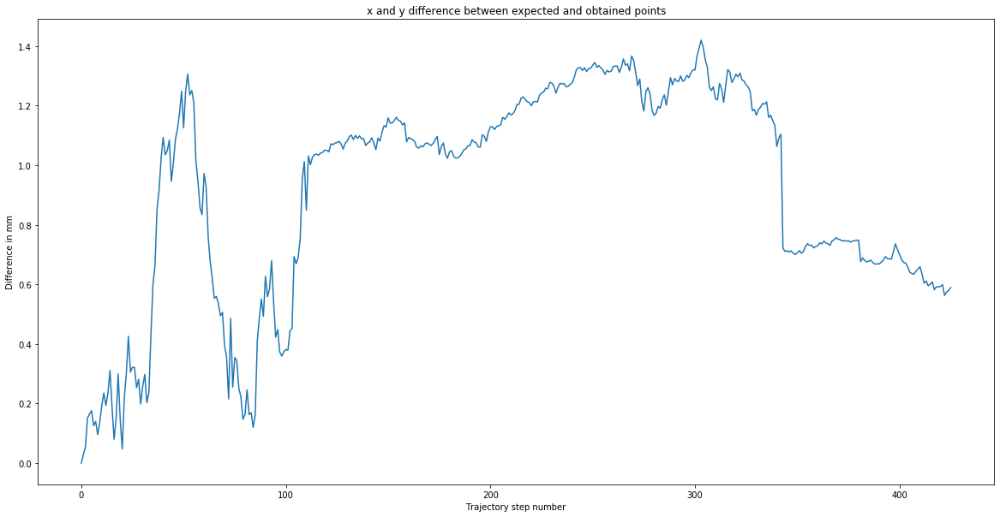

...

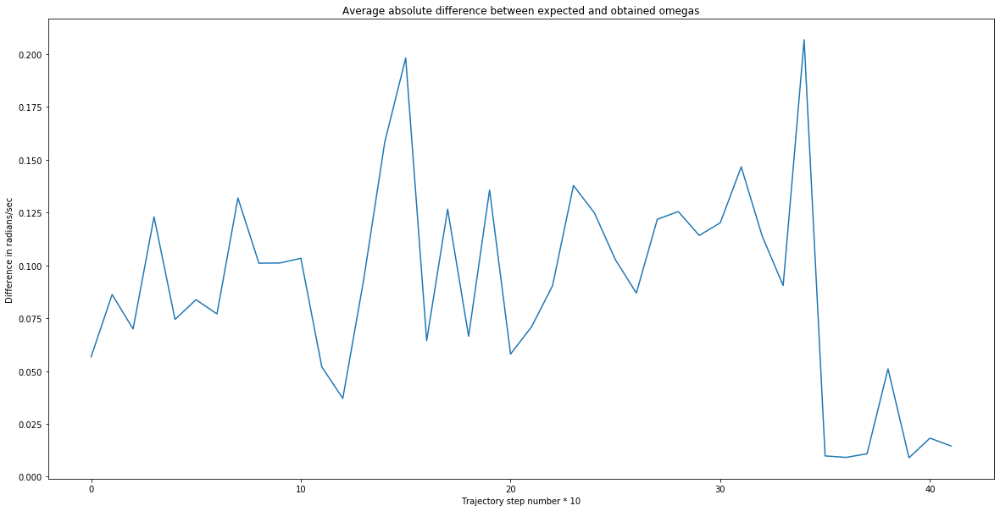

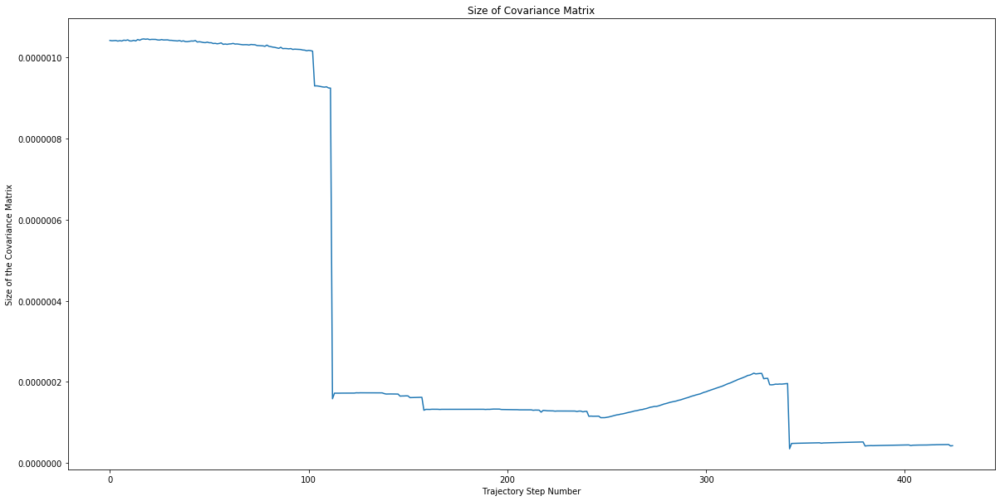

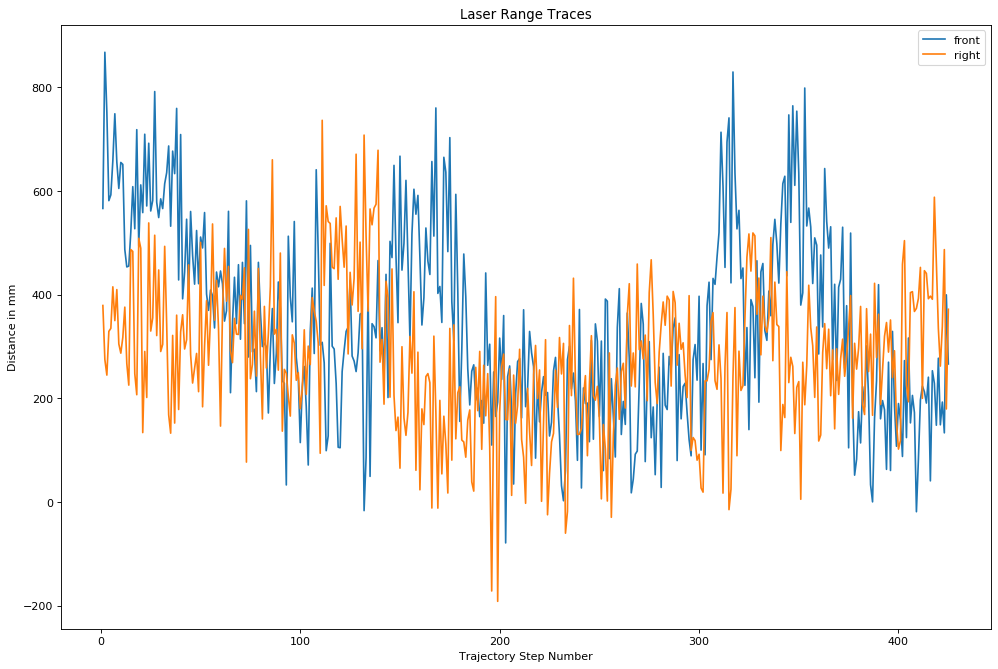

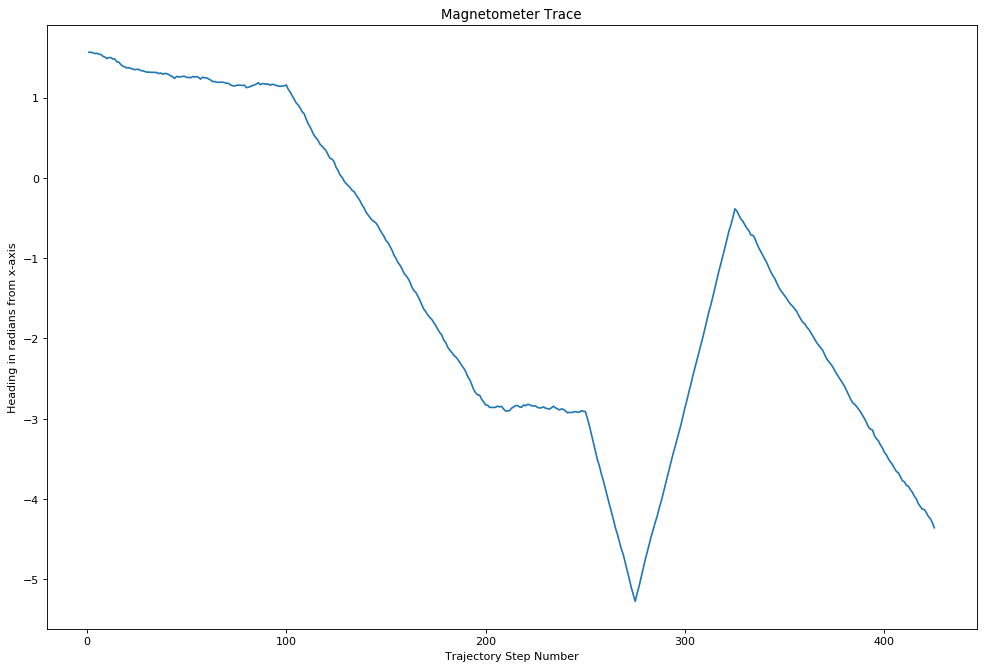

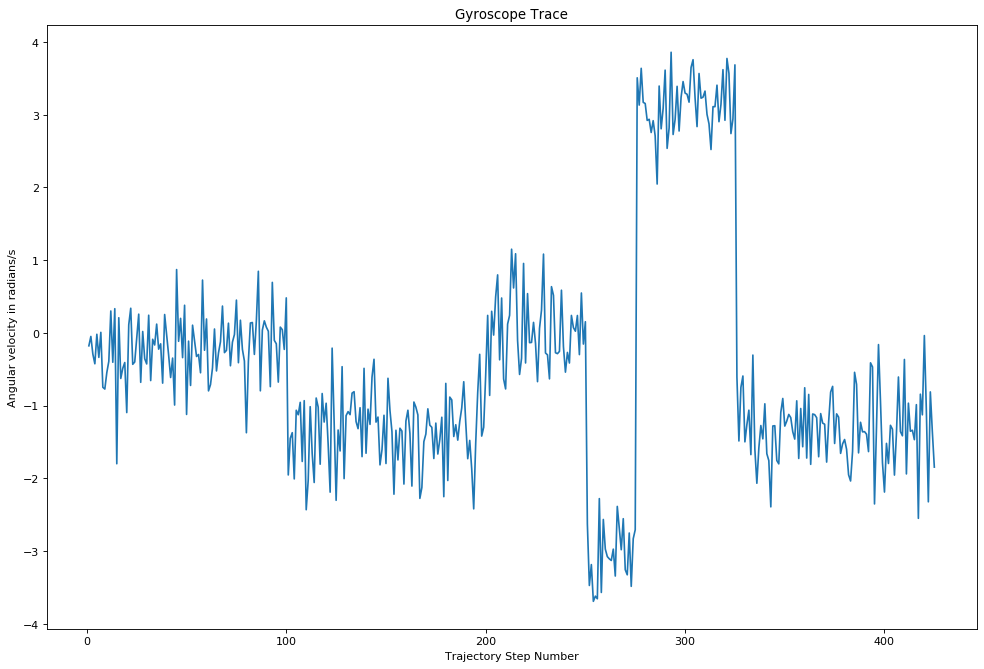

------
Mean Euclidean difference between expected and obtained points is 0.9163209723899053 mm
------
RMSE of expected and obtained thetas is 0.0001887290876495619 radians
------
RMSE of expected and obtained omega is 0.1456707963977747 radians/second
------


In [31]:
# Make system model
std_devs = [x*3 for x in [36, 36, 6.103515625e-5, 0.1, 3, 3]] # 3x the noise standard deviations
model = SystemModel(std_devs = std_devs)

# Set initial conditions
x_0 = State(x=150, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_7_known')
kf.run(u_list, covariance_step = 5, make_gif = False, known_x0 = True, with_velocity=True)

#### Example: Using better gyro fusion when state is unknown

Setting d_t to 0.030799999999999998, because sensors cannot process any faster


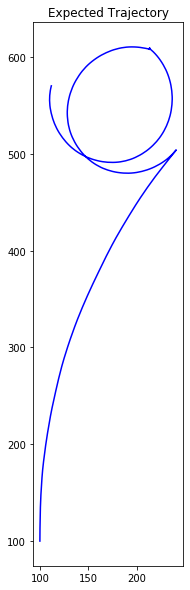

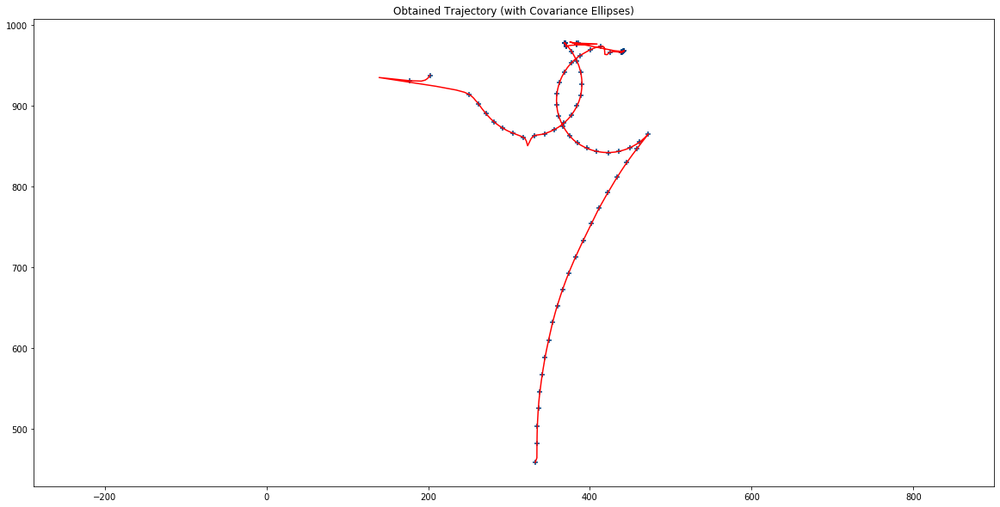

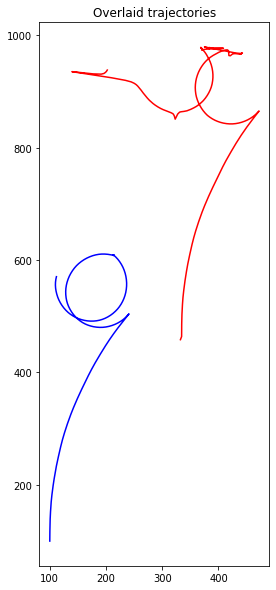

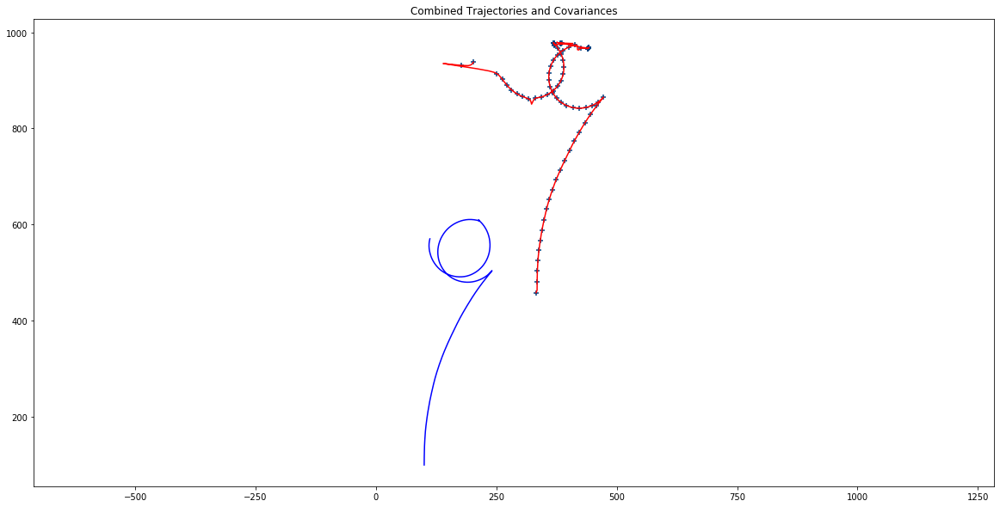

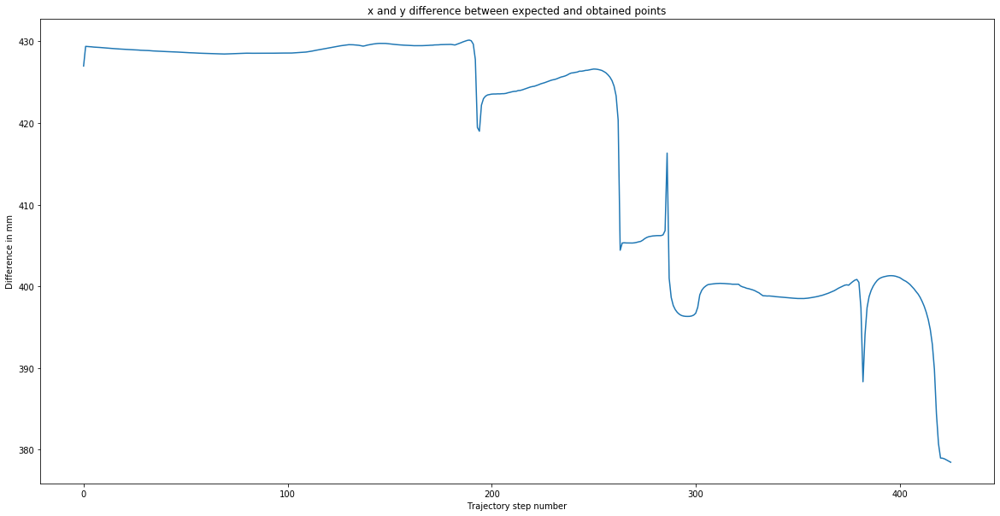

...

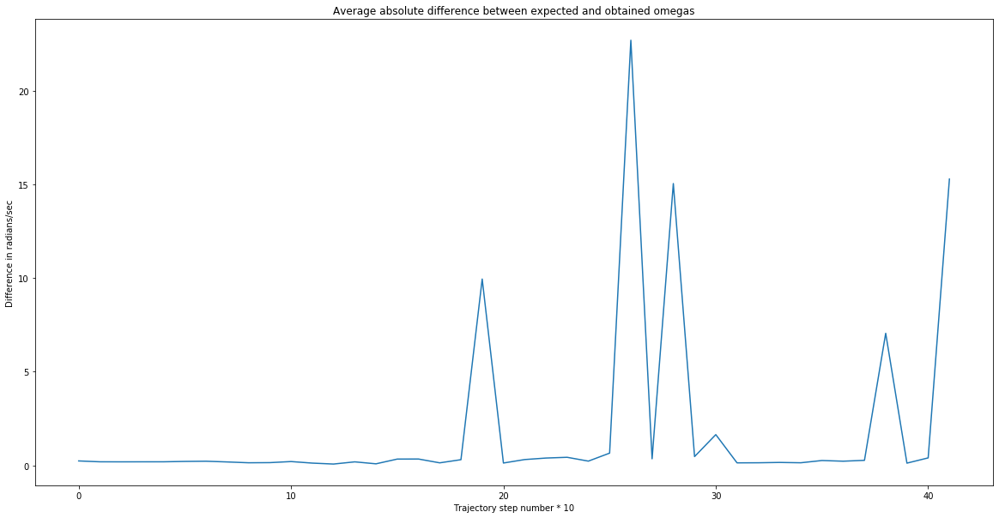

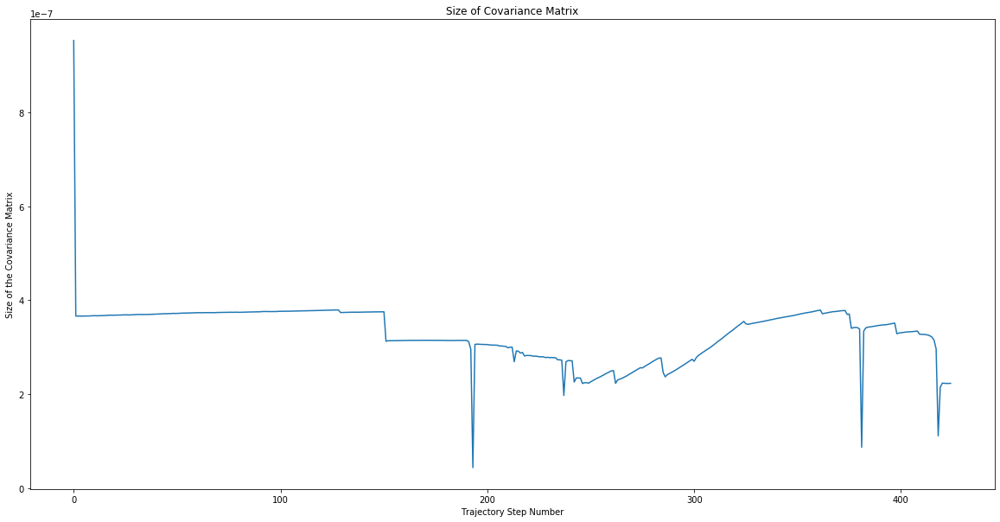

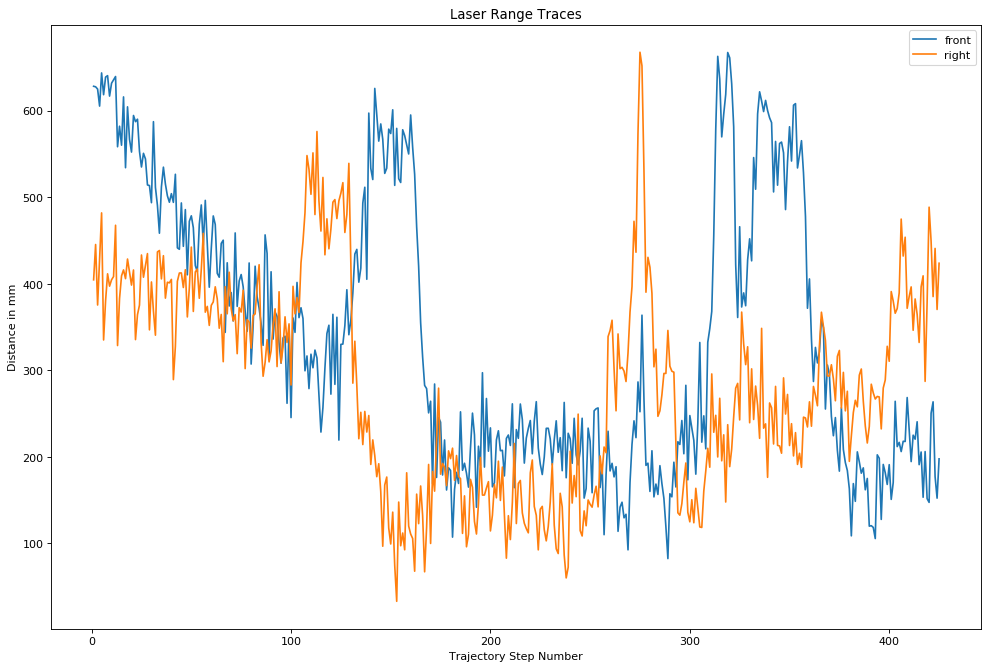

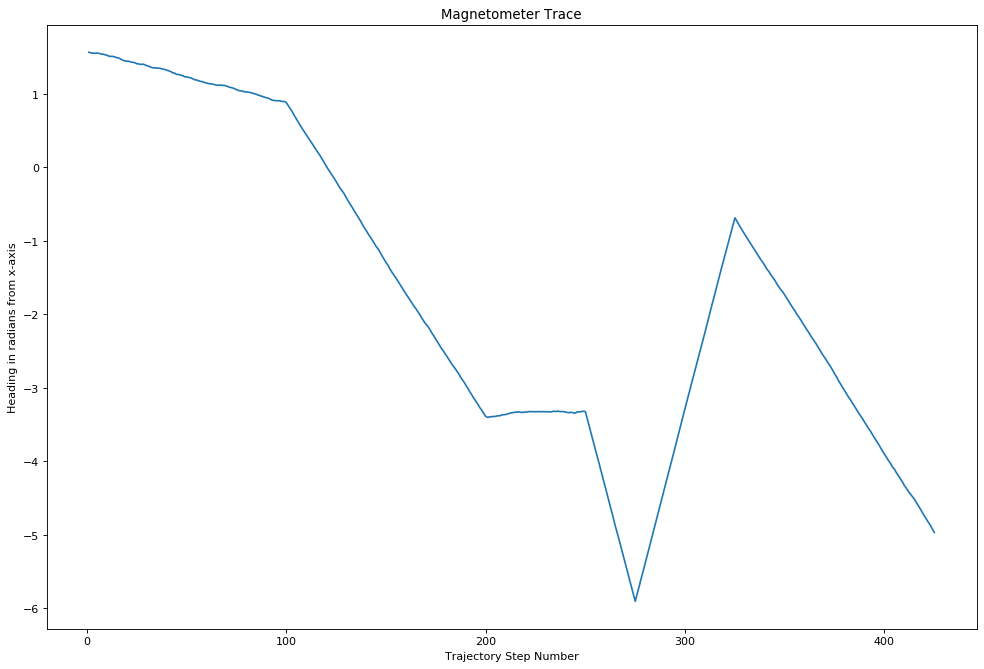

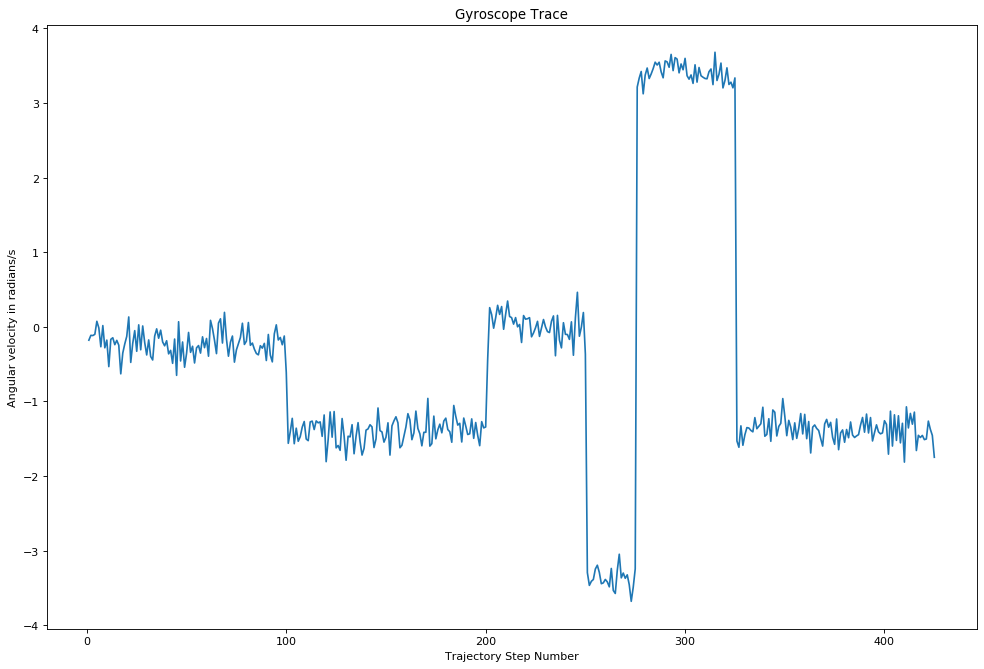

------
Mean Euclidean difference between expected and obtained points is 416.8850021864932 mm
------
RMSE of expected and obtained thetas is 0.05455400767918744 radians
------
RMSE of expected and obtained omega is 11.398628403728528 radians/second
------


In [28]:
# Make system model
model = SystemModel()

# Set initial conditions
x_0 = State(x=100, y=100, theta=math.pi/2, omega=0) # initialized omega to 0
sigma_0 = np.eye(4)

# Create inputs list
u_list = [[60, 50] for _ in range(100)] + \
         [[-10, -60] for _ in range(100)] + \
         [[0, 0] for _ in range(50)] + \
         [[60, -60] for _ in range(25)] + \
         [[-60, 60] for _ in range(50)] + \
         [[60, 10] for _ in range(100)]

# Perform Extended Kalman Filter
kf = ExtendedKalmanFilter(x_0, sigma_0, model, env, simulation_name='Eval_7_unknown')
kf.run(u_list, covariance_step = 5, make_gif = False, known_x0 = False, with_velocity=True)

### 3(d). How might you accomodate more realistic system models? 

For example, the gyro sensor doesn’t have zeromean additive noise; rather, the mean of the gyro noise is a slowly varying non-zero bias value. The actuator uncertainty (process noise) typically depends on the commanded speed itself. Describe the updates to the system model in these and other cases, and how that would impact your state estimator.

Described in our report.

### 3(e). Qualitatively describe some conclusions about the effectiveness of your state estimator for potential tasks your robot may encounter, and tradeoffs regarding yours vs other possible state estimation algorithms.

Described in our report.